# Packages

In [ ]:
import numpy as np
import pandas as pd
from pandas import Series
from pandas import DataFrame
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
plt.rc('figure', figsize=(12, 9))
np.set_printoptions(precision=4, suppress=True)

import urllib.request
import shutil

# Packages used in Chapter I.III and II.I for Choropleth Maps
import plotly.express as px

# Packages used in Chapter II.II in order to downloead data from OECD website
!pip install pandasdmx
import pandasdmx as pdmx

# Packages used in Chapter IV for Linear Regression and Classification
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 869.2 kB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/pandasdmx/remote.py:11: RuntimeWarning: optional dependency requests_cache is not installed; cache options to Session() have no effect
  warn(



# I° Chapter

## I.I. Datasets

### Emissions Dataset

The main dataset we will use contains the reported GHG emissions by european countries. The emissions are reported by country, pollutant, sector and year.


In [ ]:
# We download the dataset from EEA website, it's a 90MB csv file

url_emissions = "https://sdi.eea.europa.eu/datashare/s/nQm7mfWywfyLdLX/download"
!mkdir GLEMfolder
urllib.request.urlretrieve(url_emissions,"GLEMfolder/filesGLEM.zip")
shutil.unpack_archive("GLEMfolder/filesGLEM.zip","./GLEMfolder")

file_path = "./GLEMfolder/eea_t_national-emissions-reported_p_2023_v01_r01"
emissions_df = pd.read_csv(file_path + "/UNFCCC_v26.csv")

<ipython-input-2-a8b092056a82>:9: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  emissions_df = pd.read_csv(file_path + "/UNFCCC_v26.csv")


In [ ]:
# We get a warning. The problem is that some rows have a range of years '1985-1987' instead of a single year
# Some years are read as integers, some as strings
print(emissions_df.columns[8])
display(emissions_df.Year.unique())

# For now we convert all entries for Year to strings
emissions_df.Year = emissions_df.Year.astype(str)
emissions_df.Year.unique()

Year


array([1994, 1999, 2010, 2011, 1993, 1997, 1998, 2007, 2012, 2016, 2017,
       1996, 2001, 2004, 1991, 2003, 2009, 2005, 2018, 2006, 2019, 2021,
       2000, 1995, 2015, 2008, 2013, 2014, 2002, 2020, 1992, 1990, 1989,
       1985, 1987, 1988, 1986, '2016', '1991', '1995', '2011', '2012',
       '2013', '2018', '2002', '2021', '1997', '2001', '2020', '1992',
       '2000', '2007', '2008', '2010', '2019', '2003', '2005', '1999',
       '2009', '2017', '1990', '2014', '1998', '1993', '1996', '1994',
       '2004', '2006', '2015', '1989', '1988', '1986', '1987',
       '1985-1987', '1985'], dtype=object)

array(['1994', '1999', '2010', '2011', '1993', '1997', '1998', '2007',
       '2012', '2016', '2017', '1996', '2001', '2004', '1991', '2003',
       '2009', '2005', '2018', '2006', '2019', '2021', '2000', '1995',
       '2015', '2008', '2013', '2014', '2002', '2020', '1992', '1990',
       '1989', '1985', '1987', '1988', '1986', '1985-1987'], dtype=object)

In [ ]:
emissions_df.info()

# Full information about the reporting format can be found here:
# https://www.ipcc-nggip.iges.or.jp/public/2006gl/pdf/1_Volume1/V1_8_Ch8_Reporting_Guidance.pdf


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671236 entries, 0 to 671235
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Country_code        671236 non-null  object 
 1   Country             671236 non-null  object 
 2   Format_name         671236 non-null  object 
 3   Pollutant_name      671236 non-null  object 
 4   Sector_code         671236 non-null  object 
 5   Sector_name         671236 non-null  object 
 6   Parent_sector_code  614914 non-null  object 
 7   Unit                671236 non-null  object 
 8   Year                671236 non-null  object 
 9   emissions           404440 non-null  float64
 10  Notation            241059 non-null  object 
 11  PublicationDate     671236 non-null  int64  
 12  DataSource          671236 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 66.6+ MB


In [ ]:
emissions_df.Year.value_counts().sort_index()
# Data from 1989 and before is incomplete, we will start our analysis from 1990

1985           851
1985-1987      678
1986          1496
1987          1496
1988          2759
1989          3275
1990         20675
1991         20675
1992         20675
1993         20675
1994         20675
1995         20675
1996         20675
1997         20675
1998         20675
1999         20675
2000         20675
2001         20675
2002         20675
2003         20675
2004         20675
2005         20675
2006         20675
2007         20675
2008         20675
2009         20675
2010         20675
2011         20675
2012         20675
2013         20675
2014         20572
2015         20571
2016         20572
2017         20571
2018         20566
2019         20551
2020         20551
2021         20527
Name: Year, dtype: int64

In [ ]:
mask = emissions_df.Year.isin(["1985","1985-1987","1986","1987","1988","1989"])
emissions_df = emissions_df[~mask]

In [ ]:
# Now that we removed the years that gave us problems we can turn the strings back into integers
emissions_df["Year"] = emissions_df.Year.astype("int32")
emissions_df.Year.dtype

dtype('int32')

In [ ]:
emissions_df.isnull().sum()

Country_code               0
Country                    0
Format_name                0
Pollutant_name             0
Sector_code                0
Sector_name                0
Parent_sector_code     55296
Unit                       0
Year                       0
emissions             262034
Notation              423893
PublicationDate            0
DataSource                 0
dtype: int64

In [ ]:
emissions_df.Notation.value_counts()

NO               147718
—                 54375
NO,NA              9807
NO,IE              5689
NE                 3866
IE                 3830
NA,NO              2842
NO,NE              2414
NO,IE,NA            982
IE,NA               803
NE,NO               660
IE,NO               632
NO,NE,NA            623
NO,NE,IE            422
NE,IE               336
NE,NA               311
NO,NE,IE,NA         290
NO,NA,IE            229
IE,NE               184
C                   153
NA,NE,NO            126
IE,NA,NO             92
NA,NO,IE             85
NA,NE                64
NE,IE,NA             64
IE,NA,NE,NO          63
NO,NA,NE             50
NE,NA,NO             24
IE,NE,NO             24
NE,NO,IE             14
C,IE,NA,NE,NO        14
NO,C                  2
Name: Notation, dtype: int64

The meaning is:
+ NE: not estimated
+ IE: included elsewhere
+ C: confidantial information
+ NA: not applicable
+ NO: not occurring

In [ ]:
print("number of rows where the emissions and the notation are both missing -->",(emissions_df.emissions.isna() & emissions_df.Notation.isna()).sum())
print("number of rows where the emissions are missing and the notation is present -->",(emissions_df.emissions.isna() & emissions_df.Notation.notna()).sum())

number of rows where the emissions and the notation are both missing --> 25246
number of rows where the emissions are missing and the notation is present --> 236788


The *Notation* column predominantly provides explanations for instances where emissions are marked as 'NA.' To enhance the efficiency of the data frame, we have decided to eliminate this column.

In [ ]:
print(emissions_df.DataSource.unique())
print(emissions_df.PublicationDate.unique())
print(emissions_df.Format_name.unique())
print(emissions_df.Unit.unique())

['EEA']
[20231006]
['IPCC Common Reporting Format']
['Gg CO2 equivalent' 'Gg']


The columns we are interested in are only 5 out of 13.

We only need one of *Country* and *Country_Code*.

Also only one of *Sector*, *Sector_code*, *Parent_sector_code* is needed.

*Format_name*, *DataSource*, *PublicationDate* are the same for every row.

The unit is always Gigagram (1 million kg or 1000 tons) or Co2 equivalent of Gigagram, so we can drop that column as well

In [ ]:
chosen_columns = ["Country","Sector_name","Pollutant_name","Year","emissions"]

emissions_df = emissions_df.reindex(columns = chosen_columns)
emissions_df

,Country,Sector_name,Pollutant_name,Year,emissions
0,Austria,- 4(IV) Indirect N2O Emissions from Managed S...,All greenhouse gases - (CO2 equivalent),1994,12.62568
1,Austria,- 4(IV) Indirect N2O Emissions from Managed S...,All greenhouse gases - (CO2 equivalent),1999,11.86116
2,Austria,- 4(IV) Indirect N2O Emissions from Managed S...,All greenhouse gases - (CO2 equivalent),2010,12.66384
3,Austria,- 4(IV) Indirect N2O Emissions from Managed S...,All greenhouse gases - (CO2 equivalent),2011,12.59482
4,Austria,1 - Energy,All greenhouse gases - (CO2 equivalent),1993,52087.32124
...,...,...,...,...,...
671231,Türkiye,Total emissions with international transport (...,Unspecified mix of HFCs and PFCs - (CO2 equiva...,2020,NaN
671232,Türkiye,Total net emissions (UNFCCC),Unspecified mix of HFCs and PFCs - (CO2 equiva...,1996,NaN
671233,Türkiye,Total net emissions with international aviatio...,Unspecified mix of HFCs and PFCs - (CO2 equiva...,1998,NaN
671234,Türkiye,Total net emissions with international transpo...,Unspecified mix of HFCs and PFCs - (CO2 equiva...,1998,NaN


In [ ]:
emissions_df.Country.unique()

array(['Austria', 'Belgium', 'Bulgaria', 'Switzerland', 'Cyprus',
       'Czechia', 'Germany', 'Denmark', 'Estonia', 'Spain', 'EU-27',
       'Finland', 'France', 'Greece', 'Croatia', 'Hungary', 'Ireland',
       'Iceland', 'Italy', 'Lithuania', 'Luxembourg', 'Latvia', 'Malta',
       'Netherlands', 'Norway', 'Poland', 'Portugal', 'Romania', 'Sweden',
       'Slovenia', 'Slovakia', 'Türkiye'], dtype=object)

In [ ]:
# We can remove the rows with countries that are not in EU-27:
# Iceland, Norway, Switzerland, Türkiye

mask = emissions_df.Country.isin(["Iceland","Norway","Switzerland","Türkiye"])
emissions_df = emissions_df[~mask]

In [ ]:
# We will remove some sectors, since there are so many of them and we mostly want to look at overall emissions
print(emissions_df.Sector_name.unique().size)
np.sort(emissions_df.Sector_name.unique())

172


array(['- 4(IV)  Indirect N2O Emissions from Managed Soils', '1 - Energy',
       '1.A.1 - Energy Industries',
       '1.A.1.a - Public Electricity and Heat Production',
       '1.A.1.b - Petroleum Refining',
       '1.A.1.c - Manufacture of Solid Fuels and Other Energy Industries',
       '1.A.2 - Manufacturing Industries and Construction',
       '1.A.2.a - Iron and Steel', '1.A.2.b - Non-Ferrous Metals',
       '1.A.2.c - Chemicals', '1.A.2.d - Pulp, Paper and Print',
       '1.A.2.e - Food Processing, Beverages and Tobacco',
       '1.A.2.f - Non-metallic minerals',
       '1.A.2.g - Other Manufacturing Industries and Constructions',
       '1.A.3 - Transport', '1.A.3.a - Domestic Aviation',
       '1.A.3.b - Road Transportation', '1.A.3.b.i - Cars',
       '1.A.3.b.ii - Light duty trucks',
       '1.A.3.b.iii - Heavy duty trucks and buses',
       '1.A.3.b.iv - Motorcycles',
       '1.A.3.b.v - Other Road Transportation', '1.A.3.c - Railways',
       '1.A.3.d - Domestic Navigation

The main sectors are:


1.   Energy
2.   Industrial Processes and Product Use
3.   Agriculture
4.   Land Use, Land-Use Change and Forestry
5.   Waste management
6.   Other (most of this data is NA)



In [ ]:
# We will keep the following ones:

sectors_to_keep = '''
1 - Energy
1.A.1 - Energy Industries
1.A.2 - Manufacturing Industries and Construction
1.A.3 - Transport
1.A.4 - Other Sectors
1.A.5 - Other Other Sectors
1.AA - Fuel Combustion - Sectoral approach
1.B - Fugitive Emissions from Fuels
1.B.1 - Solid Fuels
1.B.2 - Oil and Natural Gas and Other Emissions from Energy Production
1.C - CO2 Transport and Storage
1.D.1 - International Bunkers
1.D.2 - Multilateral Operations
1.D.3 - CO2 emissions from biomass
2 - Industrial Processes and Product Use
2.A - Mineral Industry
2.B - Chemical Industry
2.C - Metal Industry
2.D - Non-energy Products from Fuels and Solvent Use
2.E - Electronics Industry
2.F - Product Uses as Substitutes for ODS
2.G - Other Product Manufacture and Use
2.H - Other Industrial Process and Product Use
3 - Agriculture
3.1 - Livestock
3.A - Enteric Fermentation
3.B - Manure Management
3.C - Rice Cultivation
3.D - Agricultural Soils
3.E - Prescribed Burning of Savannas
3.F - Field Burning of Agricultural Residues
3.G - Liming
3.H - Urea Application
3.I - Other Carbon-containing Fertilizers
3.J - Other agriculture emissions
4 - Land Use, Land-Use Change and Forestry
4.A - Forest Land
4.B - Cropland
4.C - Grassland
4.D - Wetlands
4.E - Settlements
4.F - Other Land
4.G - Harvested Wood Products
4.H - Other LULUCF
5 - Waste management
5.A - Solid Waste Disposal
5.B - Biological Treatment of Solid Waste
5.C - Incineration and Open Burning of Waste
5.D - Wastewater Treatment and Discharge
5.E - Other Disposal
6 - Other Sector
Total emissions (UNFCCC)
Total emissions with international aviation (EU 2020)
Total emissions with international transport (EEA)
Total net emissions (UNFCCC)
Total net emissions with international aviation (EU NDC)
Total net emissions with international transport (EEA)
ind_CO2 - Indirect CO2
'''

mask = emissions_df.Sector_name.isin(sectors_to_keep.split(sep = "\n")[1:-1])
emissions_df = emissions_df[mask]

In [ ]:
print(emissions_df.Sector_name.unique().size)
np.sort(emissions_df.Sector_name.unique())

58


array(['1 - Energy', '1.A.1 - Energy Industries',
       '1.A.2 - Manufacturing Industries and Construction',
       '1.A.3 - Transport', '1.A.4 - Other Sectors',
       '1.A.5 - Other Other Sectors',
       '1.AA - Fuel Combustion - Sectoral approach',
       '1.B - Fugitive Emissions from Fuels', '1.B.1 - Solid Fuels',
       '1.B.2 - Oil and Natural Gas and Other Emissions from Energy Production',
       '1.C - CO2 Transport and Storage', '1.D.1 - International Bunkers',
       '1.D.2 - Multilateral Operations',
       '1.D.3 - CO2 emissions from biomass',
       '2 - Industrial Processes and Product Use',
       '2.A - Mineral Industry', '2.B - Chemical Industry',
       '2.C - Metal Industry',
       '2.D - Non-energy Products from Fuels and Solvent Use',
       '2.E - Electronics Industry',
       '2.F - Product Uses as Substitutes for ODS',
       '2.G - Other Product Manufacture and Use',
       '2.H - Other Industrial Process and Product Use',
       '3 - Agriculture', '3.1 - 

Now that the DataFrame is smaller and contains the relevant information for our analysis, we can start the exploration of the data. We plot the time series of emissions for all 27 EU countries as well as the total.

In [ ]:
# It becomes more useful to reindex the dataframe with pandas' Multiindex feature
df_emissions_multiindex = emissions_df.set_index(["Country","Pollutant_name", "Sector_name", "Year"]).sort_index()
df_emissions_multiindex.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 233742 entries, ('Austria', 'All greenhouse gases - (CO2 equivalent)', '1 - Energy', 1990) to ('Sweden', 'Unspecified mix of HFCs and PFCs - (CO2 equivalent)', 'Total net emissions with international transport (EEA)', 2021)
Data columns (total 1 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   emissions  154770 non-null  float64
dtypes: float64(1)
memory usage: 2.7+ MB


We make one plot per country, with one line per sector. For now we only look at All GHGs as pollutant.

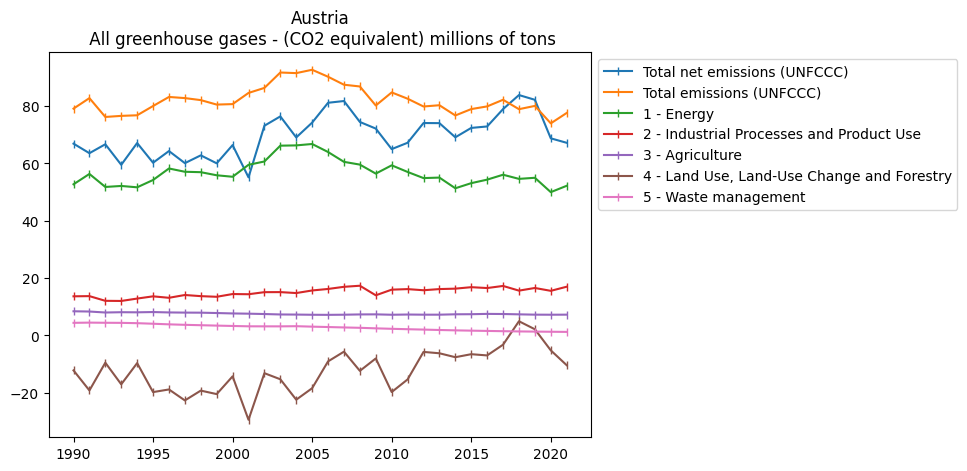

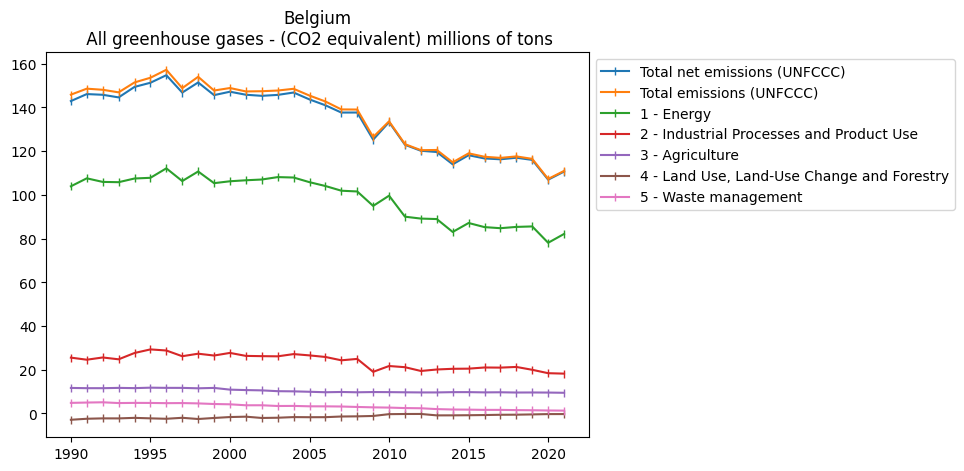

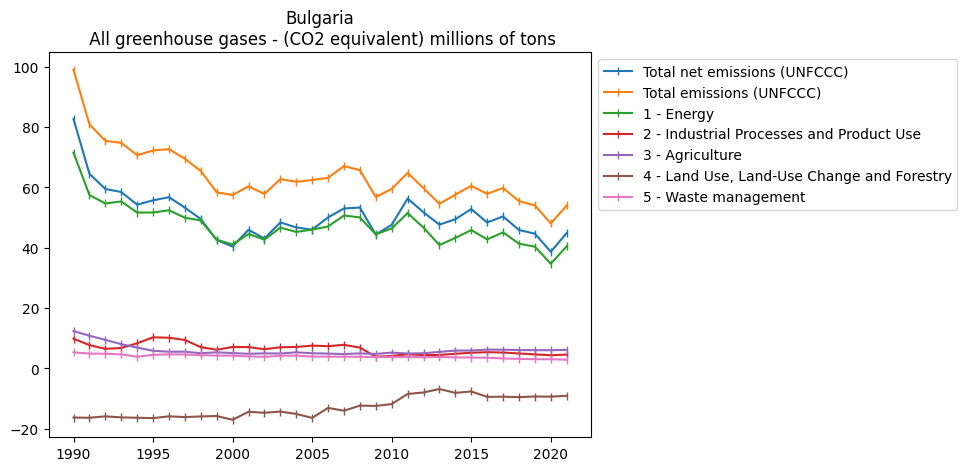

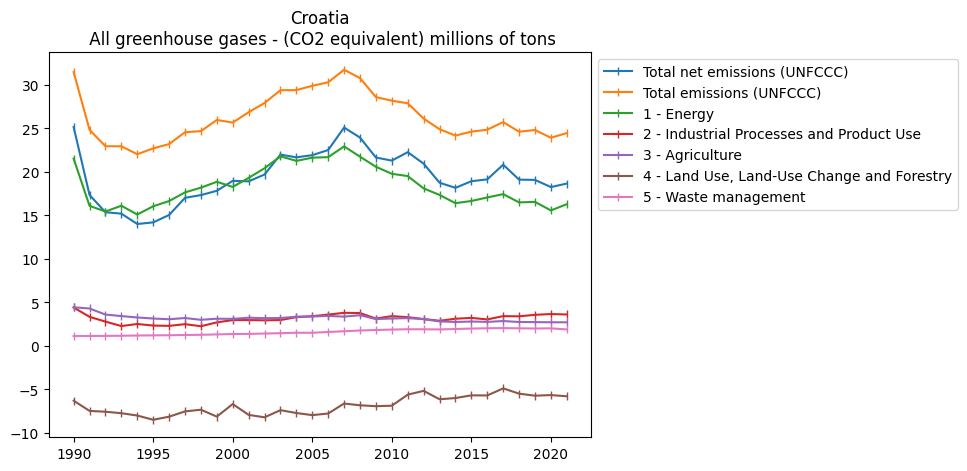

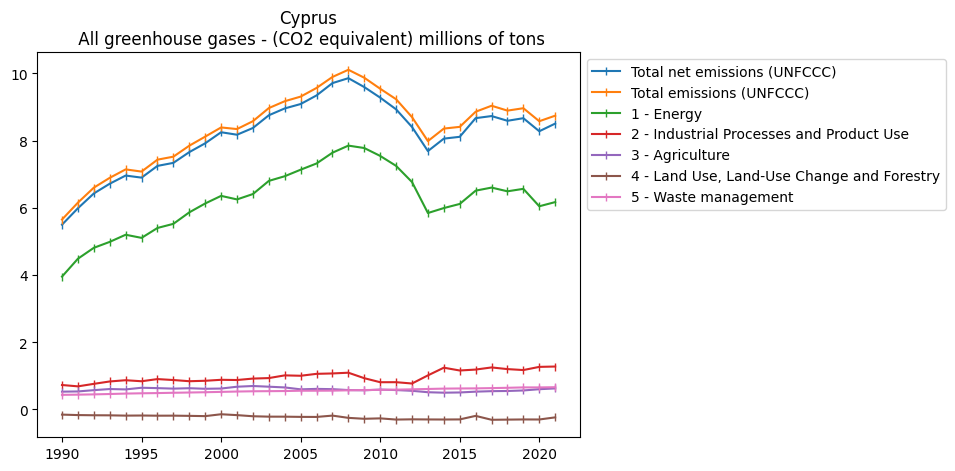

...

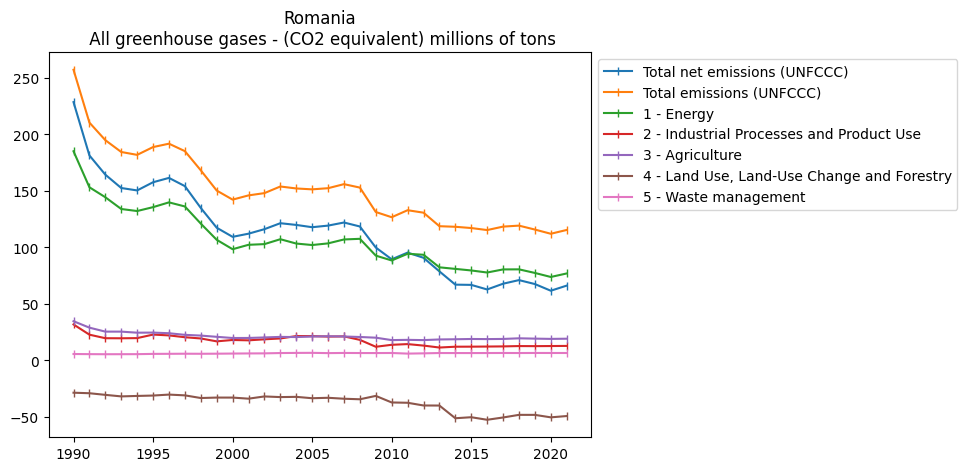

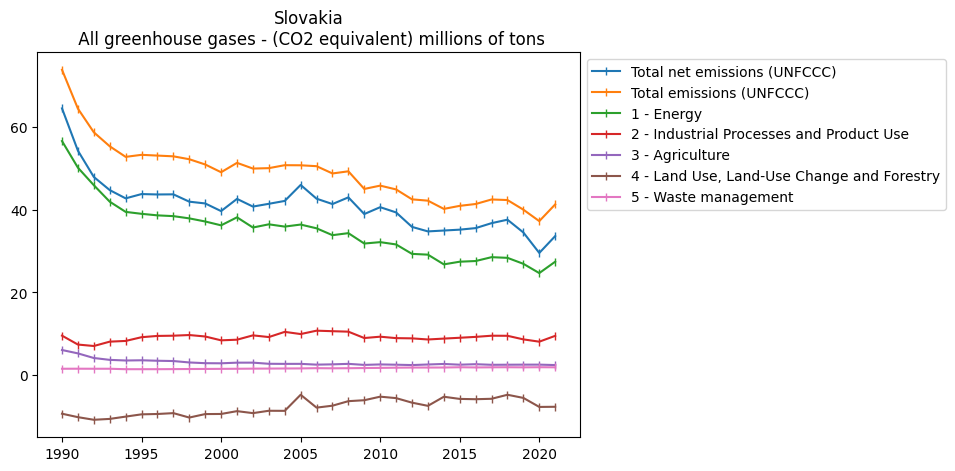

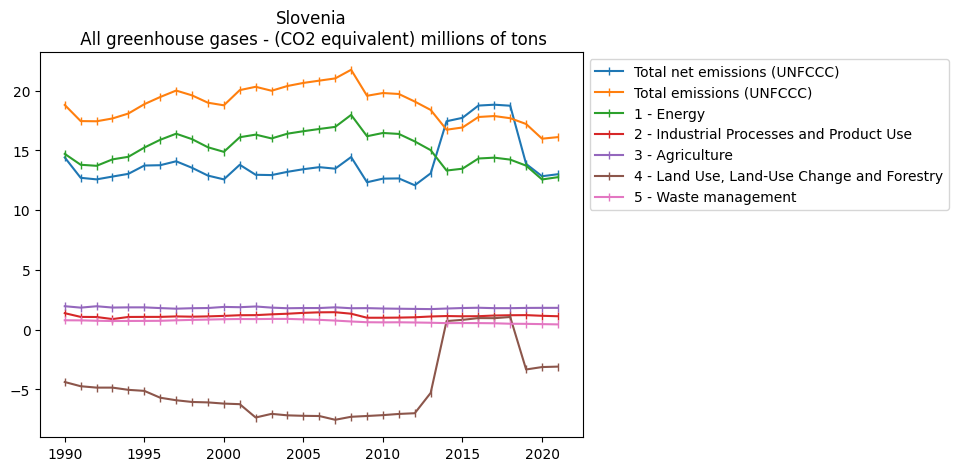

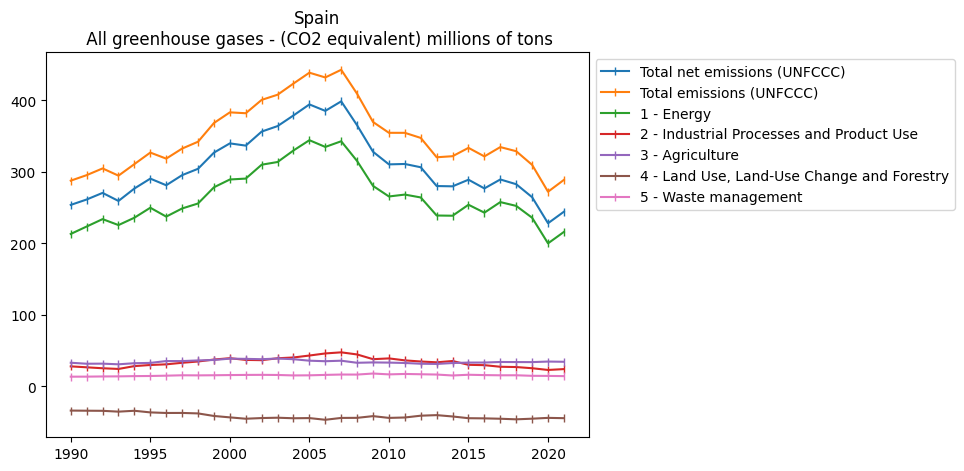

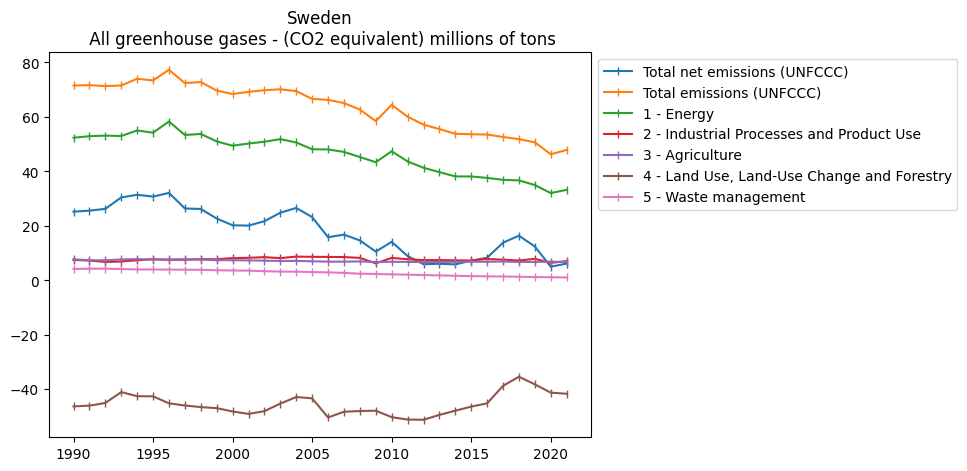

In [ ]:
countries = np.sort(emissions_df.Country.unique())
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (7,5))

for country in countries:
    for sector in chosen_sectors:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            plt.plot(df_to_plot.emissions/1000, label = sector, marker = "|")
            plt.title(country +"\n "+ pollutant + " millions of tons")
            plt.legend(bbox_to_anchor=(1, 1))
        except KeyError:
            print(country, pollutant, sector ," was not found")
    plt.show()


Now we plot the same data, but we make one plot per sector and compare some countries.

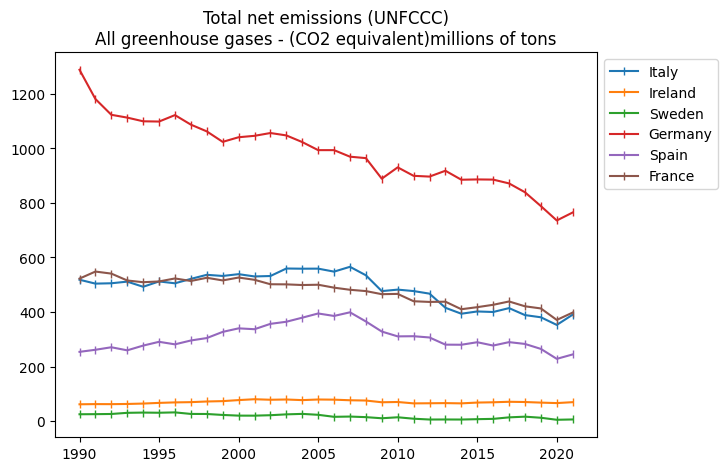

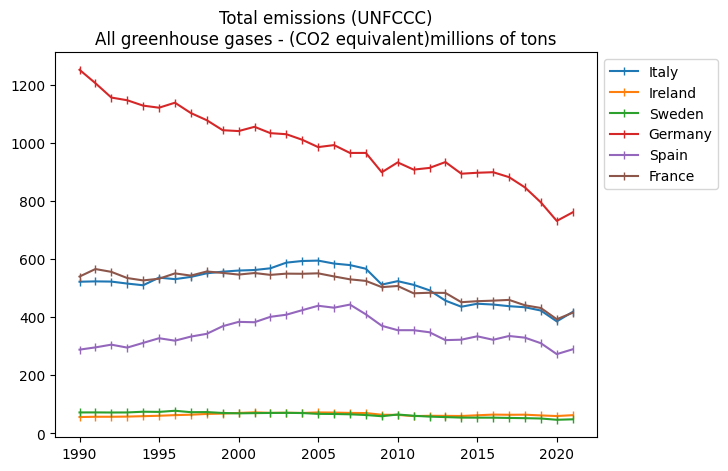

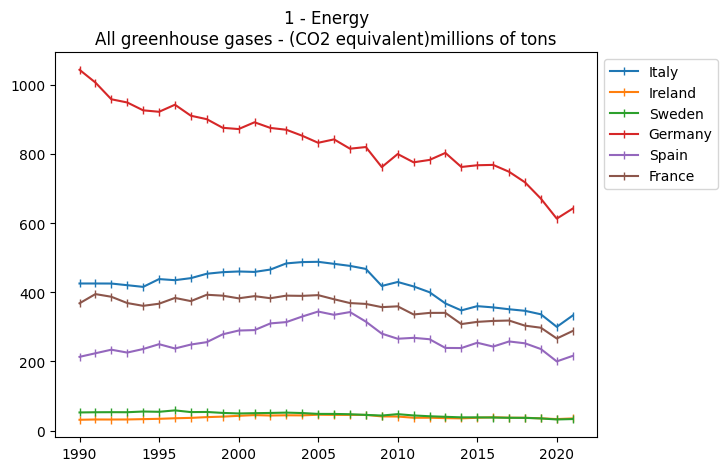

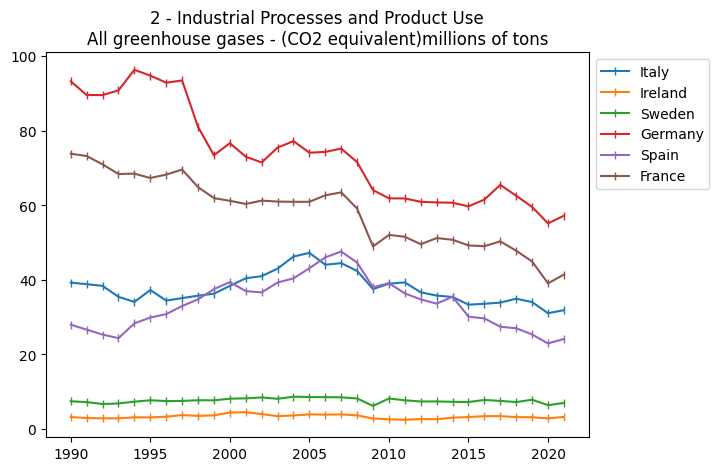

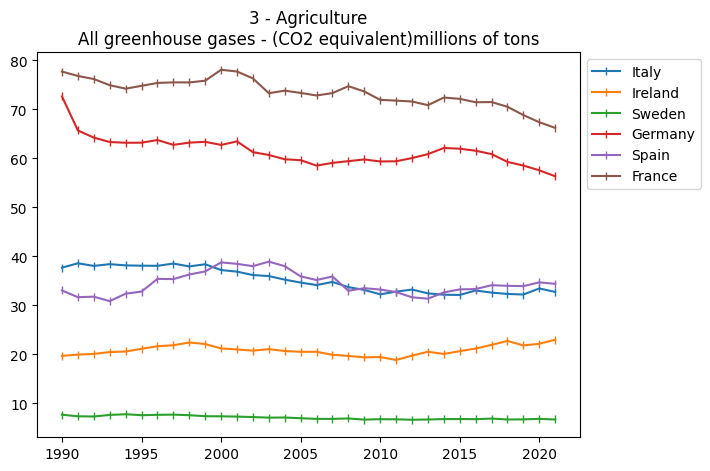

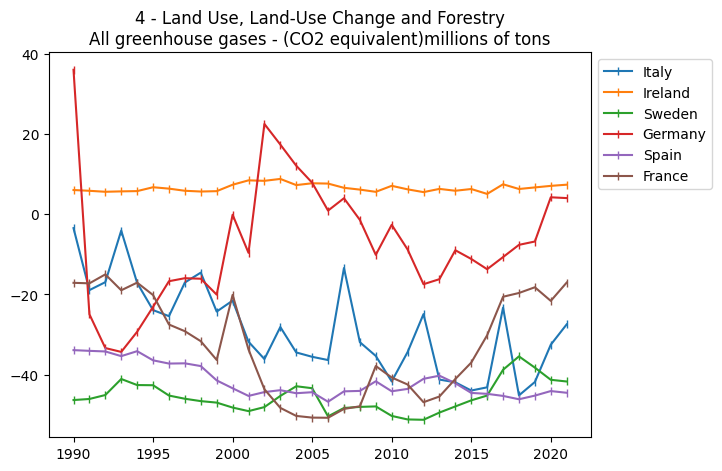

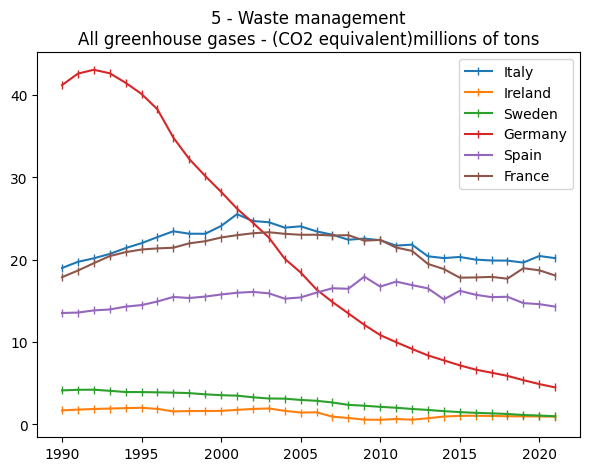

In [ ]:
countries = ['Italy', 'Ireland', 'Sweden', 'Germany', "Spain","France"]
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (7,5))

for sector in chosen_sectors:
    for country in countries:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            plt.plot(df_to_plot.emissions/1000,label = country, marker = "|")
        except KeyError:
            print(country, pollutant, sector, "gave a key error")
    plt.title(sector + "\n" + pollutant + "millions of tons")
    plt.legend(bbox_to_anchor=(1, 1))
    plt.show()

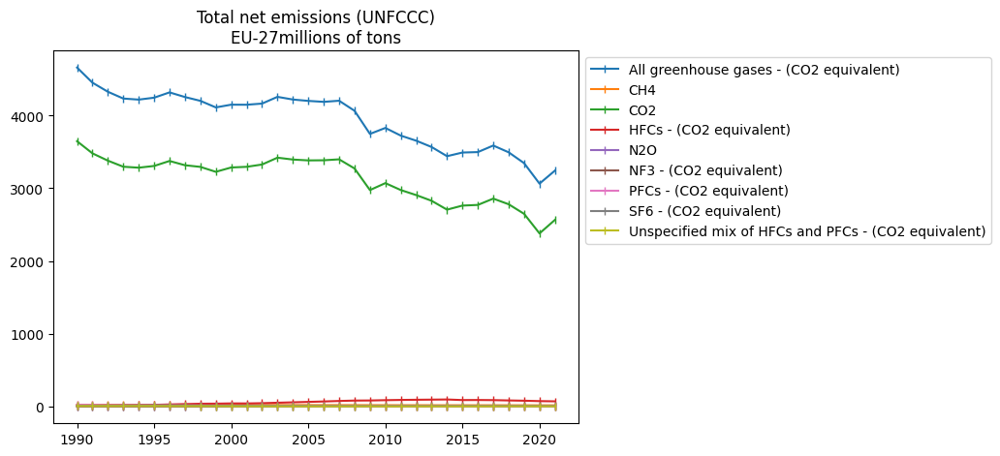

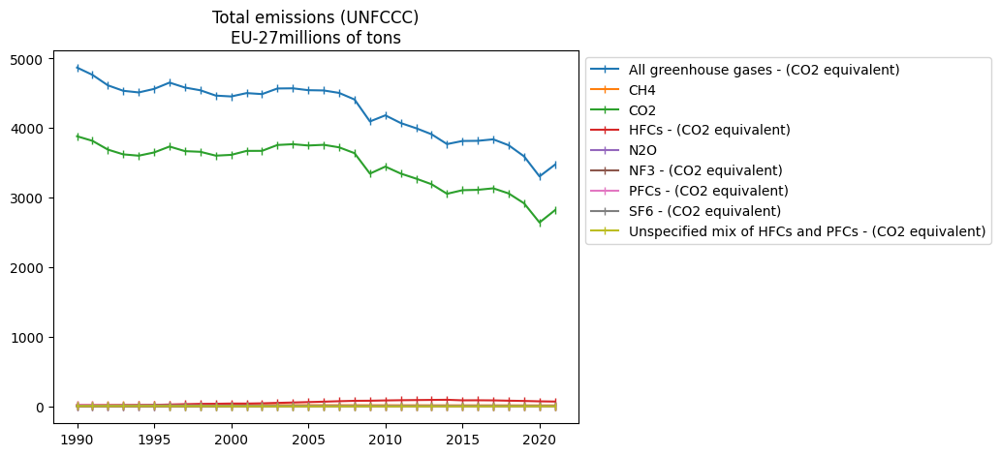

EU-27 HFCs - (CO2 equivalent) 1 - Energy gave a key error
EU-27 NF3 - (CO2 equivalent) 1 - Energy gave a key error
EU-27 PFCs - (CO2 equivalent) 1 - Energy gave a key error
EU-27 SF6 - (CO2 equivalent) 1 - Energy gave a key error
EU-27 Unspecified mix of HFCs and PFCs - (CO2 equivalent) 1 - Energy gave a key error


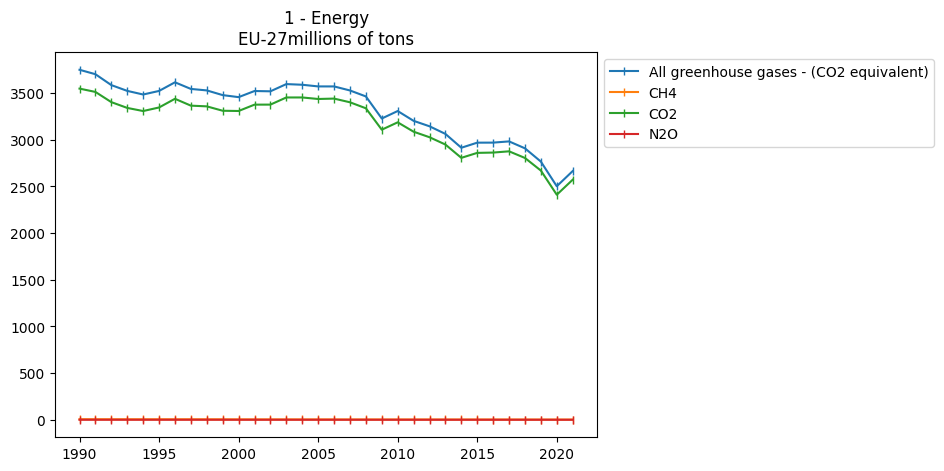

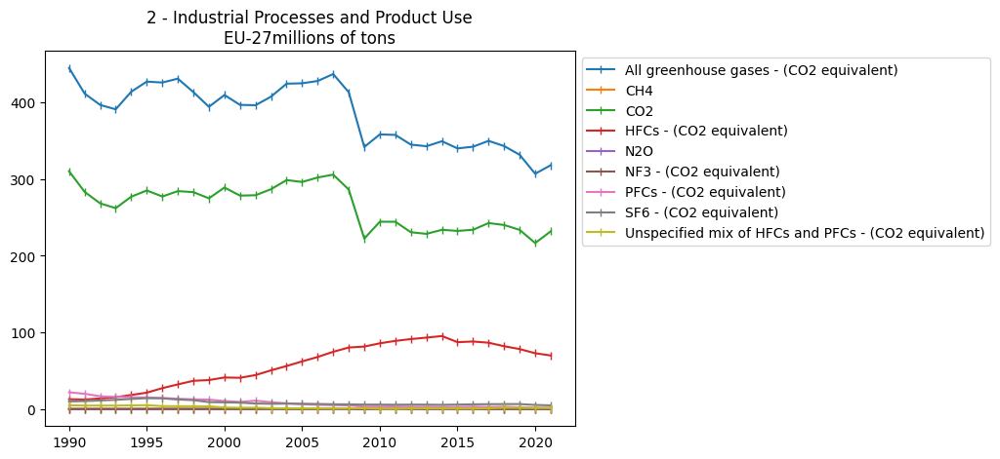

EU-27 HFCs - (CO2 equivalent) 3 - Agriculture gave a key error
EU-27 NF3 - (CO2 equivalent) 3 - Agriculture gave a key error
EU-27 PFCs - (CO2 equivalent) 3 - Agriculture gave a key error
EU-27 SF6 - (CO2 equivalent) 3 - Agriculture gave a key error
EU-27 Unspecified mix of HFCs and PFCs - (CO2 equivalent) 3 - Agriculture gave a key error


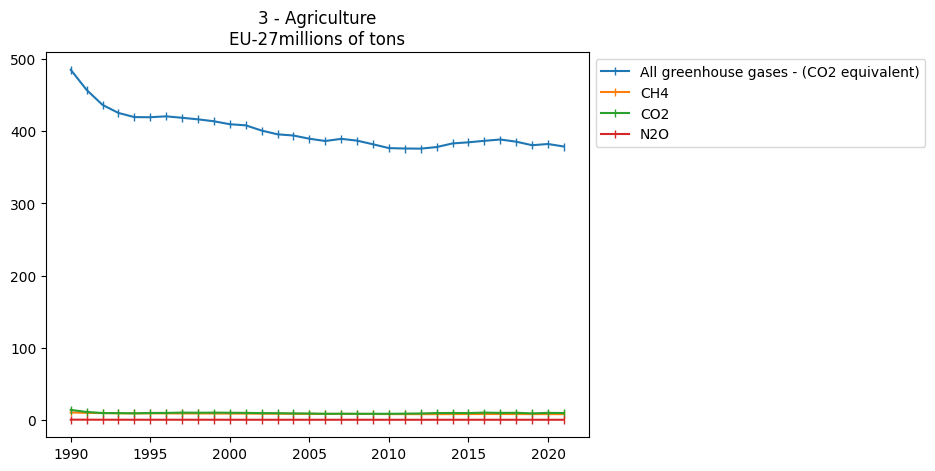

EU-27 HFCs - (CO2 equivalent) 4 - Land Use, Land-Use Change and Forestry gave a key error
EU-27 NF3 - (CO2 equivalent) 4 - Land Use, Land-Use Change and Forestry gave a key error
EU-27 PFCs - (CO2 equivalent) 4 - Land Use, Land-Use Change and Forestry gave a key error
EU-27 SF6 - (CO2 equivalent) 4 - Land Use, Land-Use Change and Forestry gave a key error
EU-27 Unspecified mix of HFCs and PFCs - (CO2 equivalent) 4 - Land Use, Land-Use Change and Forestry gave a key error


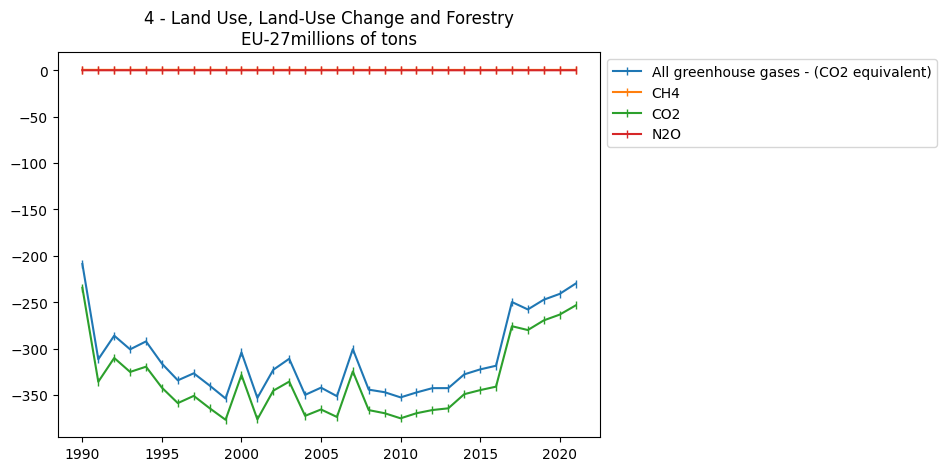

EU-27 HFCs - (CO2 equivalent) 5 - Waste management gave a key error
EU-27 NF3 - (CO2 equivalent) 5 - Waste management gave a key error
EU-27 PFCs - (CO2 equivalent) 5 - Waste management gave a key error
EU-27 SF6 - (CO2 equivalent) 5 - Waste management gave a key error
EU-27 Unspecified mix of HFCs and PFCs - (CO2 equivalent) 5 - Waste management gave a key error


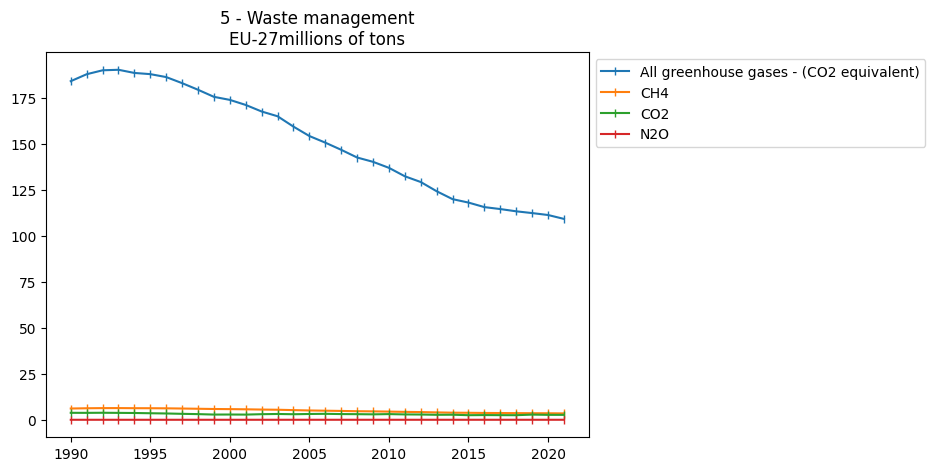

In [ ]:
country = "EU-27"
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']


def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (7,5))

for sector in chosen_sectors:
    for pollutant in emissions_df.Pollutant_name.unique():
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            plt.plot(df_to_plot.emissions/1000,label = pollutant, marker = '|')
        except KeyError:
            print(country, pollutant, sector, "gave a key error")
    plt.title(sector + "\n" + country + "millions of tons")
    plt.legend(bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
emissions_df.Pollutant_name.value_counts()

All greenhouse gases - (CO2 equivalent)                51770
CH4                                                    42743
CO2                                                    41815
N2O                                                    40059
PFCs - (CO2 equivalent)                                11787
HFCs - (CO2 equivalent)                                11759
SF6 - (CO2 equivalent)                                 11619
Unspecified mix of HFCs and PFCs - (CO2 equivalent)    11191
NF3 - (CO2 equivalent)                                 10999
Name: Pollutant_name, dtype: int64

### Population Dataset


Firstly, we decide to derive our own data regarding population through the OECD database.

In [ ]:
urllib.request.urlretrieve("https://stats.oecd.org/sdmx-json/data/DP_LIVE/AUT+BEL+BGR+CYP+CZE+DEU+DNK+ESP+EST+EU27+FIN+FRA+GRC+HRV+HUN+IRL+ITA+LTU+LUX+LVA+MLT+NLD+OECD+POL+PRT+ROU+SVK+SVN+SWE.POP.TOT.MLN_PER.A/OECD?contentType=csv&detail=code&separator=comma&csv-lang=en&startPeriod=1990&endPeriod=2022", "GLEMfolder/population.csv")
Data_Pop = pd.read_csv("GLEMfolder/population.csv")

In [ ]:
# Through the use of drop I went to select only the data that we needed
# first, I excluded from LOCATION: the OECD data that we were not interested in
# then I proceeded with the SUBJECT column by selecting only the TOTs and excluding therefore
# MEN and WOMEN

Data_Pop.drop(Data_Pop[(Data_Pop['SUBJECT'] != 'TOT')].index, inplace = True)
Data_Pop.drop(Data_Pop[(Data_Pop['LOCATION'] == 'OECD')].index, inplace = True)

# Then I eliminated the columns that have uninteresting values
delete = ["INDICATOR","FREQUENCY", "Flag Codes", 'MEASURE', 'SUBJECT']
Data_Pop.drop(columns = delete, inplace = True)

# I've replaced the name of the column and the index to make the dataset more understandable
Data_Pop = Data_Pop.replace('MLN_PER','MLN')

INDEX = [x for x in range(len(Data_Pop["LOCATION"]))]
Data_Pop['INDEX'] = INDEX

Data_Pop = Data_Pop.set_index('INDEX')

# Final Result
Data_Pop

,LOCATION,TIME,Value
INDEX,,,
0,AUT,1990,7.677850
1,AUT,1991,7.754891
2,AUT,1992,7.840709
3,AUT,1993,7.905632
4,AUT,1994,7.936118
...,...,...,...
919,EU27,2018,446.457200
920,EU27,2019,447.402405
921,EU27,2020,447.805543


In [ ]:
# I verified that all countries were present and that everything was correct
Data_Pop['LOCATION'].unique()

array(['AUT', 'BEL', 'CZE', 'DNK', 'FIN', 'FRA', 'DEU', 'GRC', 'HUN',
       'IRL', 'ITA', 'LUX', 'NLD', 'POL', 'PRT', 'SVK', 'ESP', 'SWE',
       'EST', 'SVN', 'LVA', 'BGR', 'HRV', 'CYP', 'LTU', 'MLT', 'ROU',
       'EU27'], dtype=object)

## I.II. Merging the Emissions DataFrame with the Population DataFrame

In [ ]:
countries = np.sort(emissions_df.Country.unique())
countries

array(['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia',
       'Denmark', 'EU-27', 'Estonia', 'Finland', 'France', 'Germany',
       'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania',
       'Luxembourg', 'Malta', 'Netherlands', 'Poland', 'Portugal',
       'Romania', 'Slovakia', 'Slovenia', 'Spain', 'Sweden'], dtype=object)

In [ ]:
np.sort(Data_Pop.LOCATION.unique())

array(['AUT', 'BEL', 'BGR', 'CYP', 'CZE', 'DEU', 'DNK', 'ESP', 'EST',
       'EU27', 'FIN', 'FRA', 'GRC', 'HRV', 'HUN', 'IRL', 'ITA', 'LTU',
       'LUX', 'LVA', 'MLT', 'NLD', 'POL', 'PRT', 'ROU', 'SVK', 'SVN',
       'SWE'], dtype=object)

This is the main issue we have to solve: change from a 3 letter string to the full country name

In [ ]:
codes = ["AUT",'BEL','BGR',"HRV",'CYP',"CZE",'DNK','EU27','EST','FIN','FRA','DEU','GRC','HUN','IRL','ITA','LVA','LTU','LUX','MLT','NLD','POL','PRT','ROU','SVK','SVN','ESP','SWE']
countries_map = {code : country for code, country in zip(codes,countries,)}
countries_map

{'AUT': 'Austria',
 'BEL': 'Belgium',
 'BGR': 'Bulgaria',
 'HRV': 'Croatia',
 'CYP': 'Cyprus',
 'CZE': 'Czechia',
 'DNK': 'Denmark',
 'EU27': 'EU-27',
 'EST': 'Estonia',
 'FIN': 'Finland',
 'FRA': 'France',
 'DEU': 'Germany',
 'GRC': 'Greece',
 'HUN': 'Hungary',
 'IRL': 'Ireland',
 'ITA': 'Italy',
 'LVA': 'Latvia',
 'LTU': 'Lithuania',
 'LUX': 'Luxembourg',
 'MLT': 'Malta',
 'NLD': 'Netherlands',
 'POL': 'Poland',
 'PRT': 'Portugal',
 'ROU': 'Romania',
 'SVK': 'Slovakia',
 'SVN': 'Slovenia',
 'ESP': 'Spain',
 'SWE': 'Sweden'}

In [ ]:
Data_Pop["Country"] = Data_Pop.LOCATION.map(countries_map)
del Data_Pop["LOCATION"]
# We created a new column that has the same format as the emissions data frame and we deleted the previous one
Data_Pop

,TIME,Value,Country
INDEX,,,
0,1990,7.677850,Austria
1,1991,7.754891,Austria
2,1992,7.840709,Austria
3,1993,7.905632,Austria
4,1994,7.936118,Austria
...,...,...,...
919,2018,446.457200,EU-27
920,2019,447.402405,EU-27
921,2020,447.805543,EU-27


In [ ]:
# Now we have to change the names of the two other columns
Data_Pop.rename(columns={"TIME": "Year", "Value": "pop_mil"}, inplace= True)
Data_Pop

,Year,pop_mil,Country
INDEX,,,
0,1990,7.677850,Austria
1,1991,7.754891,Austria
2,1992,7.840709,Austria
3,1993,7.905632,Austria
4,1994,7.936118,Austria
...,...,...,...
919,2018,446.457200,EU-27
920,2019,447.402405,EU-27
921,2020,447.805543,EU-27


In [ ]:
emissions_df = emissions_df.merge(Data_Pop, on=("Country","Year"))

In [ ]:
# Having merged the two datasets with population and emissions, we can calculate per capita emissions
emissions_df["per_capita_emission"] = emissions_df["emissions"]/(emissions_df["pop_mil"]*1000000)

# Note: the population is in millions, so we multiply the denominator by 1 million
# This way the unit of measure is Gigagram per person

In [ ]:
# again we use the multiindex feature
df_emissions_multiindex = emissions_df.set_index(["Country","Pollutant_name", "Sector_name", "Year"]).sort_index()

First we look at one country per plot, with 7 different sectors and pollutant = all GHGs.

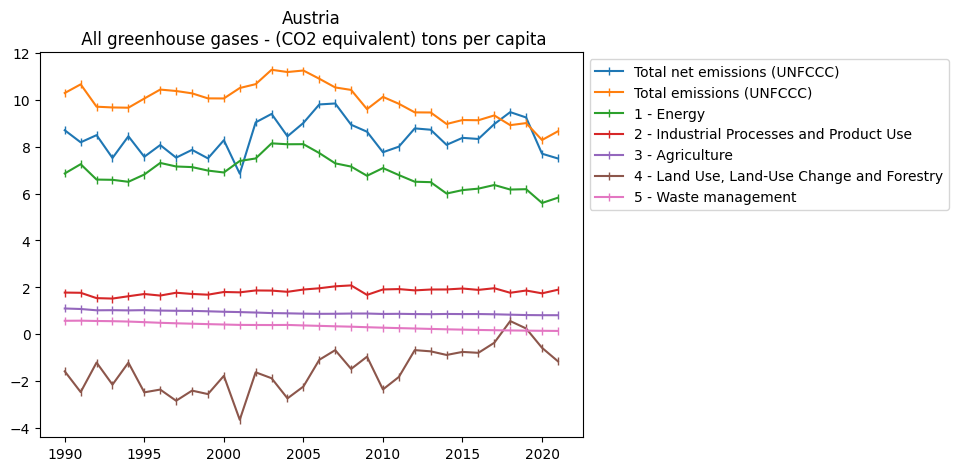

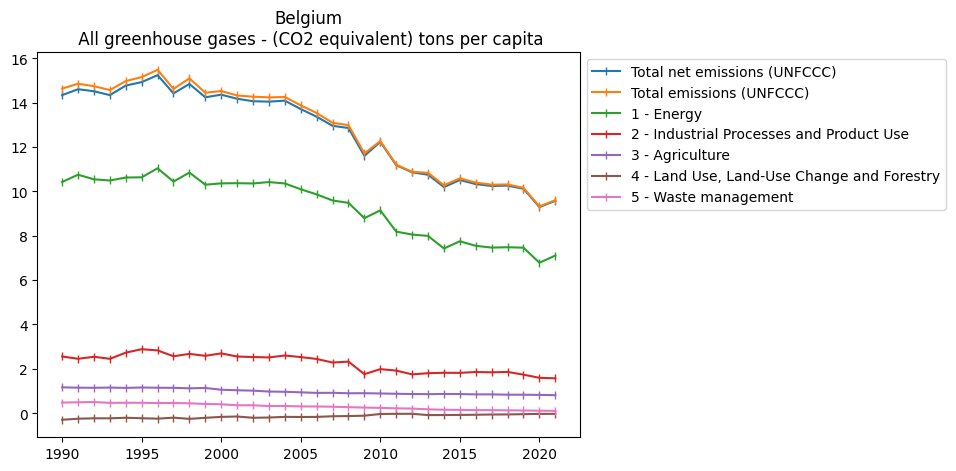

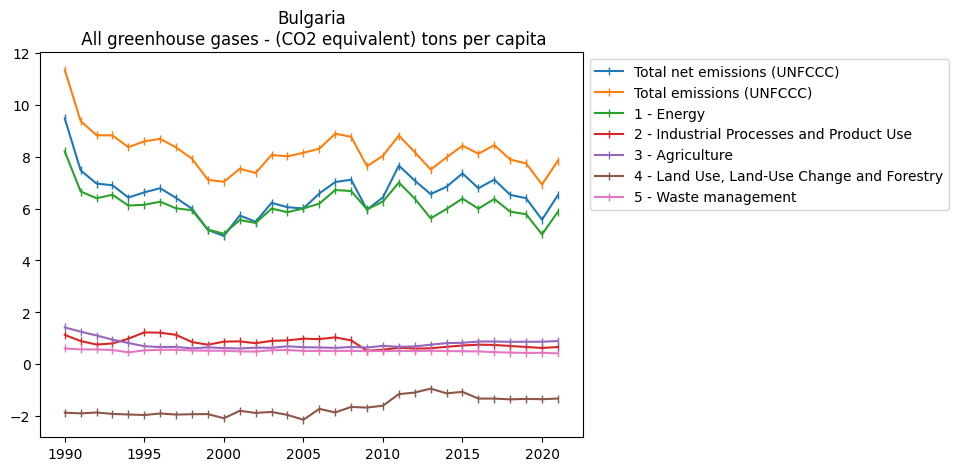

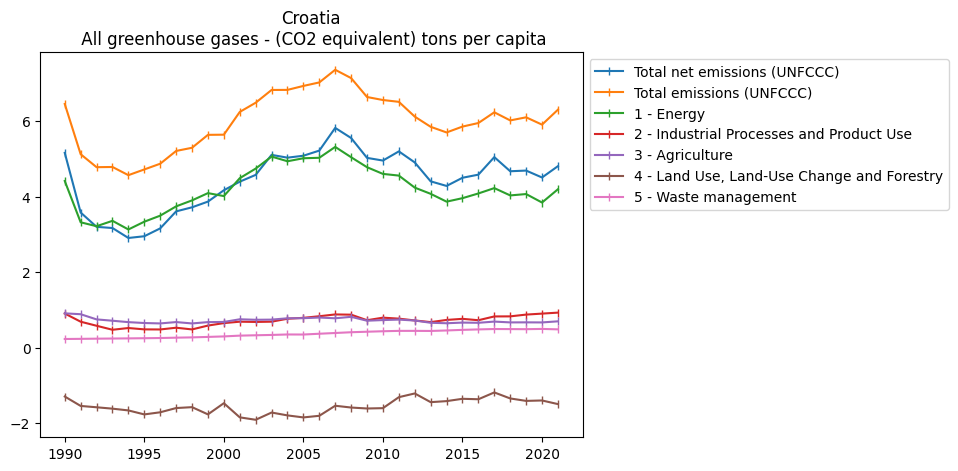

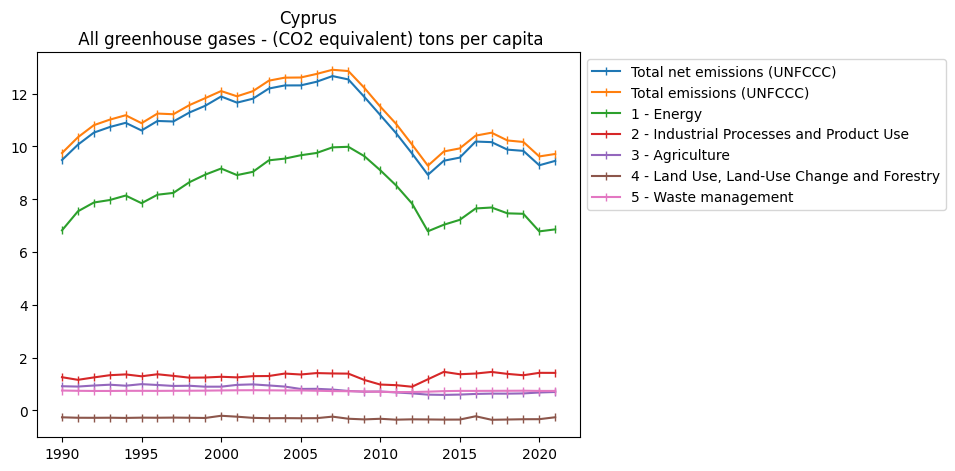

...

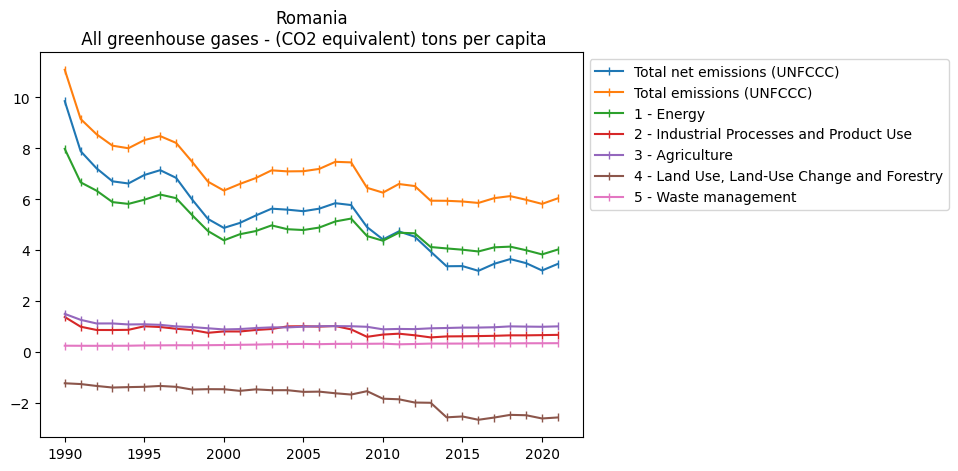

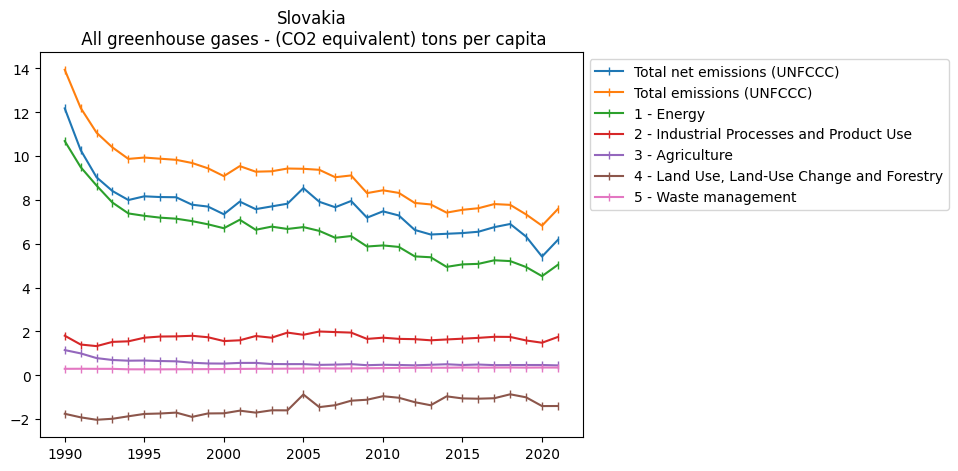

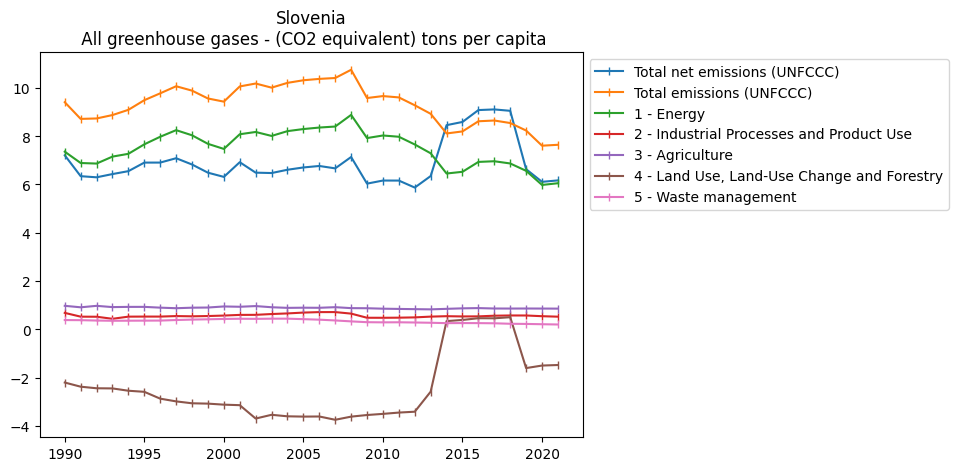

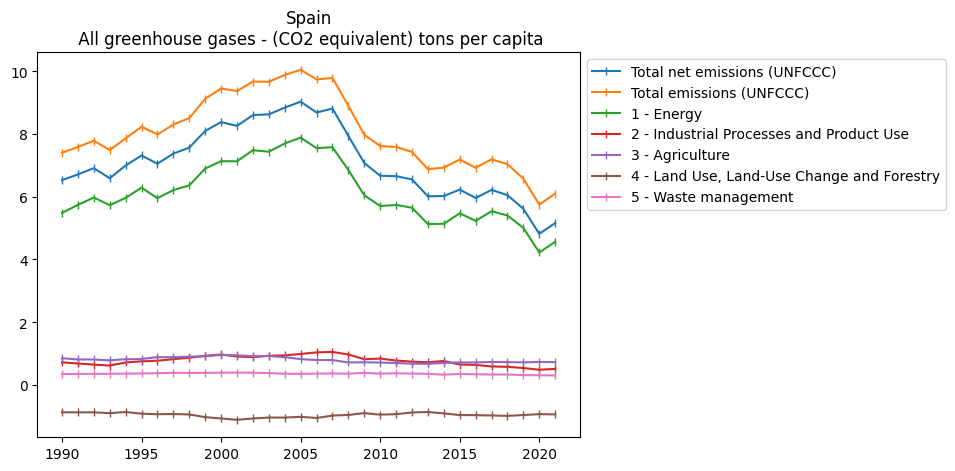

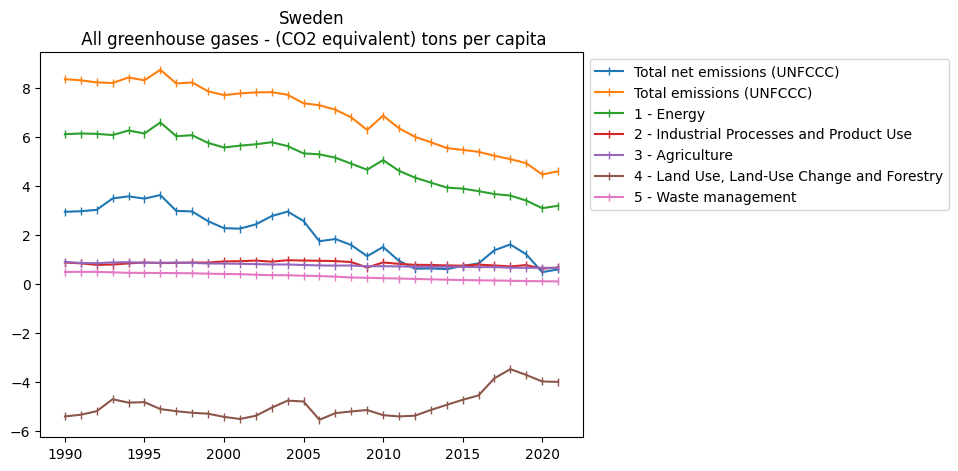

In [ ]:
countries = np.sort(emissions_df.Country.unique())
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (7,5))

for country in countries:
    for sector in chosen_sectors:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            plt.plot(df_to_plot.per_capita_emission*1000, label = sector, marker = '|')
            plt.title(country +"\n "+ pollutant + " tons per capita")
            plt.legend(bbox_to_anchor=(1, 1))
        except KeyError:
            print(country, pollutant, sector ," was not found")

    plt.show()

Now we plot all countries together, one plot per sector. Again the pollutant is All GHGs.

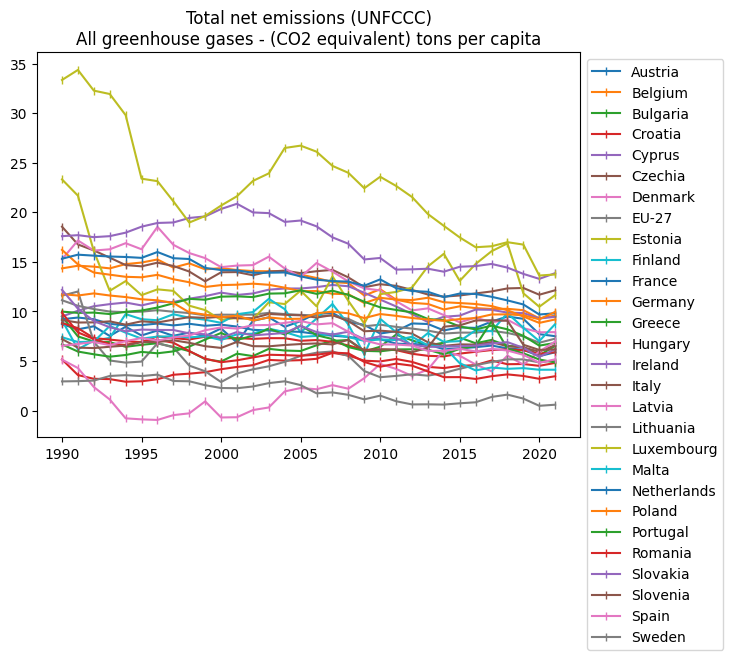

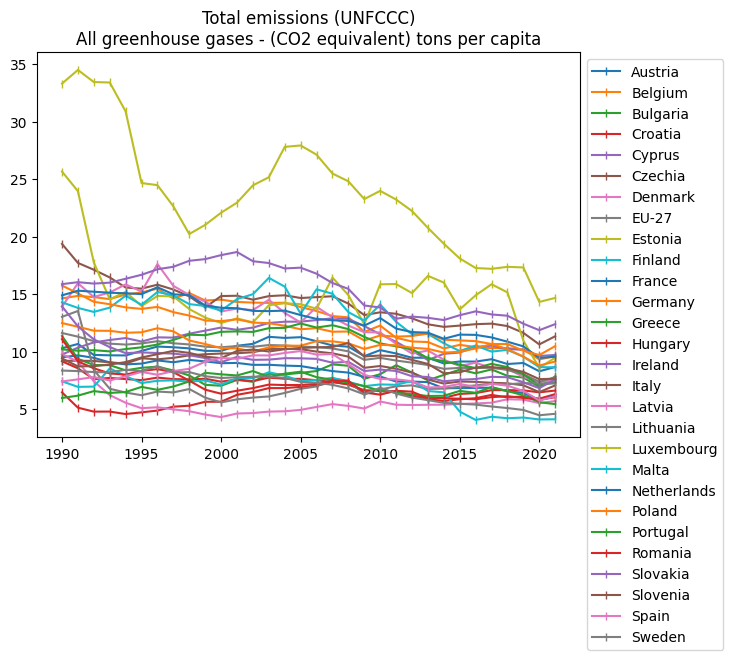

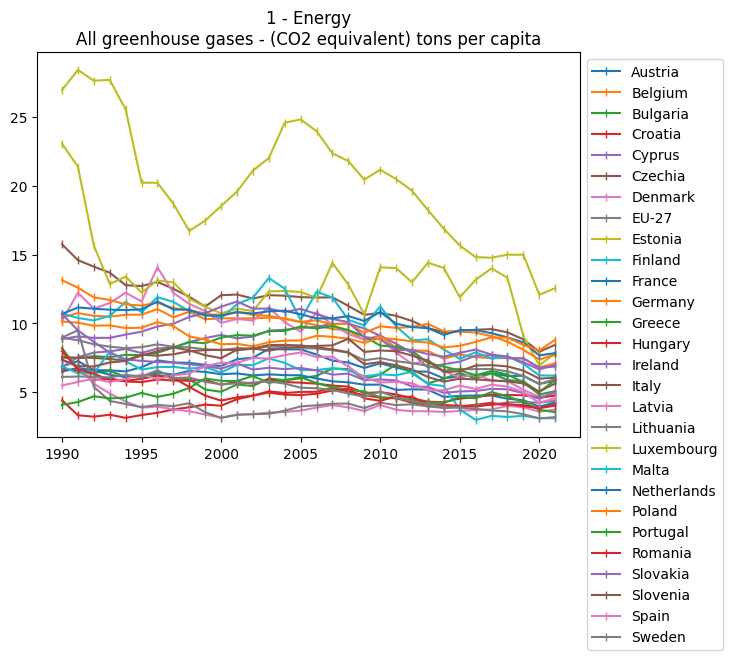

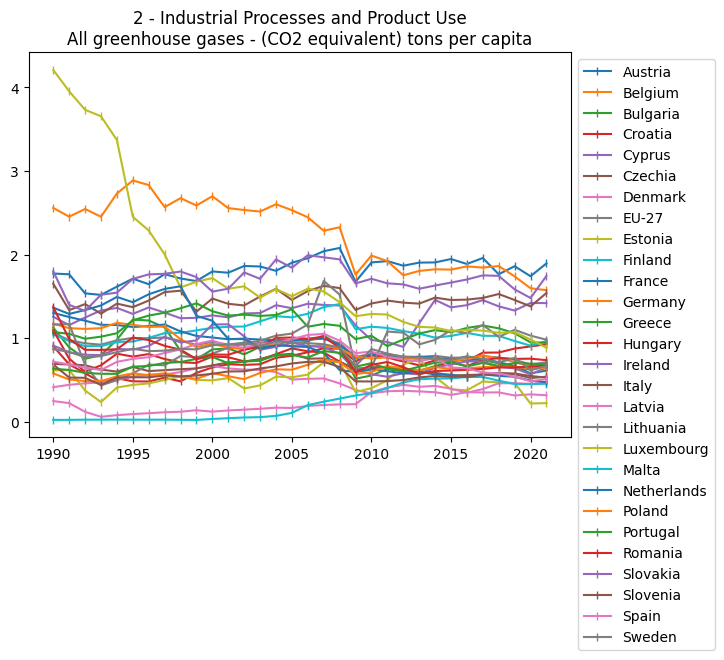

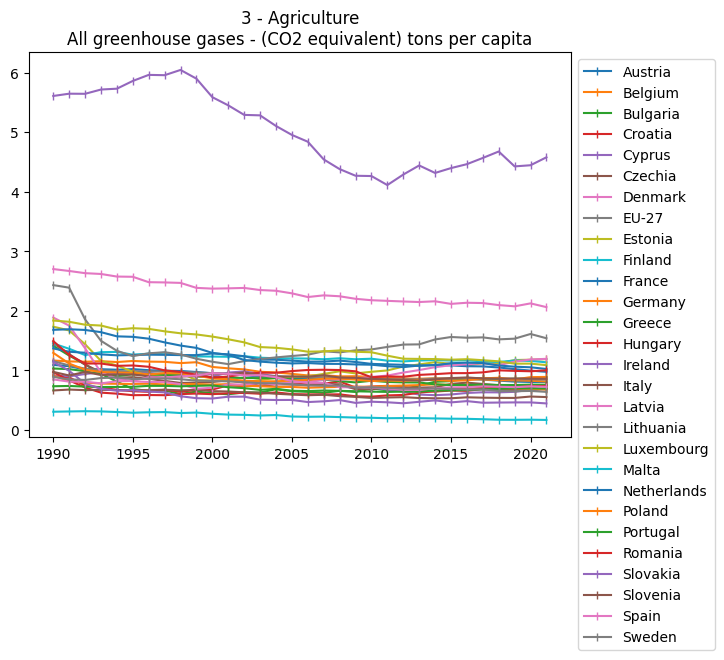

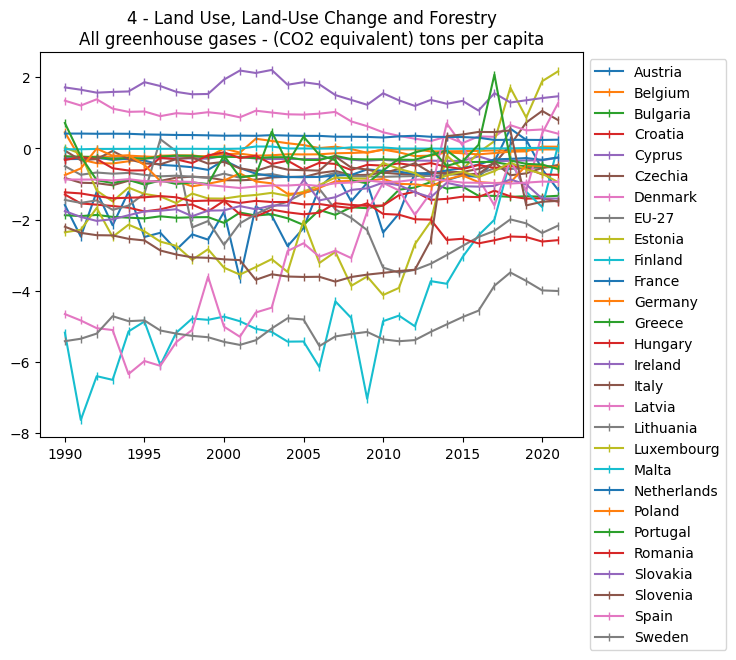

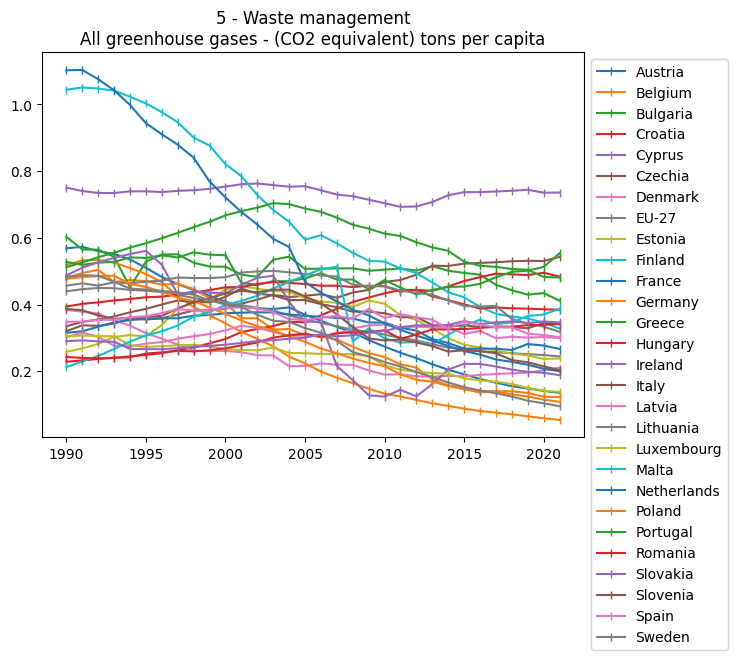

In [ ]:
countries = np.sort(emissions_df.Country.unique())
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (7,5))

for sector in chosen_sectors:
    for country in countries:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            plt.plot(df_to_plot.per_capita_emission*1000, label = country, marker = '|')
        except KeyError:
            print(country, pollutant, sector ," was not found")


    plt.title(sector + "\n"+  pollutant + " tons per capita")
    plt.legend(bbox_to_anchor=(1, 1))

    plt.show()

The previous plots are too confusing with 28 countries all together; for this reason we select only a few of them.

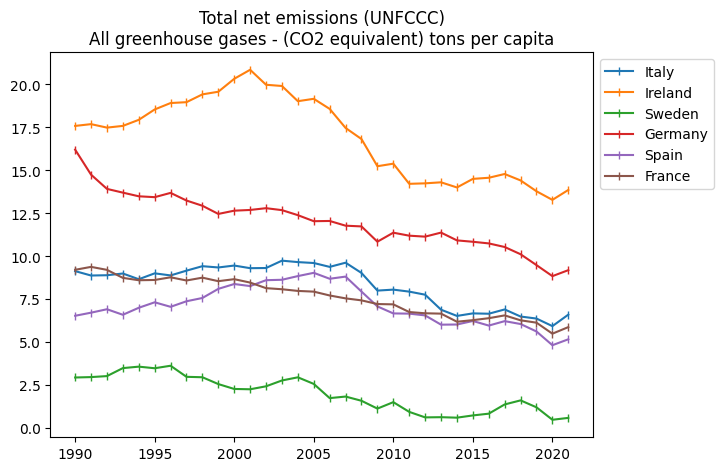

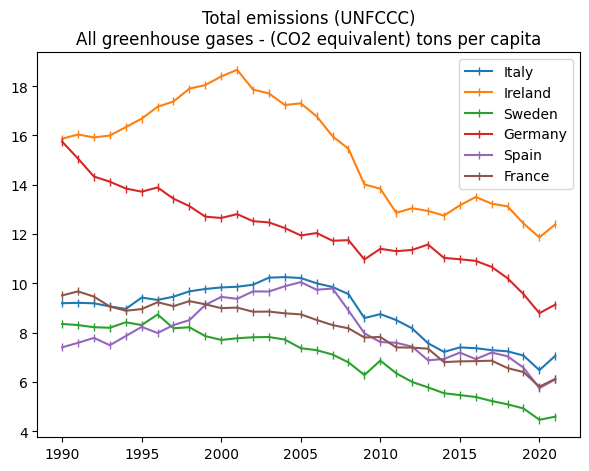

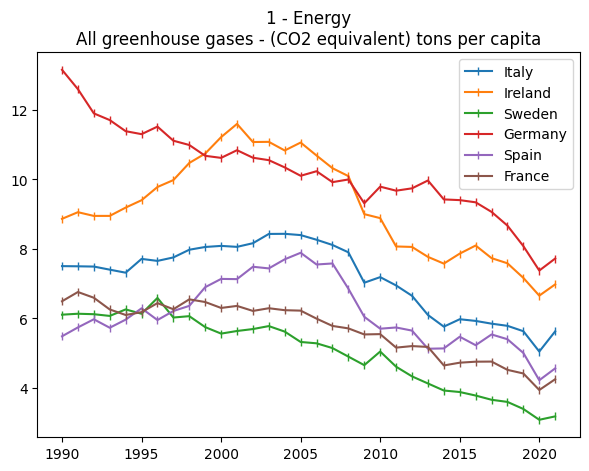

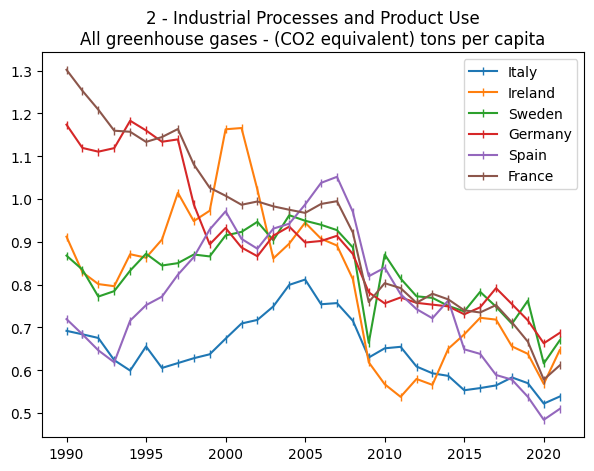

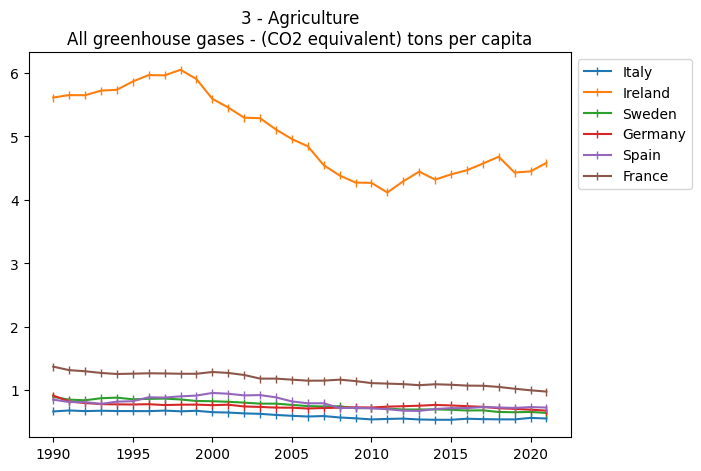

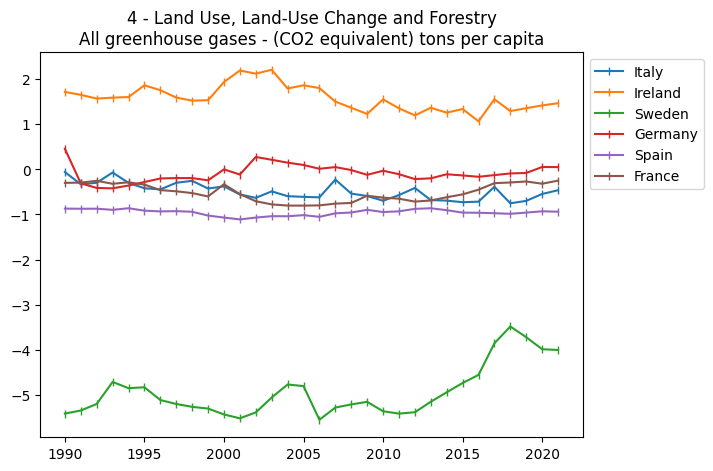

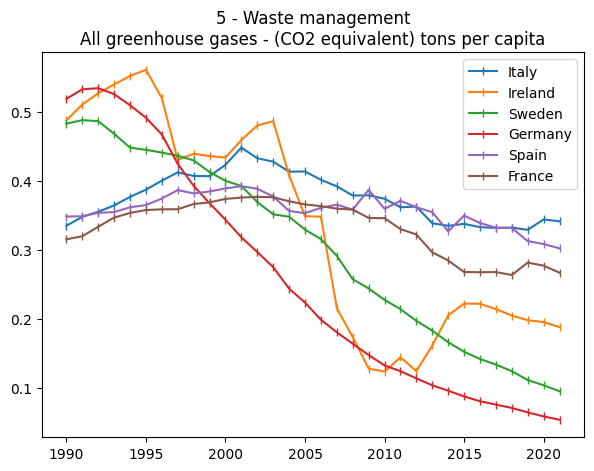

In [ ]:
countries = ['Italy', 'Ireland', 'Sweden', 'Germany', "Spain","France"]
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (7,5))

for sector in chosen_sectors:
    for country in countries:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            plt.plot(df_to_plot.per_capita_emission*1000, label = country, marker = '|')
        except KeyError:
            print(country, pollutant, sector ," was not found")


    plt.title(sector + "\n"+  pollutant + " tons per capita")
    plt.legend(bbox_to_anchor=(1, 1))

    plt.show()

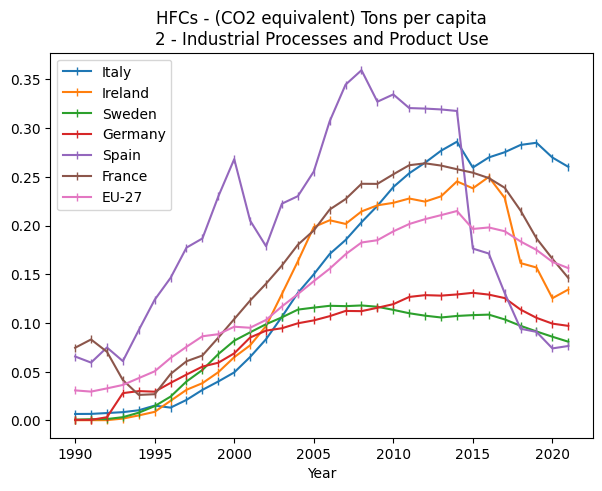

In [ ]:
# HFCs
pollutant = "HFCs - (CO2 equivalent)"
sector = "2 - Industrial Processes and Product Use"

plt.rc('figure', figsize = (7,5))

for country in ['Italy', 'Ireland', 'Sweden', 'Germany', "Spain","France","EU-27"]:
    (emissions_df.set_index(["Pollutant_name", "Sector_name","Country", "Year"]).sort_index().loc[pollutant].loc[sector].loc[country].per_capita_emission*1000).plot(label = country, marker = '|')
    plt.legend()
    plt.title(pollutant + " Tons per capita" + "\n" + sector)
plt.show()

## I.III. Choropleth Maps

Two new packages are used to create the map: **geopandas** and **plotly.express**. First, we create a dictionary that also had *Country Codes* so that once implemented in the DataFrame the new packages used can perform best and use specific features such as "locations."

In [ ]:
dic = {'Austria' : 'AUT',
       'Belgium' : 'BEL',
       'Bulgaria' : 'BGR',
       'Cyprus' : 'CYP',
       'Czechia' : 'CZE',
       'Germany' : 'DEU',
       'Denmark' : 'DNK',
       'Estonia' : 'EST',
       'Spain' : 'ESP',
       'Finland' : 'FIN',
       'France' : 'FRA',
       'Greece' : 'GRC',
       'Croatia' : 'HRV',
       'Hungary' : 'HUN',
       'Ireland' : 'IRL',
       'Italy' : 'ITA',
       'Lithuania' : 'LTU',
       'Luxembourg' : 'LUX',
       'Latvia' : 'LVA',
       'Malta' : 'MLT',
       'Netherlands' : 'NLD',
       'Poland' : 'POL',
       'Portugal' : 'PRT',
       'Romania' : 'ROU',
       'Sweden' : 'SWE',
       'Slovenia' : 'SVN',
       'Slovakia' : 'SVK'}

In [ ]:
mask1 = emissions_df["Sector_name"] == "Total net emissions (UNFCCC)"
mask2 = emissions_df["Pollutant_name"] != 'NF3 - (CO2 equivalent)' # --> Deleted because NaN
mask3 = emissions_df["Pollutant_name"] != 'Unspecified mix of HFCs and PFCs - (CO2 equivalent)' # --> Deleted because NaN

df_maps = emissions_df[mask1]
df_maps = df_maps[mask2]
df_maps = df_maps[mask3]

df_maps.drop(df_maps[(df_maps['Country'] == 'EU-27')].index, inplace = True)

df_maps['Country_code'] = df_maps["Country"].map(dic)

df_maps = df_maps.sort_values("Year")
df_maps.per_capita_emission.min()

<ipython-input-39-7bd82d4326f5>:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_maps = df_maps[mask2]
<ipython-input-39-7bd82d4326f5>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_maps = df_maps[mask3]


-0.002765695690994642

In [ ]:
for pollutant in df_maps.Pollutant_name.unique():
    pollutant_data = df_maps[df_maps.Pollutant_name == pollutant]
    pollutant_data['per_capita_emission'] = pollutant_data['per_capita_emission'] * 1000 # unit is tons per capita

    min = pollutant_data['per_capita_emission'].min()
    max = pollutant_data['per_capita_emission'].max()

    fig = px.choropleth(pollutant_data,
                        locations = "Country_code",
                        range_color = (min, max),
                        color  ="per_capita_emission",
                        color_continuous_scale = "Emrld",
                        scope = "europe",
                        animation_frame = "Year")

    fig.update_geos(fitbounds="locations", visible=True)
    fig.update_layout(title_text = f'{pollutant}', margin={"r":10,"t":10,"l":10,"b":10})
    fig.show()

    fig.write_html(str(pollutant) + '.html')

# if you want to change color "https://plotly.com/python/builtin-colorscales/"

<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pollutant_data['per_capita_emission'] = pollutant_data['per_capita_emission'] * 1000 # unit is tons per capita


<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-40-c7e99be83e68>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



We encounter the following error: *A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead*. Even if this error occur, we know that we are using a copy instead of the real DataFrame as we don't want to modify the original one.

We are aware of the fact that this error occur in the following Chapters too.

## I.IV. Key Points from a First Look at Emissions Levels

The plots of sectors for each Country show a general trend in annual emissions: the emissions from Energy production dictate the path followed by *Total Emissions* and *Total Net Emissions*.

Focusing our attention to the trajectory of *All Green House Gasses*, we can affirm that trend is determined mainly by the path followed by *CO2* gas.

Comparing Total Emissions between countries is difficult because of different populations. In order to avoid this issue we calculated per capita emission.




# II° Chapter

In this subsection, you will find a detailed account of the data cleaning operations conducted on a set of a CSV file. The file contains information about the **Gross Domestic Products (GDPs)** of all 27 countries of the European Union, categorized according to the sectors in the classification system employed for GDP computation. These sectors are: *Agriculture, forestry and fishing*, *Construction*, *Distributive trade, repairs; transport; accommod., food serv.*, *Financial and insurance activities*, *Information and communication*, *Other service activities*, *Prof., scientific, techn.; admin., support serv. activities*, *Public admin.; compulsory s.s.; education; human health*, *Real estate activities*. Within the dataset, a cumulative entry is included, summing the values from all sectors for a comprehensive overview.

## II.I. GDPs analysis: estracting data from Eurostat dataset

The following DataFrame contains data regarding the Gross Domestic Products (GDPs) of individual EU member countries, expressed in millions of euros.

In [ ]:
# downloading the dataset
urllib.request.urlretrieve("https://ec.europa.eu/eurostat/api/dissemination/sdmx/2.1/data/nama_10_gdp/A.CP_MEUR.B1GQ.EU27_2020+EU28+EU15+EA+EA20+EA19+EA12+BE+BG+CZ+DK+DE+EE+IE+EL+ES+FR+HR+IT+CY+LV+LT+LU+HU+MT+NL+AT+PL+PT+RO+SI+SK+FI+SE+IS+LI+NO+CH+UK+BA+ME+MK+AL+RS+TR+XK/?format=SDMX-CSV&startPeriod=1990&endPeriod=2022", "GLEMfolder/df_Eurostat")
df_Eurostat = pd.read_csv("./GLEMfolder/df_Eurostat")
df_Eurostat

,DATAFLOW,LAST UPDATE,freq,unit,na_item,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG
0,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1996,2520.6,NaN
1,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1997,1967.5,NaN
2,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1998,2281.8,NaN
3,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1999,3018.5,NaN
4,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,2000,3780.4,NaN
...,...,...,...,...,...,...,...,...,...
1254,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2018,6671.5,NaN
1255,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2019,7056.2,NaN
1256,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2020,6771.6,NaN
1257,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2021,7957.9,NaN


Since in the dataset there is not a column with the full country names, we need to add it stating from the country code.

In [ ]:
# We found a list containing country name - code
Country_code = [['European Union - 27 countries (from 2020)','EU27_2020'],
    ['European Union - 28 countries (2013-2020)','EU28'],
    ['European Union - 15 countries (1995-2004)' ,'EU15'],
    ['Euro area (EA11-1999, EA12-2001, EA13-2007, EA15-2008, EA16-2009, EA17-2011, EA18-2014, EA19-2015, EA20-2023)','EA'],
    ['Euro area - 20 countries (from 2023)','EA20'],
    ['Euro area - 19 countries  (2015-2022)','EA19'],
    ["Euro area - 12 countries(2001-2006)",'EA12'],
    ['Belgium','BE'],
    ['Bulgaria', 'BG'],
    ['Czechia','CZ'],
    ['Denmark','DK'],
    ['Germany','DE'],
    ['Estonia','EE'],
    ['Ireland','IE'],
    ['Greece','EL'],
    ['Spain','ES'],
    ['France','FR'],
    ['Croatia','HR'],
    ['Italy','IT'],
    ['Cyprus','CY'],
    ['Latvia','LV'],
    ['Lithuania','LT'],
    ['Luxembourg','LU'],
    ['Hungary','HU'],
    ['Malta','MT'],
    ['Netherlands','NL'],
    ['Austria','AT'],
    ['Poland','PL'],
    ['Portugal','PT'],
    ['Romania','RO'],
    ['Slovenia','SI'],
    ['Slovakia','SK'],
    ['Finland','FI'],
    ['Sweden','SE'],
    ['Iceland','IS'],
    ['Liechtenstein','LI'],
    ['Norway','NO'],
    ['Switzerland','CH'],
    ['United Kingdom','UK'],
    ['Bosnia and Herzegovina', 'BA'],
    ['Montenegro','ME'],
    ['North Macedonia','MK'] ,
    ['Albania','AL'],
    ['Serbia','RS'],
    ['Türkiye','TR'],
    ['Kosovo','XK']]

In [ ]:
# creation of a dictionary for the conversion
Code_to_country = {}
for el in Country_code:
    Code_to_country[el[1]] = el[0]

df_Eurostat['Country'] = df_Eurostat['geo'].map(Code_to_country)
df_Eurostat

,DATAFLOW,LAST UPDATE,freq,unit,na_item,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG,Country
0,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1996,2520.6,NaN,Albania
1,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1997,1967.5,NaN,Albania
2,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1998,2281.8,NaN,Albania
3,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,1999,3018.5,NaN,Albania
4,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,AL,2000,3780.4,NaN,Albania
...,...,...,...,...,...,...,...,...,...,...
1254,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2018,6671.5,NaN,Kosovo
1255,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2019,7056.2,NaN,Kosovo
1256,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2020,6771.6,NaN,Kosovo
1257,ESTAT:NAMA_10_GDP(1.0),05/01/24 23:00:00,A,CP_MEUR,B1GQ,XK,2021,7957.9,NaN,Kosovo


In [ ]:
# cleaning and ordering data
df_Eurostat = df_Eurostat.drop(columns = ['OBS_FLAG', 'na_item', 'LAST UPDATE', 'DATAFLOW'])
df_Eurostat = df_Eurostat.reindex(['geo', 'Country', 'TIME_PERIOD', 'OBS_VALUE', 'unit', 'freq'] , axis=1)

# dropping some data
mask = df_Eurostat['Country'].isin(['European Union - 28 countries (2013-2020)',
                         'European Union - 15 countries (1995-2004)',
                         'Euro area (EA11-1999, EA12-2001, EA13-2007, EA15-2008, EA16-2009, EA17-2011, EA18-2014, EA19-2015, EA20-2023)',
                         'Euro area - 20 countries (from 2023)',
                         'Euro area - 19 countries  (2015-2022)',
                         "Euro area - 12 countries(2001-2006)",
                        "Iceland", 'Liechtenstein', 'Norway', 'Switzerland','United Kingdom','Bosnia and Herzegovina',
                          'Montenegro','North Macedonia','Albania','Serbia','Türkiye','Kosovo'])
df_Eurostat = df_Eurostat[~mask]
df_Eurostat = df_Eurostat.reset_index(drop = True)

# rewriting the country code in a 3 lecter format with the previous conversion dictionary
df_Eurostat['geo'] = df_Eurostat['Country'].map(dic)
df_Eurostat

,geo,Country,TIME_PERIOD,OBS_VALUE,unit,freq
0,AUT,Austria,1995,184351.3,CP_MEUR,A
1,AUT,Austria,1996,186968.1,CP_MEUR,A
2,AUT,Austria,1997,187853.7,CP_MEUR,A
3,AUT,Austria,1998,195011.9,CP_MEUR,A
4,AUT,Austria,1999,203850.6,CP_MEUR,A
...,...,...,...,...,...,...
801,SVK,Slovakia,2018,89874.7,CP_MEUR,A
802,SVK,Slovakia,2019,94429.7,CP_MEUR,A
803,SVK,Slovakia,2020,93444.1,CP_MEUR,A
804,SVK,Slovakia,2021,100255.7,CP_MEUR,A


In [ ]:
# plotting a distribution of the GDP from the euro adoption (2002 - Italy)
mask = df_Eurostat['TIME_PERIOD'].isin(range(2002,2023))
df_to_plot = df_Eurostat[mask]

fig = px.choropleth(df_to_plot.sort_values('TIME_PERIOD'),
                    locations = "geo",
                    range_color = (0, 3000000),
                    color  ="OBS_VALUE",
                    color_continuous_scale = "Hot",
                    scope = "europe",
                    animation_frame = "TIME_PERIOD")

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

To compute some operations, we created a new DataFrame that includes observed values and excludes countries not belonging to the EU.

In [ ]:
GDP_Euro = df_Eurostat.pivot(index = "TIME_PERIOD" , columns = "Country" , values = "OBS_VALUE")
GDP_Euro.index.name = "Year"
GDP_Euro.rename(columns = {"European Union - 27 countries (from 2020)":"EU-27"},inplace = True)
GDP_Euro

Country,Austria,Belgium,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,EU-27,Finland,...,Luxembourg,Malta,Netherlands,Poland,Portugal,Romania,Slovakia,Slovenia,Spain,Sweden
Year,,,,,,,,,,,,,,,,,,,,,
1990,NaN,NaN,NaN,NaN,NaN,NaN,108898.0,NaN,NaN,111394.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1991,NaN,NaN,NaN,NaN,NaN,NaN,112605.4,NaN,NaN,103292.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1992,NaN,NaN,NaN,NaN,NaN,NaN,118194.2,NaN,NaN,86806.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1993,NaN,NaN,NaN,NaN,NaN,NaN,122269.6,NaN,NaN,76101.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,181713.6
1994,NaN,NaN,NaN,NaN,NaN,NaN,131678.0,NaN,NaN,87157.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,192863.0
1995,184351.3,220251.5,14512.8,17524.7,7596.0,46008.4,141441.4,2988.1,6337710.4,102643.6,...,15946.2,2846.6,346000.8,108834.6,91015.8,28589.8,15322.9,16340.4,470155.7,204328.5
1996,186968.1,219965.3,9829.8,19174.1,7890.1,53088.1,147843.4,3770.0,6636498.9,104142.2,...,16462.1,3010.6,354929.1,126200.8,96626.8,29035.4,17053.2,16946.1,506362.6,229771.3
1997,187853.7,223032.7,10064.7,21277.6,8414.3,54857.3,153152.1,4553.7,6819195.7,112033.4,...,17266.5,3346.8,367861.6,140649.2,103306.6,31450.5,19331.1,18320.7,520831.0,236645.7
1998,195011.9,231015.7,13437.6,22931.7,9152.6,59824.8,158146.4,5067.5,7110871.8,119733.4,...,18005.7,3581.8,391460.9,155011.6,110683.7,37063.3,20333.8,19784.6,553338.4,241468.1


### GDPs Evolution: Annual Growth Representation

In [ ]:
# creation of a GDPs' growth rate dataset
GDP_Var = GDP_Euro.copy()
GDP_Var = GDP_Var.pct_change()
GDP_Var = GDP_Var.loc[2002:2022]
GDP_Var

Country,Austria,Belgium,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,EU-27,Finland,...,Luxembourg,Malta,Netherlands,Poland,Portugal,Romania,Slovakia,Slovenia,Spain,Sweden
Year,,,,,,,,,,,,,,,,,,,,,
2002,0.028161,0.033749,0.098898,0.109114,0.041369,0.153926,0.031238,0.119578,0.036020,0.026675,...,0.047370,0.038419,0.039960,-0.010685,0.049930,0.078684,0.101670,0.074123,0.069272,0.048434
2003,0.022614,0.029073,0.075522,0.078735,0.065249,0.014896,0.018749,0.117838,0.026794,0.021975,...,0.048626,0.017423,0.023293,-0.085524,0.024647,0.049549,0.143443,0.051060,0.070327,0.044701
2004,0.045224,0.055546,0.122080,0.090000,0.082874,0.089044,0.046903,0.118144,0.045665,0.046188,...,0.074811,0.018016,0.032129,0.070495,0.042313,0.181839,0.154009,0.055034,0.071262,0.046832
2005,0.048388,0.044532,0.139699,0.089514,0.079014,0.142589,0.051428,0.160143,0.042859,0.037346,...,0.074198,0.049222,0.040804,0.194497,0.041408,0.311611,0.133660,0.051650,0.079028,0.018031
2006,0.054116,0.048749,0.140188,0.102882,0.081420,0.129254,0.059666,0.196204,0.057698,0.049852,...,0.128595,0.048699,0.061107,0.114878,0.048613,0.227099,0.157311,0.080825,0.082456,0.068221
2007,0.060314,0.056796,0.184411,0.093740,0.081605,0.115755,0.034816,0.208742,0.061949,0.081985,...,0.101446,0.071682,0.059232,0.143338,0.055473,0.312876,0.235457,0.114290,0.071443,0.064117
2008,0.034453,0.023643,0.147298,0.093277,0.080644,0.165914,0.035265,0.013218,0.032272,0.038450,...,0.062901,0.071792,0.045267,0.166298,0.020625,0.148541,0.173215,0.081321,0.031614,-0.011322
2009,-0.019464,-0.014983,0.004591,-0.059649,-0.017575,-0.076994,-0.042777,-0.149608,-0.044900,-0.064438,...,-0.023967,0.008637,-0.034543,-0.133865,-0.020583,-0.145826,-0.030297,-0.044055,-0.036247,-0.113400
2010,0.027262,0.048106,0.023312,0.003707,0.042066,0.055716,0.051399,0.043108,0.037098,0.035192,...,0.085837,0.088856,0.022958,0.132561,0.023911,0.024478,0.072851,0.003006,0.003166,0.190879


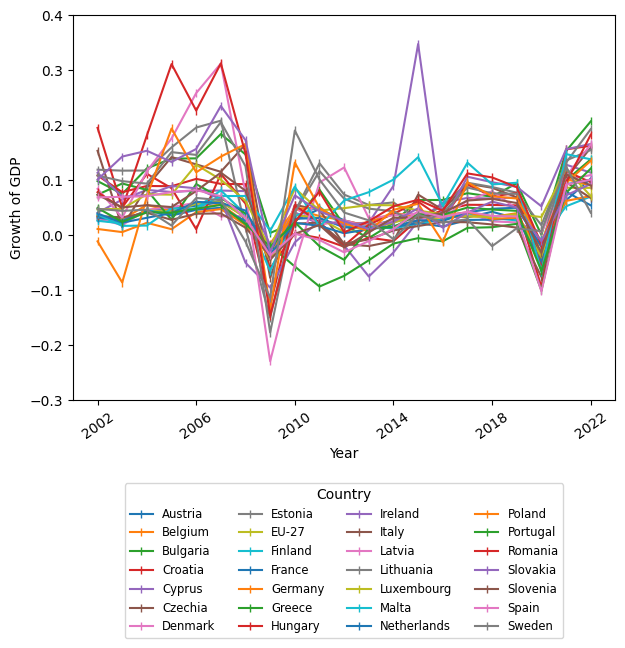

In [ ]:
fig, ax = plt.subplots(1, figsize = (7,5))
for el in GDP_Var:
    plt.plot(GDP_Var[el], label=el, marker = '|')
    plt.legend(title='Country', loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol = 4, fontsize = "small")
    plt.xlabel('Year')
    plt.ylabel('Growth of GDP')
    plt.ylim(-0.3, 0.4)
    x_lab = GDP_Var.index
    ticks = ax.set_xticks(x_lab)
plt.xticks(range(2002, 2023, 4), rotation=35)
plt.show()

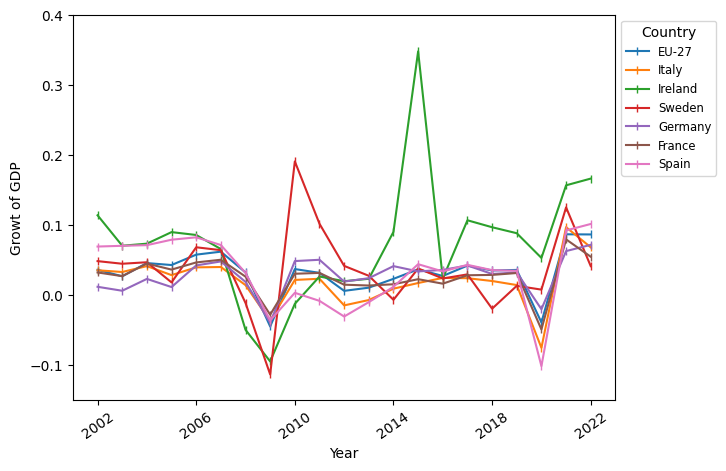

In [ ]:
fig, ax = plt.subplots(1, figsize = (7,5))
for el in ['EU-27', 'Italy', 'Ireland', 'Sweden', 'Germany',"France", "Spain"]:
    plt.plot(GDP_Var[el], label=el, marker = '|')
    plt.legend(title='Country', loc='upper left', bbox_to_anchor=(1, 1), fontsize = 'small')
    plt.xlabel('Year')
    plt.ylabel('Growt of GDP')
    plt.ylim(-0.15, 0.4)
    # x_lab = GDP_Var.index
    # ticks = ax.set_xticks(x_lab)
    # labels = ax.set_xticklabels(x_lab, rotation=30, fontsize='small')
plt.xticks(range(2002, 2023, 4), rotation=35)
plt.show()

## II.II. GDPs analysis: estracting data from OECD dataset

The following DataFrame contains data regarding the *Gross Domestic Products (output approach)* of individual EU member countries, expressed in millions of euros for those countries which adopt it. All the others express their GDP in their currency.

Initially, we cleanse the original dataset to retain only the pertinent information.

We use the pandasdmx library to take data directly from OECD.

In [ ]:
# Tell pdmx we want OECD data
oecd = pdmx.Request("OECD")

# Set out everything about the request in the format specified by the OECD API
data = oecd.data(
    resource_id="SNA_TABLE1",
    key="AUT+BEL+CZE+DNK+EST+FIN+FRA+DEU+GRC+HUN+IRL+ITA+LVA+LTU+LUX+NLD+POL+PRT+SVK+SVN+ESP+SWE+EU27_2020+BGR+HRV+CYP+MLT+ROU.B1_GA+B1GVA+B1GVB_E+B1GVF+B1GVG_I+B1GVJ+B1GVK+B1GVL+B1GVM_N+B1GVO_Q+B1GVR_U.C/all?startTime=1990&endTime=2022",
).to_pandas()

df_OECD = pd.DataFrame(data).reset_index()

#converting the transaction code to a transaction name
trans_code_to_name = {'B1_GA': 'Gross domestic product', 'B1GVA': 'Agriculture, forestry and fishing', 'B1GVB_E': 'Industry, including energy', 'B1GVF': 'Construction', 'B1GVG_I': 'Distributive trade, repairs; transport; accommod., food serv.', 'B1GVJ': 'Information and communication', 'B1GVK': 'Financial and insurance activities', 'B1GVL': 'Real estate activities', 'B1GVM_N': 'Prof., scientific, techn.; admin., support serv. activities', 'B1GVO_Q': 'Public admin.; compulsory s.s.; education; human health', 'B1GVR_U': 'Other service activities'}
df_OECD['Sectors'] = df_OECD['TRANSACT'].map(trans_code_to_name)


Country_code_to_name = {'AUT': 'Austria', 'BEL': 'Belgium', 'BGR': 'Bulgaria', 'HRV': 'Croatia', 'CYP': 'Cyprus', 'CZE': 'Czechia', 'DNK': 'Denmark', 'EU27_2020': 'EU-27', 'EST': 'Estonia', 'FIN': 'Finland', 'FRA': 'France', 'DEU': 'Germany', 'GRC': 'Greece', 'HUN': 'Hungary', 'IRL': 'Ireland', 'ITA': 'Italy', 'LVA': 'Latvia', 'LTU': 'Lithuania', 'LUX': 'Luxembourg', 'MLT': 'Malta', 'NLD': 'Netherlands', 'POL': 'Poland', 'PRT': 'Portugal', 'ROU': 'Romania', 'SVK': 'Slovakia', 'SVN': 'Slovenia', 'ESP': 'Spain', 'SWE': 'Sweden'}
df_OECD['Country'] = df_OECD['LOCATION'].map(Country_code_to_name)

# cleaning and ordering data
df_OECD = df_OECD.drop(columns = ['MEASURE', 'TRANSACT', 'LOCATION'])
df_OECD = df_OECD.reindex(['Country', 'Sectors', 'TIME_PERIOD', 'value'] , axis=1)
df_OECD = df_OECD.rename(columns = {"TIME_PERIOD" : "Year" , "value" : "Value"})

# converting data type
df_OECD['Year'] = df_OECD.Year.astype('int32')

df_OECD

,Country,Sectors,Year,Value
0,Austria,Gross domestic product,1990,137548.696
1,Austria,Gross domestic product,1991,147464.360
2,Austria,Gross domestic product,1992,155789.392
3,Austria,Gross domestic product,1993,160927.978
4,Austria,Gross domestic product,1994,168954.605
...,...,...,...,...
9118,EU-27,Other service activities,2018,404033.652
9119,EU-27,Other service activities,2019,418250.585
9120,EU-27,Other service activities,2020,364549.901
9121,EU-27,Other service activities,2021,382501.333


### GDPs analysis: Before and after the adoption of the Euro.

Subsequently, we group the data based on three shared variables for each country, namely *Country*, *Sectors* and *Year*. This grouping facilitates a comprehensive overview of our final dataset.

In [ ]:
# setting columns and saving the df before the EURO adoption
df_OECD_beuro = df_OECD.pivot(index = ["Country", "Year"] , columns = ["Sectors"], values = "Value")

df_OECD_beuro

Sectors       Agriculture, forestry and fishing  Construction  \
Country Year                                                    
Austria 1990                           4260.048      8644.996   
        1991                           4145.639      9830.017   
        1992                           3822.035     10570.740   
        1993                           3547.562     11116.311   
        1994                           4006.836     12344.157   
...                                         ...           ...   
Sweden  2018                          67248.000    287200.000   
        2019                          70297.000    290094.000   
        2020                          66980.000    306998.000   
        2021                          70672.000    313556.000   
        2022                          87597.000    350272.000   

Sectors       Distributive trade, repairs; transport; accommod., food serv.  \
Country Year                                                                  
Austria 1990                                          28893.768               
        1991                                          31087.567               
        1992                                          32689.834               
        1993                                          32958.462               
        1994                                          34110.958               
...                                                         ...               
Sweden  2018                                         744416.000               
        2019                                         781180.000               
        2020                                         745228.000               
        2021                                         829879.000               
        2022                                         900994.000               

Sectors       Financial and insurance activities  Gross domestic product  \
Country Year                                                               
Austria 1990                            7196.125              137548.696   
        1991                            7736.246              147464.360   
        1992                            8165.078              155789.392   
        1993                            9345.069              160927.978   
        1994                            9213.916              168954.605   
...                                          ...                     ...   
Sweden  2018                          170110.000             4828306.000   
        2019                          172044.000             5049619.000   
        2020                          196029.000             5038538.000   
        2021                          213675.000             5486558.000   
        2022                          233199.000             5984786.000   

Sectors       Industry, including energy  Information and communication  \
Country Year                                                              
Austria 1990                   32015.586                       3760.113   
        1991                   33679.722                       4045.195   
        1992                   34632.951                       4330.253   
        1993                   34432.372                       4659.214   
        1994                   35661.591                       5027.138   
...                                  ...                            ...   
Sweden  2018                  775145.000                     324299.000   
        2019                  815960.000                     365031.000   
        2020                  780857.000                     376653.000   
        2021                  931485.000                     418941.000   
        2022                 1083620.000                     449132.000   

Sectors       Other service activities  \
Country Year                             
Austria 1990                  3257.286   
        1991                  3507.

### GDPs analysis: since the adoption of the Euro to the present day.

We want now to focus our attention to the growth of the GDP per sector since the adoption of Euro (in Italy - 2002) to the present day (last availabe year: 2022).

In [ ]:
# filtering years from 2002 to 2022
indx = [i for i in range(2002 , 2022)]

mask = df_OECD['Year'].isin(indx)

df_OECD_aeuro = df_OECD[mask]
df_OECD_aeuro

#  setting columns and saving the df before the EURO adoption
df_OECD_aeuro = df_OECD_aeuro.pivot(index = ["Country", "Year"] , columns = ["Sectors"] , values = "Value")

df_OECD_aeuro

Sectors       Agriculture, forestry and fishing  Construction  \
Country Year                                                    
Austria 2002                            3543.36      14131.37   
        2003                            3459.23      15085.13   
        2004                            3578.21      15602.28   
        2005                            3199.82      15833.70   
        2006                            3490.26      16134.83   
...                                         ...           ...   
Sweden  2017                           66765.00     277343.00   
        2018                           67248.00     287200.00   
        2019                           70297.00     290094.00   
        2020                           66980.00     306998.00   
        2021                           70672.00     313556.00   

Sectors       Distributive trade, repairs; transport; accommod., food serv.  \
Country Year                                                                  
Austria 2002                                           46363.35               
        2003                                           47043.26               
        2004                                           48916.81               
        2005                                           51439.88               
        2006                                           54489.52               
...                                                         ...               
Sweden  2017                                          733143.00               
        2018                                          744416.00               
        2019                                          781180.00               
        2020                                          745228.00               
        2021                                          829879.00               

Sectors       Financial and insurance activities  Gross domestic product  \
Country Year                                                               
Austria 2002                            10225.13               226735.22   
        2003                            10146.91               231862.46   
        2004                            10541.95               242348.26   
        2005                            11005.26               254075.03   
        2006                            11912.31               267824.45   
...                                          ...                     ...   
Sweden  2017                           168311.00              4625094.00   
        2018                           170110.00              4828306.00   
        2019                           172044.00              5049619.00   
        2020                           196029.00              5038538.00   
        2021                           213675.00              5486558.00   

Sectors       Industry, including energy  Information and communication  \
Country Year                                                              
Austria 2002                    47967.05                        7737.20   
        2003                    48673.29                        7934.08   
        2004                    50737.57                        7756.07   
        2005                    52955.19                        8134.18   
        2006                    56872.43                        8378.78   
...                                  ...                            ...   
Sweden  2017                   746115.00                      293666.00   
        2018                   775145.00                      324299.00   
        2019                   815960.00                      365031.00   
        2020                   780857.00                      376653.00   
        2021                   931485.00                      418941.00   

Sectors       Other service activities  \
Country Year                             
Austria 2002                   5569.00   
        2003                   5726


As we have already mentioned, each country expresses the values of GDP in its own currency. For this reason, we standardized the values by computing indices based on 100, using the total GDP as a reference.

In [ ]:
# creating a copy of the previous dataframe
Percent_GDP = df_OECD_aeuro.copy()

# converting from currency to percents
for el in Percent_GDP:
  for i1, i2 in Percent_GDP[el].index:
    Percent_GDP[el][i1][i2] = (Percent_GDP[el][i1][i2])/(df_OECD_aeuro["Gross domestic product"][i1][i2])
Percent_GDP = Percent_GDP.applymap(lambda x: x * 100 if pd.notna(x) else x)
Percent_GDP

Sectors       Agriculture, forestry and fishing  Construction  \
Country Year                                                    
Austria 2002                           1.562774      6.232543   
        2003                           1.491932      6.506068   
        2004                           1.476474      6.437958   
        2005                           1.259400      6.231899   
        2006                           1.303189      6.024405   
...                                         ...           ...   
Sweden  2017                           1.443538      5.996484   
        2018                           1.392787      5.948256   
        2019                           1.392125      5.744869   
        2020                           1.329354      6.092998   
        2021                           1.288094      5.714986   

Sectors       Distributive trade, repairs; transport; accommod., food serv.  \
Country Year                                                                  
Austria 2002                                          20.448235               
        2003                                          20.289296               
        2004                                          20.184511               
        2005                                          20.245941               
        2006                                          20.345237               
...                                                         ...               
Sweden  2017                                          15.851418               
        2018                                          15.417747               
        2019                                          15.470078               
        2020                                          14.790560               
        2021                                          15.125676               

Sectors       Financial and insurance activities  Gross domestic product  \
Country Year                                                               
Austria 2002                            4.509723                   100.0   
        2003                            4.376263                   100.0   
        2004                            4.349918                   100.0   
        2005                            4.331500                   100.0   
        2006                            4.447805                   100.0   
...                                          ...                     ...   
Sweden  2017                            3.639083                   100.0   
        2018                            3.523182                   100.0   
        2019                            3.407069                   100.0   
        2020                            3.890593                   100.0   
        2021                            3.894518                   100.0   

Sectors       Industry, including energy  Information and communication  \
Country Year                                                              
Austria 2002                   21.155536                       3.412439   
        2003                   20.992312                       3.421891   
        2004                   20.935809                       3.200382   
        2005                   20.842343                       3.201487   
        2006                   21.234966                       3.128460   
...                                  ...                            ...   
Sweden  2017                   16.131888                       6.349406   
        2018                   16.054181                       6.716621   
        2019                   16.158843                       7.228882   
        2020                   15.497690                       7.475442   
        2021                   16.977584                       7.635771   

Sectors       Other service activities  \
Country Year                             
Austria 2002                  2.456169   
        2003                  2.469

## II.III. GDP per Sector's Plots

In the following visualization, we can discern the sector that has mostly contributed to the GDP for each country.

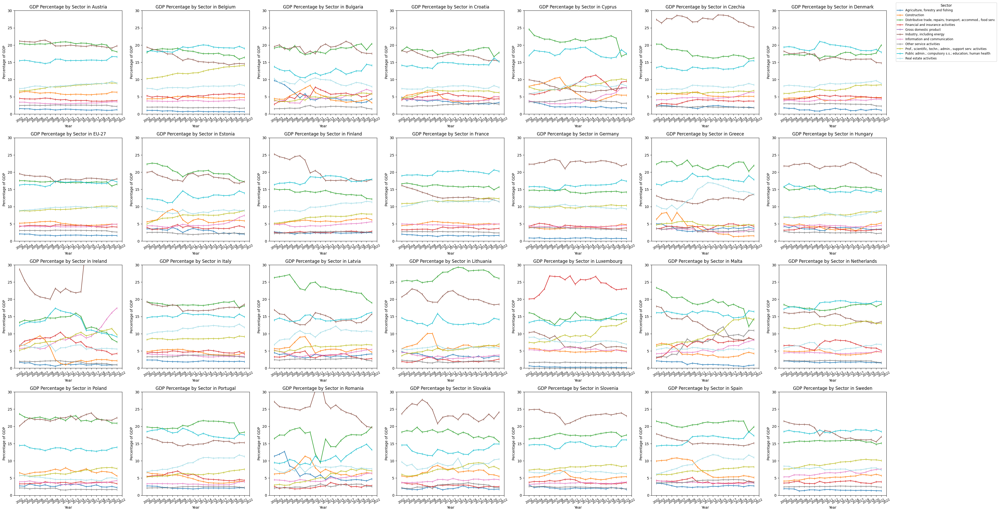

In [ ]:
# Get unique country names
countries = Percent_GDP.index.get_level_values('Country').unique()

# Create the subplots grid
fig, axes = plt.subplots(int(np.ceil(len(countries)/7)), 7, figsize=(5*int(np.ceil(len(countries)/4)), 20))

# Flatten the 2D array of subplots into a 1D array
axes = axes.flatten()

# Plotting for each country
for i, country in enumerate(countries):
    country_data = Percent_GDP.loc[Percent_GDP.index.get_level_values('Country') == country]
    ax = axes[i]

    country_data.plot(kind='line', ax=ax, marker='|', colormap="tab20")
    ax.set_title(f'GDP Percentage by Sector in {country}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Percentage of GDP')
    ax.legend().set_visible(False)  # Hide individual legends
    x_lab = GDP_Var.index
    ax.set_xticks(range(len(x_lab)))
    labels = ax.set_xticklabels(x_lab, rotation=30, fontsize='small')
    ax.set_ylim(0, 30)

# Add a single legend outside the subplots grid
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, title='Sector', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

We want to focus our attention on Italy and on the European Union in general; to do that we plot again the single graphics for both of them. This approach aims to avoid confusion among the 28 plots presented earlier.

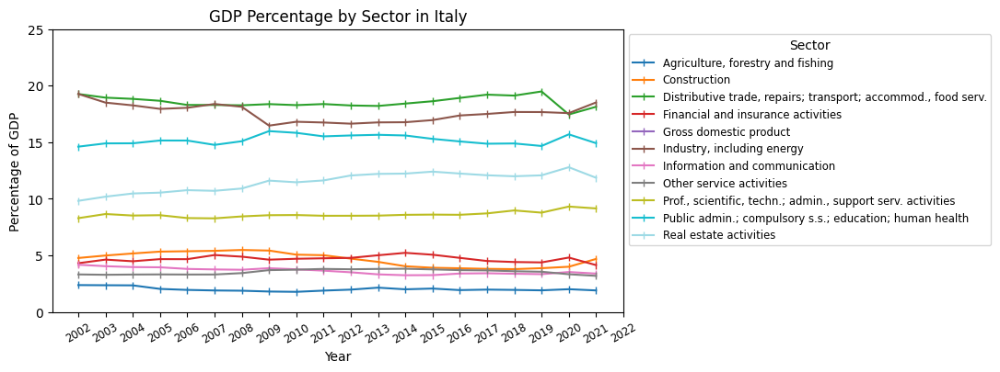

In [ ]:
# Italy's GDP plot
Italy_data = Percent_GDP.loc[Percent_GDP.index.get_level_values('Country') == "Italy"]
fig, ax = plt.subplots(figsize = (8,4))
Italy_data.plot(kind='line', ax = ax, marker='|', colormap = "tab20")
plt.title('GDP Percentage by Sector in Italy')
plt.xlabel('Year')
plt.ylabel('Percentage of GDP')
plt.legend(title='Sector', loc='upper left', bbox_to_anchor=(1, 1), fontsize = 'small')
ax.set_xticks(range(len(x_lab)))
labels = ax.set_xticklabels(x_lab, rotation=30, fontsize='small')
plt.ylim(0, 25)
plt.show()

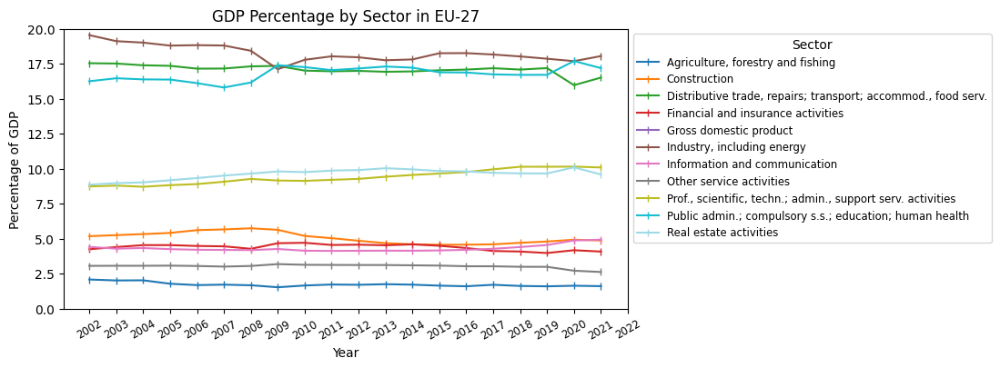

In [ ]:
# EU-27's GDP plot
EU27_data = Percent_GDP.loc[Percent_GDP.index.get_level_values('Country') == 'EU-27']
fig, ax = plt.subplots(figsize = (8,4))
EU27_data.plot(kind='line', ax = ax, marker='|', colormap = "tab20")
plt.title('GDP Percentage by Sector in EU-27')
plt.xlabel('Year')
plt.ylabel('Percentage of GDP')
plt.legend(title='Sector', loc='upper left', bbox_to_anchor=(1, 1), fontsize = 'small')
ax.set_xticks(range(len(x_lab)))
labels = ax.set_xticklabels(x_lab, rotation=30, fontsize='small')
plt.ylim(0, 20)
plt.show()

Looking at the plot for Italy, it becomes evident that the "*Industry, including energy*" and "*Distributive trade, repairs; transport; accommod., food serv.*" are the leading sector in the country. For this reason, we may want to see in which other countries the  "*Industry, including energy*" and "*Distributive trade, repairs; transport; accommod., food serv.*" are the leading sector over years. To achieve this, we extract the relevant data from the DataFrame, sort it, and lastly obtain an ordered list featuring the names of countries where this sectors hold a leading position.

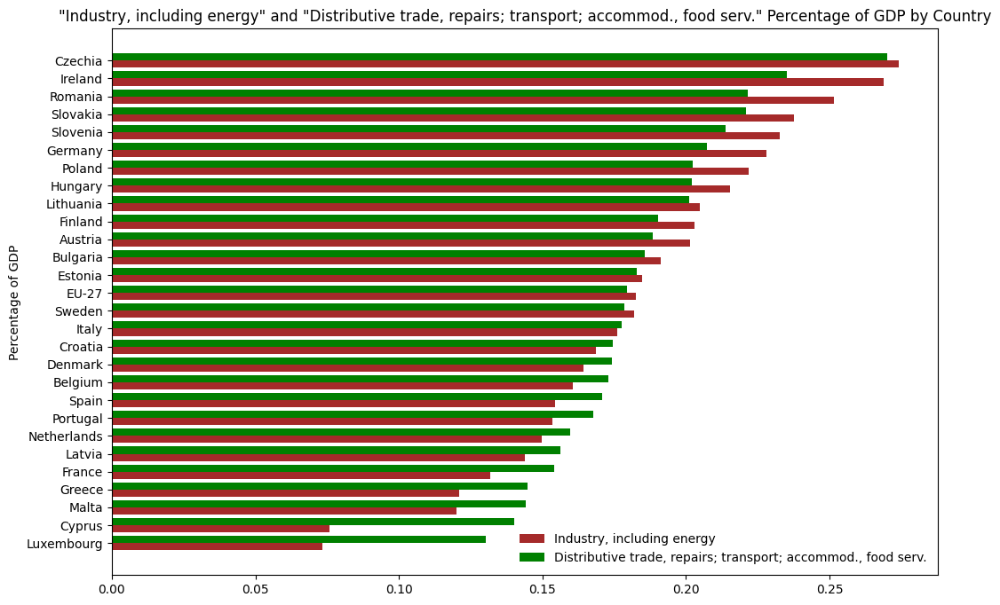

In [ ]:
# Computing a list of countries in ascending order by "Industry, including energy"/"Gross domestic product" mean
industry_percentages = Percent_GDP.groupby("Country")["Industry, including energy"].mean() / Percent_GDP.groupby("Country")["Gross domestic product"].mean()
sorted_countries_i = list(industry_percentages.sort_values(ascending=True).index)

# Computing a list of countries in ascending order by "Distributive trade, repairs; transport; accommod., food serv."/"Gross domestic product" mean
tourism_percentages = Percent_GDP.groupby("Country")["Distributive trade, repairs; transport; accommod., food serv."].mean() / Percent_GDP.groupby("Country")["Gross domestic product"].mean()
sorted_countries_t = list(tourism_percentages.sort_values(ascending=True).index)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))
bar_height = 0.4
ind = np.arange(len(sorted_countries_i))
ax.barh(ind, industry_percentages[sorted_countries_i], height=bar_height, color='brown', label='Industry, including energy')
ax.barh(ind + bar_height, tourism_percentages[sorted_countries_t], height=bar_height, color='green', label='Distributive trade, repairs; transport; accommod., food serv.')
plt.ylabel('Percentage of GDP')
plt.title('"Industry, including energy" and "Distributive trade, repairs; transport; accommod., food serv." Percentage of GDP by Country')
plt.legend(frameon=False)
plt.yticks(ind + bar_height / 2, sorted_countries_i)
plt.show()

fig.savefig("GDP_industry_tourism_stacked.svg", facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')

## II.IV. Convergence of GDP and GHG: A Merging Dataset

We now aim to integrate the GHG dataset discussed in Chapter I with the previously examined GDP in Euro dataset.

Firstly, we compute the Annual Growth Variation for the GHG too, just as was done previously for the GDPs. By doing this, we can create a merged DataFrame that includes total values, per capita values, and annual variations for both variables (GHG and GDP). Our focus is on Italy and European Union in general.

In [ ]:
# Merging emissions_df and gdp
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

emissions_small = df_emissions_multiindex.swaplevel("Country","Pollutant_name").loc["All greenhouse gases - (CO2 equivalent)"].swaplevel("Country","Sector_name").loc[chosen_sectors]

emissions_small
# This data frame only has 1 pollutant: All greenhouse gases
# There are only the main sectors 1-5 plus total and net emissions

emissions_small["per_capita_emiss_variation"] = emissions_small.per_capita_emission.pct_change()
# we add a column that has the percentage variation in emissions from the previous year

In [ ]:
# We need to set each row that has year = 1990 to NA
emissions_small.reset_index(inplace = True)
emissions_small.set_index("Year", inplace = True)
emissions_small.loc[1990,"per_capita_emiss_variation"] = np.nan

In [ ]:
# After setting the pct variation for 1990 to NA we go back to the original multiindex
emissions_small.reset_index(inplace = True)
emissions_small.set_index(["Sector_name","Country","Year"], inplace = True)
emissions_small

emissions    pop_mil  \
Sector_name                  Country Year                           
Total net emissions (UNFCCC) Austria 1990  66839.80065   7.677850   
                                     1991  63510.44321   7.754891   
                                     1992  66620.30167   7.840709   
                                     1993  59455.64712   7.905632   
                                     1994  67054.99115   7.936118   
...                                                ...        ...   
5 - Waste management         Sweden  2017   1347.52413  10.057695   
                                     2018   1265.19092  10.175215   
                                     2019   1146.64514  10.278888   
                                     2020   1076.80798  10.353444   
                                     2021    992.16500  10.415812   

                                           per_capita_emission  \
Sector_name                  Country Year                        
Total net emissions (UNFCCC) Austria 1990             0.008706   
                                     1991             0.008190   
                                     1992             0.008497   
                                     1993             0.007521   
                                     1994             0.008449   
...                                                        ...   
5 - Waste management         Sweden  2017             0.000134   
                                     2018             0.000124   
                                     2019             0.000112   
                                     2020             0.000104   
                                     2021             0.000095   

                                           per_capita_emiss_variation  
Sector_name                  Country Year                              
Total net emissions (UNFCCC) Austria 1990                         NaN  
                                     1991                   -0.059251  
                                     1992                    0.037485  
                                     1993                   -0.114874  
                                     1994                    0.123483  
...                                                               ...  
5 - Waste management         Sweden  2017                   -0.056819  
                                     2018                   -0.071944  
                                     2019                   -0.102839  
                                     2020                   -0.067668  
                                     2021                   -0.084123  

[6272 rows x 4 columns]

In [ ]:
# recalling the GDP in Euro datset that will be used
GDP_Euro

Country,Austria,Belgium,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,EU-27,Finland,...,Luxembourg,Malta,Netherlands,Poland,Portugal,Romania,Slovakia,Slovenia,Spain,Sweden
Year,,,,,,,,,,,,,,,,,,,,,
1990,NaN,NaN,NaN,NaN,NaN,NaN,108898.0,NaN,NaN,111394.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1991,NaN,NaN,NaN,NaN,NaN,NaN,112605.4,NaN,NaN,103292.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1992,NaN,NaN,NaN,NaN,NaN,NaN,118194.2,NaN,NaN,86806.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1993,NaN,NaN,NaN,NaN,NaN,NaN,122269.6,NaN,NaN,76101.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,181713.6
1994,NaN,NaN,NaN,NaN,NaN,NaN,131678.0,NaN,NaN,87157.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,192863.0
1995,184351.3,220251.5,14512.8,17524.7,7596.0,46008.4,141441.4,2988.1,6337710.4,102643.6,...,15946.2,2846.6,346000.8,108834.6,91015.8,28589.8,15322.9,16340.4,470155.7,204328.5
1996,186968.1,219965.3,9829.8,19174.1,7890.1,53088.1,147843.4,3770.0,6636498.9,104142.2,...,16462.1,3010.6,354929.1,126200.8,96626.8,29035.4,17053.2,16946.1,506362.6,229771.3
1997,187853.7,223032.7,10064.7,21277.6,8414.3,54857.3,153152.1,4553.7,6819195.7,112033.4,...,17266.5,3346.8,367861.6,140649.2,103306.6,31450.5,19331.1,18320.7,520831.0,236645.7
1998,195011.9,231015.7,13437.6,22931.7,9152.6,59824.8,158146.4,5067.5,7110871.8,119733.4,...,18005.7,3581.8,391460.9,155011.6,110683.7,37063.3,20333.8,19784.6,553338.4,241468.1


In [ ]:
# creating a pass-by dataframe to merge with the one above
gdp_tomerge = DataFrame(GDP_Euro.stack().swaplevel().sort_index())

gdp_tomerge.rename(columns = {0:"GDP"},inplace = True)

# merge
emissions_gdp_var = emissions_small.merge(gdp_tomerge, left_index = True, right_index = True)
emissions_gdp_var

emissions  \
Country Year Sector_name                                               
Austria 1995 Total net emissions (UNFCCC)                60182.37102   
             Total emissions (UNFCCC)                    79953.23792   
             1 - Energy                                  54161.64859   
             2 - Industrial Processes and Product Use    13606.44725   
             3 - Agriculture                              8130.44188   
...                                                              ...   
Sweden  2021 1 - Energy                                  33174.93947   
             2 - Industrial Processes and Product Use     6976.00260   
             3 - Agriculture                              6673.59431   
             4 - Land Use, Land-Use Change and Forestry -41710.83528   
             5 - Waste management                          992.16500   

                                                           pop_mil  \
Country Year Sector_name                                             
Austria 1995 Total net emissions (UNFCCC)                 7.948278   
             Total emissions (UNFCCC)                     7.948278   
             1 - Energy                                   7.948278   
             2 - Industrial Processes and Product Use     7.948278   
             3 - Agriculture                              7.948278   
...                                                            ...   
Sweden  2021 1 - Energy                                  10.415812   
             2 - Industrial Processes and Product Use    10.415812   
             3 - Agriculture                             10.415812   
             4 - Land Use, Land-Use Change and Forestry  10.415812   
             5 - Waste management                        10.415812   

                                                         per_capita_emission  \
Country Year Sector_name                                                       
Austria 1995 Total net emissions (UNFCCC)                           0.007572   
             Total emissions (UNFCCC)                               0.010059   
             1 - Energy                                             0.006814   
             2 - Industrial Processes and Product Use               0.001712   
             3 - Agriculture                                        0.001023   
...                                                                      ...   
Sweden  2021 1 - Energy                                             0.003185   
             2 - Industrial Processes and Product Use               0.000670   
             3 - Agriculture                                        0.000641   
             4 - Land Use, Land-Use Change and Forestry            -0.004005   
             5 - Waste management                                   0.000095   

                                                         per_capita_emiss_variation  \
Country Year Sector_name                                                              
Austria 1995 Total net emissions (UNFCCC)                                 -0.103865   
             Total emissions (UNFCCC)                                      0.040468   
             1 - Energy                                                    0.047745   
             2 - Industrial Processes and Product Use                      0.059170   
             3 - Agriculture                                               0.010229   
...                                                                             ...   
Sweden  2021 1 - Energy                                                    0.031703   
             2 - Industrial Processes and Product Use                      0.087294   
             3 - Agriculture                                              -0.023999   
             4 - Land Use, Land-Use Change and Forestry                    0.004226   
             5 - Waste management                                         -0.084123   

                                      

In [ ]:
emissions_gdp_var = emissions_gdp_var.swaplevel("Sector_name", "Year").copy()
emissions_gdp_var.sort_index(inplace = True)

# computing per_capita_GDP
emissions_gdp_var["per_capita_GDP"] = emissions_gdp_var["GDP"]/(emissions_gdp_var["pop_mil"]*1000000)

# computing the variation percentage
emissions_gdp_var["per_capita_GDP_var"] = emissions_gdp_var["per_capita_GDP"].pct_change()

# removing years before 1996 because pct_change calculates the variation with the wrong row
emissions_gdp_var.reset_index(inplace = True)
emissions_gdp_var.set_index("Year", inplace = True)
emissions_gdp_var.sort_index(inplace = True)
emissions_gdp_var = emissions_gdp_var.loc[1996:]
emissions_gdp_var.reset_index(inplace = True)
emissions_gdp_var.set_index(["Sector_name","Country","Year"], inplace = True)
emissions_gdp_var.sort_index(inplace = True)

emissions_gdp_var

<ipython-input-63-89b34f42cf35>:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



emissions    pop_mil  \
Sector_name                  Country Year                           
1 - Energy                   Austria 1996  58179.58075   7.959016   
                                     1997  57034.73889   7.968041   
                                     1998  56888.35703   7.976789   
                                     1999  55811.18875   7.992323   
                                     2000  55291.15769   8.011566   
...                                                ...        ...   
Total net emissions (UNFCCC) Sweden  2017  13772.65329  10.057695   
                                     2018  16333.47980  10.175215   
                                     2019  12351.59743  10.278888   
                                     2020   4927.40855  10.353444   
                                     2021   6105.86611  10.415812   

                                           per_capita_emission  \
Sector_name                  Country Year                        
1 - Energy                   Austria 1996             0.007310   
                                     1997             0.007158   
                                     1998             0.007132   
                                     1999             0.006983   
                                     2000             0.006901   
...                                                        ...   
Total net emissions (UNFCCC) Sweden  2017             0.001369   
                                     2018             0.001605   
                                     2019             0.001202   
                                     2020             0.000476   
                                     2021             0.000586   

                                           per_capita_emiss_variation  \
Sector_name                  Country Year                               
1 - Energy                   Austria 1996                    0.072735   
                                     1997                   -0.020788   
                                     1998                   -0.003660   
                                     1999                   -0.020842   
                                     2000                   -0.011697   
...                                                               ...   
Total net emissions (UNFCCC) Sweden  2017                    0.646670   
                                     2018                    0.172238   
                                     2019                   -0.251414   
                                     2020                   -0.603944   
                                     2021                    0.231744   

                                                GDP  per_capita_GDP  \
Sector_name                  Country Year                             
1 - Energy                   Austria 1996  186968.1        0.023491   
                                     1997  187853.7        0.023576   
                                     1998  195011.9        0.024447   
                                     1999  203850.6        0.025506   
                                     2000  213606.5        0.026662   
...                                             ...             ...   
Total net emissions (UNFCCC) Sweden  2017  480025.5        0.047727   
                                     2018  470673.1        0.046257   
                                     2019  476869.5        0.046393   
                                     2020  480556.4        0.046415   
                                     2021  540734.0        0.051915   

                                           per_capita_GDP_var  
Sector_name                  Country Year                      
1 - Energy                   Austria 1996            0.012826  
                                     1997            0.003599  
                                     1998            0.036967  
                                     1999            0.043292  
                              

In [ ]:
emissions_gdp_var.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 5096 entries, ('1 - Energy', 'Austria', 1996) to ('Total net emissions (UNFCCC)', 'Sweden', 2021)
Data columns (total 7 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   emissions                   5096 non-null   float64
 1   pop_mil                     5096 non-null   float64
 2   per_capita_emission         5096 non-null   float64
 3   per_capita_emiss_variation  5096 non-null   float64
 4   GDP                         5096 non-null   float64
 5   per_capita_GDP              5096 non-null   float64
 6   per_capita_GDP_var          5096 non-null   float64
dtypes: float64(7)
memory usage: 296.6+ KB


We proceed to select only Italy and total net emissions.

Then we repeat the same process for the European Union in general.

In [ ]:
merge_df_italy = emissions_gdp_var.swaplevel(0,1).loc["Italy"]
merge_df_italy = merge_df_italy.loc["Total net emissions (UNFCCC)"]
# merge_df_italy = merge_df_italy.loc[2002:]
merge_df_italy

,emissions,pop_mil,per_capita_emission,per_capita_emiss_variation,GDP,per_capita_GDP,per_capita_GDP_var
Year,,,,,,,
1996,504950.86843,56.860279,0.008881,-0.013533,1033759.7,0.018181,0.150473
1997,521072.05478,56.890371,0.009159,0.031380,1096302.0,0.019270,0.059939
1998,536008.61507,56.906744,0.009419,0.028369,1134534.9,0.019937,0.034577
1999,531850.92375,56.916316,0.009344,-0.007924,1175149.5,0.020647,0.035624
2000,538424.00139,56.942108,0.009456,0.011900,1241512.9,0.021803,0.055994
2001,530039.93106,56.976976,0.009303,-0.016174,1304136.8,0.022889,0.049799
2002,531633.10430,57.089823,0.009312,0.001023,1350258.9,0.023651,0.033319
2003,559110.08083,57.399187,0.009741,0.046016,1394693.2,0.024298,0.027341
2004,558433.10964,57.828178,0.009657,-0.008620,1452319.0,0.025114,0.033593


In [ ]:
merge_df_eu = emissions_gdp_var.swaplevel(0,1).loc["EU-27"]
merge_df_eu = merge_df_eu.loc["Total net emissions (UNFCCC)"]
# merge_df_eu = merge_df_eu.loc[2002:]
merge_df_eu

,emissions,pop_mil,per_capita_emission,per_capita_emiss_variation,GDP,per_capita_GDP,per_capita_GDP_var
Year,,,,,,,
1996,4.316768e+06,426.364400,0.010125,0.015540,6636498.9,0.015565,0.045476
1997,4.253050e+06,426.941575,0.009962,-0.016092,6819195.7,0.015972,0.026140
1998,4.200609e+06,427.424910,0.009828,-0.013447,7110871.8,0.016637,0.041594
1999,4.110420e+06,428.042160,0.009603,-0.022882,7430927.0,0.017360,0.043502
2000,4.147881e+06,428.966671,0.009669,0.006939,7869362.7,0.018345,0.056719
2001,4.147146e+06,429.346943,0.009659,-0.001063,8241897.8,0.019196,0.046412
2002,4.162905e+06,430.374563,0.009673,0.001403,8538773.3,0.019840,0.033547
2003,4.255388e+06,432.009574,0.009850,0.018347,8767565.2,0.020295,0.022908
2004,4.218832e+06,433.611128,0.009730,-0.012252,9167938.8,0.021143,0.041803


Lastly, we plot the datasets to provide a more comprehensive overview.

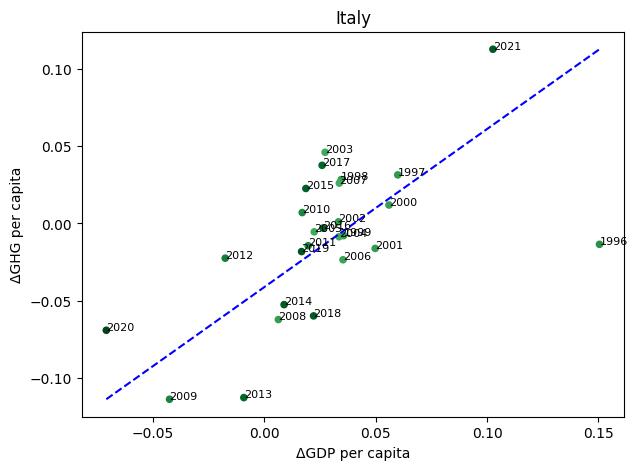

In [ ]:
# defining colors
colors = (merge_df_italy.emissions - np.min(merge_df_italy.emissions))/np.max(merge_df_italy.emissions)
colors = plt.get_cmap('Greens_r')(colors)

# Italy merged dataset plot
ax = merge_df_italy.plot.scatter(y = 'per_capita_emiss_variation', x = 'per_capita_GDP_var', title = "Italy", figsize = (7,5), s = 20, c = colors)

ax.plot([merge_df_italy['per_capita_GDP_var'].min(), merge_df_italy['per_capita_GDP_var'].max()],
        [merge_df_italy['per_capita_emiss_variation'].min(), merge_df_italy['per_capita_emiss_variation'].max()],
        color='blue', linestyle='--')

ax.set_ylabel("ΔGHG per capita")
ax.set_xlabel("ΔGDP per capita")

for i, row in merge_df_italy.iterrows():
    ax.text(row['per_capita_GDP_var'],row['per_capita_emiss_variation'], f'{i}', ha='left', fontsize = 8)
plt.show()

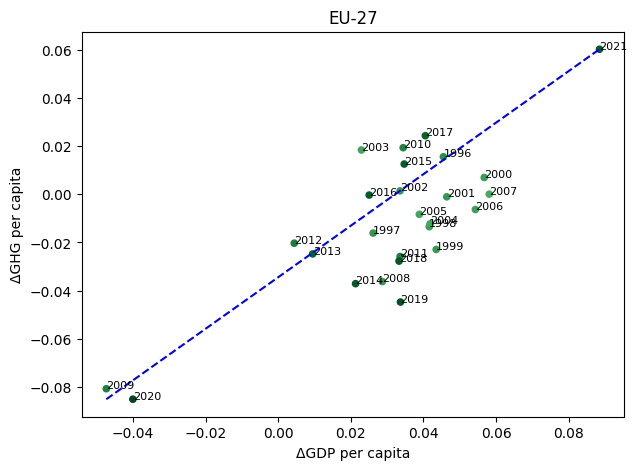

In [ ]:
# defining colors
colors = (merge_df_italy.emissions - np.min(merge_df_italy.emissions))/np.max(merge_df_italy.emissions)
colors = plt.get_cmap('Greens_r')(colors)

# EU-27 merged dataset plot
ax = merge_df_eu.plot.scatter(y = 'per_capita_emiss_variation', x = 'per_capita_GDP_var', title = "EU-27", figsize = (7,5), s = 20, c = colors)

ax.plot([merge_df_eu['per_capita_GDP_var'].min(), merge_df_eu['per_capita_GDP_var'].max()],
        [merge_df_eu['per_capita_emiss_variation'].min(), merge_df_eu['per_capita_emiss_variation'].max()],
        color='blue', linestyle='--')

ax.set_ylabel("ΔGHG per capita")
ax.set_xlabel("ΔGDP per capita")

for i, row in merge_df_eu.iterrows():
    ax.text(row['per_capita_GDP_var'],row['per_capita_emiss_variation'], f'{i}', ha='left', fontsize = 8)

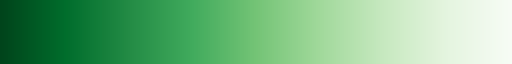

In [ ]:
plt.get_cmap("Greens_r") # lighter points mean higher emissions

By looking to both of the scatterplots, it becomes evident that there is a correlation between the variations of GHG per capita and GDP per capita. Consequently, we might want to calculate the correlation coefficient between these two variables.

In [ ]:
# correlation
italy_corr = merge_df_italy['per_capita_GDP_var'].corr(merge_df_italy['per_capita_emiss_variation'])
print("Italy_corr:", italy_corr)

eu27_corr = merge_df_eu['per_capita_GDP_var'].corr(merge_df_eu['per_capita_emiss_variation'])
print("EU-27_corr:", eu27_corr)

Italy_corr: 0.6010900209766104
EU-27_corr: 0.8015322339555422


In [ ]:
# We try to remove the two oultiers 2020 and 2021
print(" italy: ",merge_df_italy.iloc[:-2]['per_capita_GDP_var'].corr(merge_df_italy.iloc[:-2]['per_capita_emiss_variation']))
print(" eu-27: ",merge_df_eu.iloc[:-2]['per_capita_GDP_var'].corr(merge_df_eu.iloc[:-2]['per_capita_emiss_variation']))

 italy:  0.45733538370236354
 eu-27:  0.6483019842594229


The correlation between per capita gdp growth and percapita emissions variation is significantly lower for total EU-27 if we exclude the outliers of the COVID-19 pandemic.

In [ ]:
# covariance
italy_cov = merge_df_italy['per_capita_GDP_var'].cov(merge_df_italy['per_capita_emiss_variation'])
print("Italy_cov:", italy_cov)

eu27_cov = merge_df_eu['per_capita_GDP_var'].cov(merge_df_eu['per_capita_emiss_variation'])
print("EU-27_corr:", eu27_cov)

Italy_cov: 0.001207171706114419
EU-27_corr: 0.0006800921078004861


Once computed the correlation coefficients of the two variables aforementioned for Italy and EU-27, it can be confirmed that indeed a relatively high correlation between the two. By computing the covariance we can affirm that the relationship between the two variables is positive.

# III° Chapter


In this third section, our aim was to identify the sector with the highest Greenhouse Gas Emissions and assess its impact on the total GDP of each European Union country. To achieve this, we recall the previous merged dataset *emissions_gdp_var*.

In [ ]:
emissions_gdp_var

emissions    pop_mil  \
Sector_name                  Country Year                           
1 - Energy                   Austria 1996  58179.58075   7.959016   
                                     1997  57034.73889   7.968041   
                                     1998  56888.35703   7.976789   
                                     1999  55811.18875   7.992323   
                                     2000  55291.15769   8.011566   
...                                                ...        ...   
Total net emissions (UNFCCC) Sweden  2017  13772.65329  10.057695   
                                     2018  16333.47980  10.175215   
                                     2019  12351.59743  10.278888   
                                     2020   4927.40855  10.353444   
                                     2021   6105.86611  10.415812   

                                           per_capita_emission  \
Sector_name                  Country Year                        
1 - Energy                   Austria 1996             0.007310   
                                     1997             0.007158   
                                     1998             0.007132   
                                     1999             0.006983   
                                     2000             0.006901   
...                                                        ...   
Total net emissions (UNFCCC) Sweden  2017             0.001369   
                                     2018             0.001605   
                                     2019             0.001202   
                                     2020             0.000476   
                                     2021             0.000586   

                                           per_capita_emiss_variation  \
Sector_name                  Country Year                               
1 - Energy                   Austria 1996                    0.072735   
                                     1997                   -0.020788   
                                     1998                   -0.003660   
                                     1999                   -0.020842   
                                     2000                   -0.011697   
...                                                               ...   
Total net emissions (UNFCCC) Sweden  2017                    0.646670   
                                     2018                    0.172238   
                                     2019                   -0.251414   
                                     2020                   -0.603944   
                                     2021                    0.231744   

                                                GDP  per_capita_GDP  \
Sector_name                  Country Year                             
1 - Energy                   Austria 1996  186968.1        0.023491   
                                     1997  187853.7        0.023576   
                                     1998  195011.9        0.024447   
                                     1999  203850.6        0.025506   
                                     2000  213606.5        0.026662   
...                                             ...             ...   
Total net emissions (UNFCCC) Sweden  2017  480025.5        0.047727   
                                     2018  470673.1        0.046257   
                                     2019  476869.5        0.046393   
                                     2020  480556.4        0.046415   
                                     2021  540734.0        0.051915   

                                           per_capita_GDP_var  
Sector_name                  Country Year                      
1 - Energy                   Austria 1996            0.012826  
                                     1997            0.003599  
                                     1998            0.036967  
                                     1999            0.043292  
                              

## III.I. ΔGHG per capita vs. ΔGDP per capita: Analysis for Each Emissions' Sectors

In our analysis, we try to understand the correlation between the variations of both GHG and GDP for each sector identified in the emissions' dataset.

In [ ]:
# computing the correlation between "per_capita_emiss_variation" and "per_capita_GDP_var" for each sector
sectors_corr = emissions_gdp_var.reset_index().groupby("Sector_name").apply(lambda x: x[["per_capita_emiss_variation", "per_capita_GDP_var"]].corr().iloc[1,0])

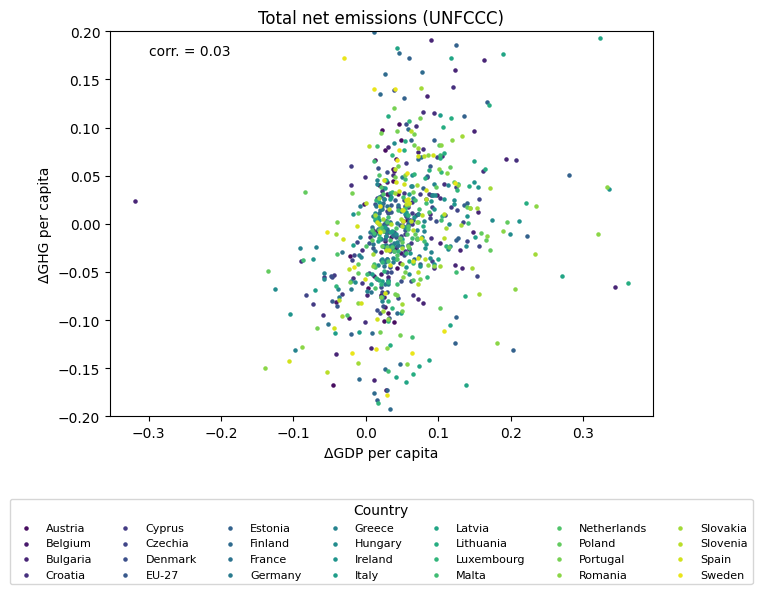

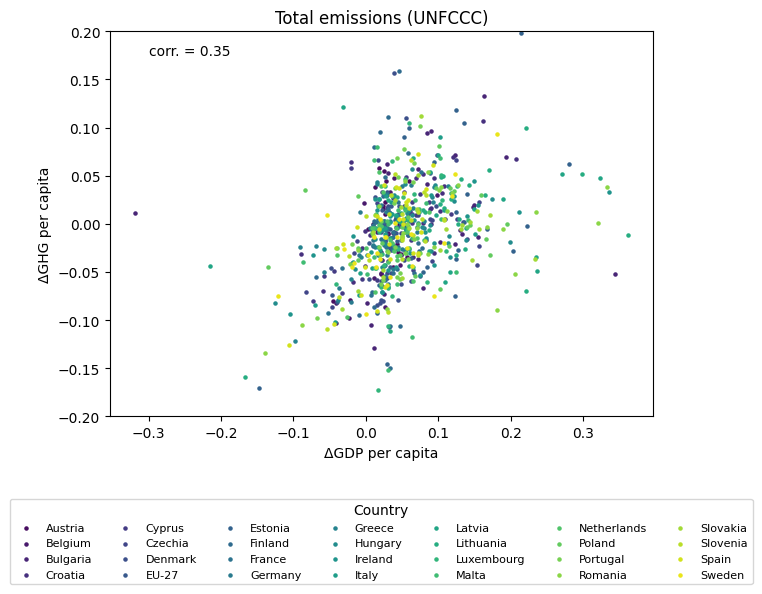

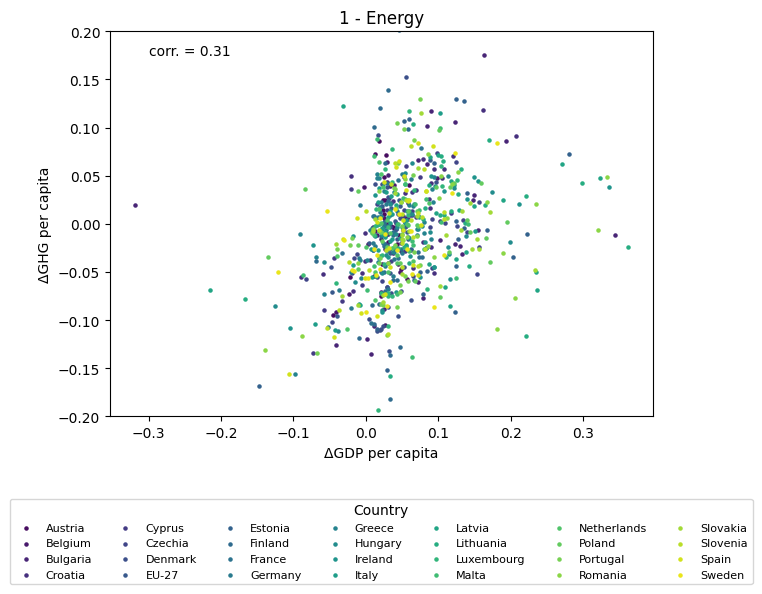

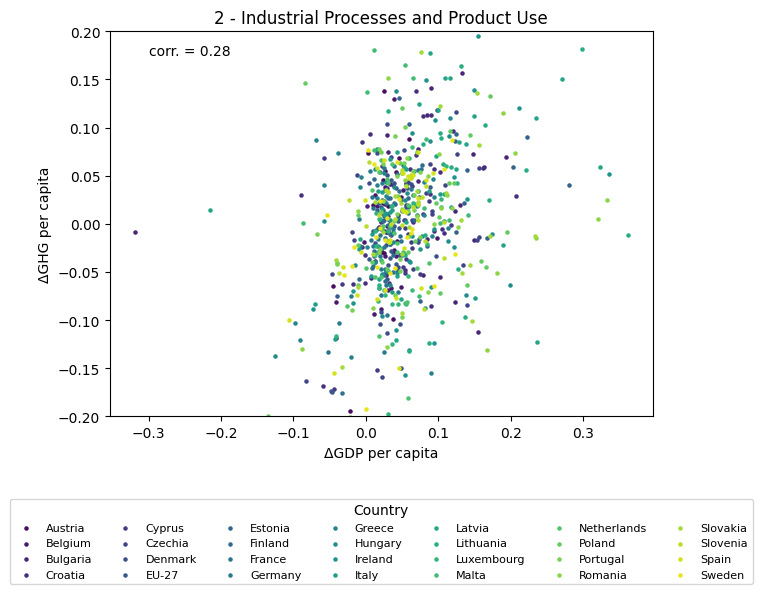

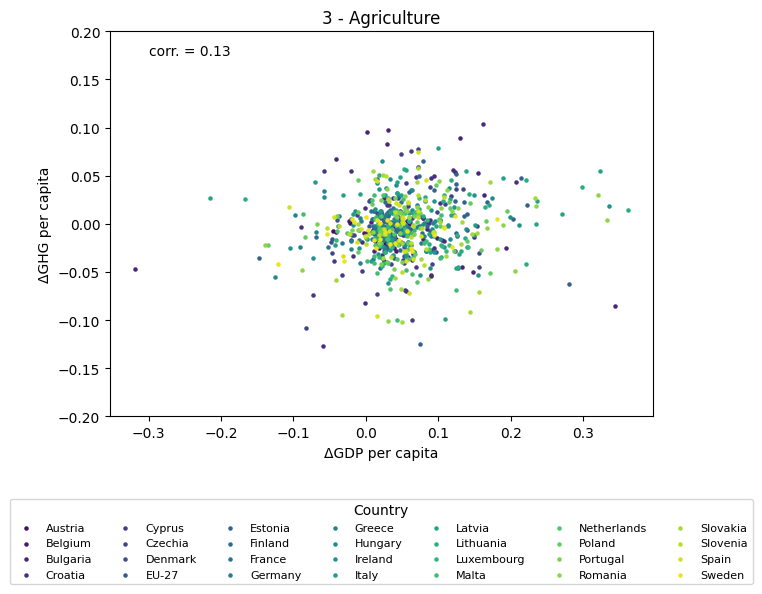

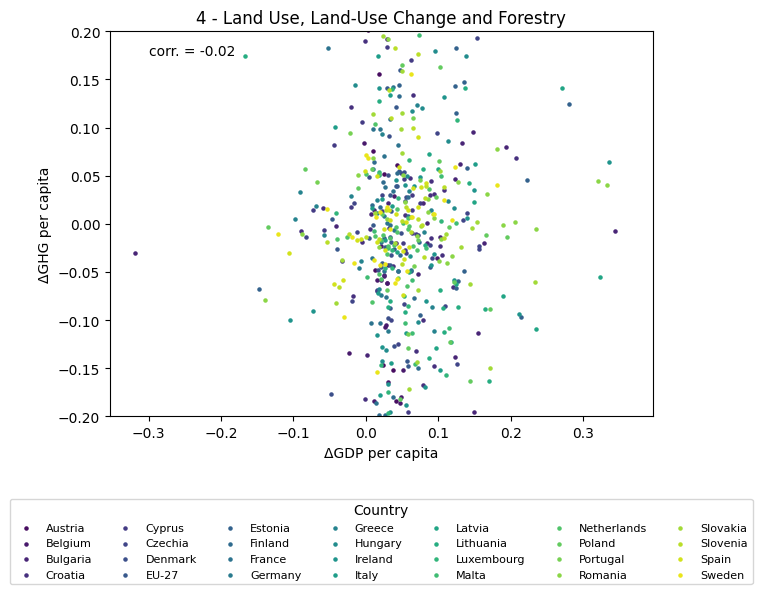

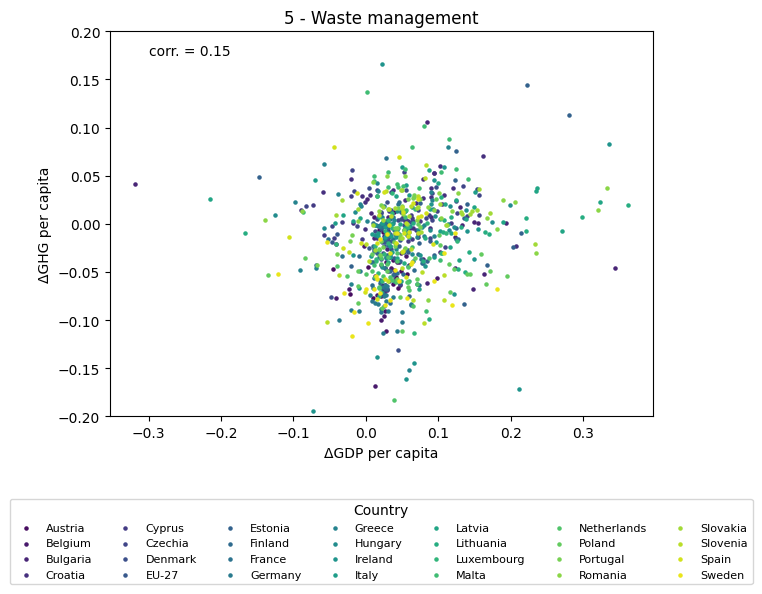

In [ ]:
# creating a scatterplot for each sector
palette = sns.color_palette("viridis", n_colors=len(emissions_gdp_var.index.get_level_values('Country').unique()))

chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

for sector in chosen_sectors:
  fig, ax = plt.subplots(figsize=(7, 5))
  ax.set_title(sector)

  for i, country in enumerate(emissions_gdp_var.index.get_level_values('Country').unique()):
      country_data = emissions_gdp_var.loc[sector].loc[country]
      ax.scatter(x=country_data['per_capita_GDP_var'], y=country_data['per_capita_emiss_variation'], label=country, color= palette[i], s=5)

  ax.legend(title='Country', loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=7, fontsize=8)
  plt.ylim(-0.2,0.2)
  ax.set_ylabel("ΔGHG per capita")
  ax.set_xlabel("ΔGDP per capita")
  ax.text(x = -0.3, y = 0.175, s = f"corr. = {sectors_corr[sector]:.2f}", c = "black")
  plt.show()

While plotting the previous scatterplots, we are looking at the relationship between the variation of GDP and GHG both. It is evident that an increase in GDP variation corresponds to an increase in GHG variation.

Specifically, in Chapter I, our observations highlighted that the primary sector influencing the trajectory of total emissions is the *Energy* sector. This is underlined by the high correlation, mirroring the correlation observed in *Total emissions*.

Otherwise as expected, the *Total net emissions*' correlation is tending to zero. This is determined by the fact that in some countries, the relationship between the variations per capita of both GDP and GHG is not that strong.

While the value of the *Land Use, Land-Use Change and Forestry*'s correlation is negative, but at the same time is tending to zero. For this reason, we can say that there's no correlation between a growth in variations of GDP and GHG both.

## III.II. ΔGHG per capita vs. ΔGDP per capita: total net emissions

As we've already mentioned, the *ΔTotal net emissions'* correlation with the *ΔGDP* is tending to zero. For this reason, we want to understand which is the correlation between the two variables in each country.

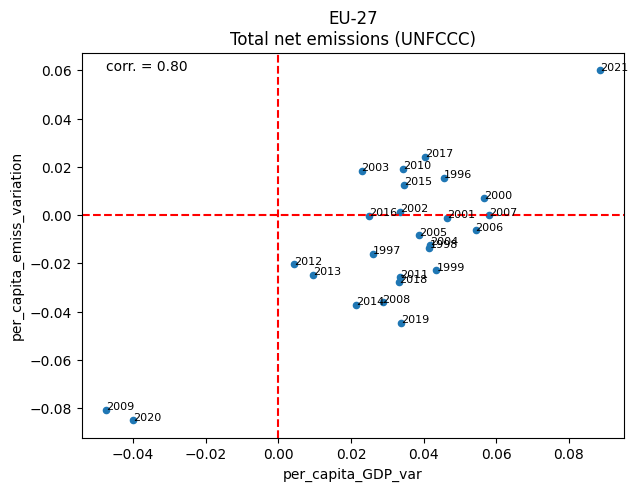

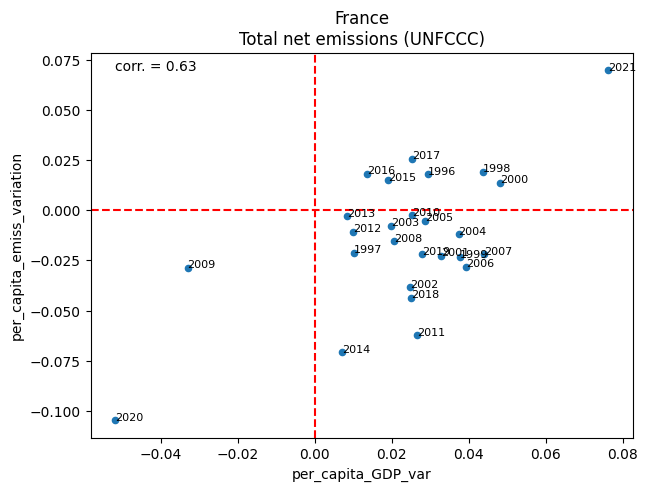

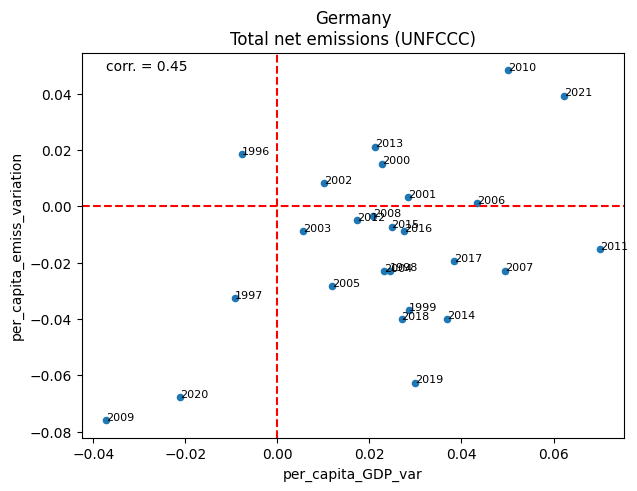

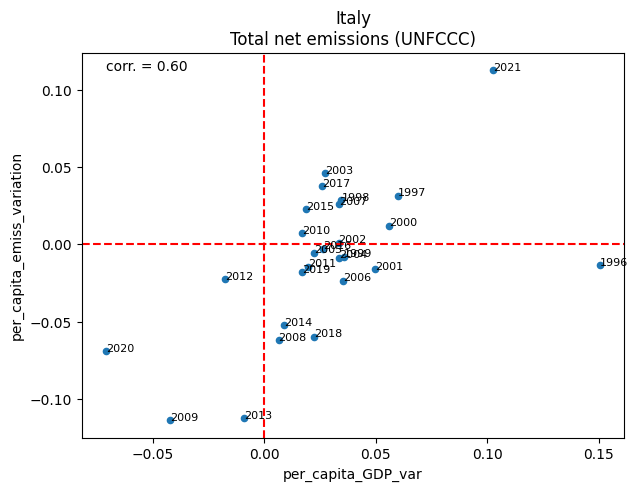

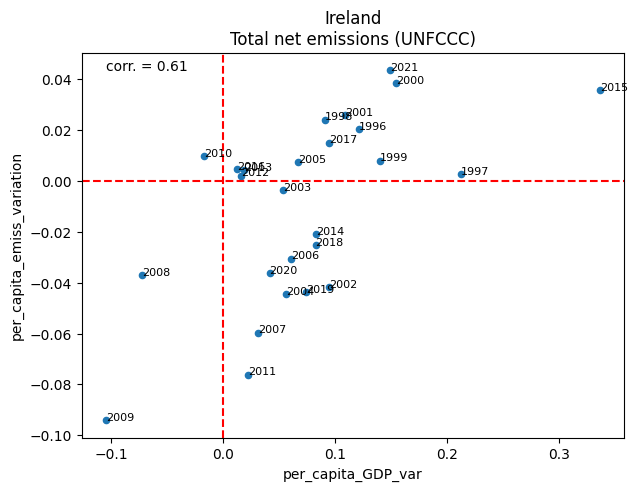

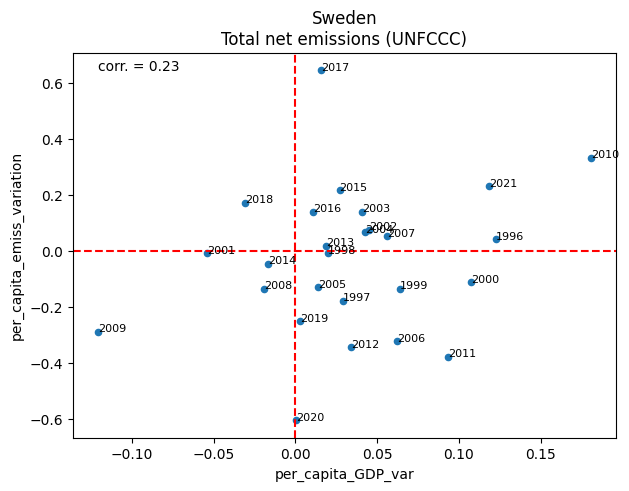

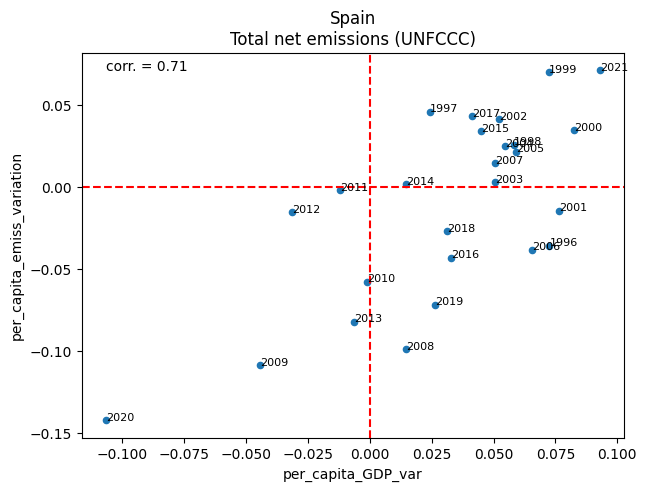

In [ ]:
sector = "Total net emissions (UNFCCC)"
countries = ['EU-27', "France", 'Germany', 'Italy', 'Ireland', 'Sweden',  "Spain"]

# computing the correlation between "per_capita_emiss_variation" and "per_capita_GDP_var" for the sector "Total net emissions (UNFCCC)" for each country
countries_net_corr = emissions_gdp_var.loc[sector].reset_index().groupby("Country").apply(lambda x: x[["per_capita_emiss_variation", "per_capita_GDP_var"]].corr().iloc[1,0])

# plotting
for country in countries:
    country_data = emissions_gdp_var.loc[sector].loc[country]
    country_data.plot.scatter(x = "per_capita_GDP_var", y = "per_capita_emiss_variation", title = country + "\n" + sector)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.axvline(x=0, color='red', linestyle='--')
    plt.text(x = country_data["per_capita_GDP_var"].min(), y = country_data["per_capita_emiss_variation"].max(), s = f"corr. = {countries_net_corr[country]:.2f}", c = "black")
    for i, row in country_data.iterrows():
        plt.text(row['per_capita_GDP_var'], row['per_capita_emiss_variation'], f'{i}', ha='left', fontsize = 8)
    plt.show()

In [ ]:
# computing the correlation between "per_capita_emiss_variation" and "per_capita_GDP_var" for each country for the sector total emissions
countries_total_corr = emissions_gdp_var.loc["Total emissions (UNFCCC)"].reset_index().groupby("Country").apply(lambda x: x[["per_capita_emiss_variation", "per_capita_GDP_var"]].corr().iloc[0,1])
countries_total_corr.sort_values(ascending = False)

Country
EU-27          0.805063
Spain          0.725030
Italy          0.686701
Croatia        0.680157
France         0.659436
Greece         0.649733
Cyprus         0.623044
Ireland        0.607729
Sweden         0.587396
Slovenia       0.577011
Belgium        0.528215
Czechia        0.503892
Portugal       0.493503
Germany        0.487155
Lithuania      0.471325
Romania        0.453958
Hungary        0.427244
Estonia        0.424490
Luxembourg     0.391530
Austria        0.342034
Slovakia       0.246729
Netherlands    0.229200
Bulgaria       0.206854
Denmark        0.200041
Poland         0.166636
Finland        0.117287
Latvia         0.084291
Malta         -0.099161
dtype: float64

If the outlier year '2020,' characterized by the COVID-19 pandemic lockdown, is excluded from the correlation calculation, distinct correlation values are obtained, as displayed below:

In [ ]:
wo_2020 = emissions_gdp_var.loc["Total emissions (UNFCCC)"].reset_index()[emissions_gdp_var.loc["Total emissions (UNFCCC)"].reset_index().Year <2020].groupby("Country").apply(lambda x: x[["per_capita_emiss_variation", "per_capita_GDP_var"]].corr().iloc[1,0]).sort_values(ascending = False)
NET_wo_2020 = emissions_gdp_var.loc["Total net emissions (UNFCCC)"].reset_index()[emissions_gdp_var.loc['Total net emissions (UNFCCC)'].reset_index().Year <2020].groupby("Country").apply(lambda x: x[["per_capita_emiss_variation", "per_capita_GDP_var"]].corr().iloc[1,0]).sort_values(ascending = False)
Corr_df = DataFrame([countries_total_corr,countries_net_corr,wo_2020,NET_wo_2020]).T.rename(columns = {0: "Total emissions", 1: "Total NET emissions", 2:"Total w/o 2020", 3:"Total NET w/o 2020"}).sort_values(by="Total emissions",ascending = False)
Corr_df

,Total emissions,Total NET emissions,Total w/o 2020,Total NET w/o 2020
Country,,,,
EU-27,0.805063,0.801532,0.646364,0.648302
Spain,0.725030,0.714336,0.590334,0.563141
Italy,0.686701,0.601090,0.518116,0.457335
Croatia,0.680157,0.558770,0.649344,0.548899
France,0.659436,0.629927,0.315734,0.208473
Greece,0.649733,0.633318,0.517454,0.496991
Cyprus,0.623044,0.629803,0.604573,0.600880
Ireland,0.607729,0.609142,0.590502,0.589690
Sweden,0.587396,0.228215,0.559296,0.150883


## III.III. Comparison between Sectorial Emissions and GDPs: A Detailed Examination Through Data

In this subsection, our objective is to analyze the classification of the sectors identified in Chapter I within the GDP sectors. The aim is to assess the magnitude to which emissions contribute to the GDPs within each sector.


In [ ]:
# List of GDP sectors relevant emissions

'1 - Energy',
'1.A.1 - Energy Industries',
'1.A.2 - Manufacturing Industries and Construction',
'1.A.3 - Transport',
'1.B - Fugitive Emissions from Fuels',
'1.C - CO2 Transport and Storage',

'2 - Industrial Processes and Product Use',
'2.A - Mineral Industry',
'2.B - Chemical Industry',
'2.C - Metal Industry',
    #    '2.D - Non-energy Products from Fuels and Solvent Use',  to be added to  Other Industrial
'2.E - Electronics Industry',
    #    '2.F - Product Uses as Substitutes for ODS', to be added to  Other Industrial
    #    '2.G - Other Product Manufacture and Use', to be added to  Other Industrial
    #    '2.H - Other Industrial Process and Product Use', to be added to Other Industrial

'3 - Agriculture',
'3.1 - Livestock',
'3.B - Manure Management',
'3.C - Rice Cultivation',
'3.D - Agricultural Soils',
    #    '3.E - Prescribed Burning of Savannas', to be added to Other Agriculture
    #    '3.F - Field Burning of Agricultural Residues', to be added to Other Agriculture
    #    '3.G - Liming', to be added to Other Agriculture
    #    '3.H - Urea Application', to be added to Other Agriculture
    #    '3.I - Other Carbon-containing Fertilizers', to be added to Other Agriculture
    #    '3.J - Other agriculture emissions', to be added to Other Agriculture

#  The next ones in item 4 go under agricultures
'4.A - Forest Land',
'4.B - Cropland',
'4.C - Grassland',
'4.D - Wetlands',
'4.G - Harvested Wood Products',

'6 - Other Sector'

'6 - Other Sector'

Firstly, we establish the list of labels contained in *df_emissions_multiindex* that we wish to select. Once done this, we reshape the dataframe to the desired format for our analysis and shift our focus to Italy and the broader European Union.

In [ ]:
correct_list = ['1 - Energy', '1.A.1 - Energy Industries','1.A.2 - Manufacturing Industries and Construction',
            '1.A.3 - Transport', '1.B - Fugitive Emissions from Fuels', '1.C - CO2 Transport and Storage',
            '2 - Industrial Processes and Product Use', '2.A - Mineral Industry','2.B - Chemical Industry',
            '2.C - Metal Industry', '2.E - Electronics Industry', '3 - Agriculture', '3.1 - Livestock',
            '3.B - Manure Management', '3.C - Rice Cultivation', '3.D - Agricultural Soils', '4.A - Forest Land',
            '4.B - Cropland', '4.C - Grassland', '4.D - Wetlands', '4.F - Other Land', '4.G - Harvested Wood Products',
            'Total emissions (UNFCCC)', 'Total net emissions (UNFCCC)']

ita_eu27_emi = df_emissions_multiindex.swaplevel("Country","Pollutant_name").loc["All greenhouse gases - (CO2 equivalent)"].swaplevel("Country","Sector_name").loc[correct_list]

ita_eu27_emi["per_capita_emiss_variation"] = ita_eu27_emi.per_capita_emission.pct_change()
# We add a column that has the percentage variation in emissions from the previous year

# We need to set each row that has year = 1990 to NA
ita_eu27_emi.reset_index(inplace = True)
ita_eu27_emi.set_index("Year", inplace = True)
ita_eu27_emi.loc[1990,"per_capita_emiss_variation"] = np.nan

# After setting the pct variation for 1990 to NA we go back to the original multiindex
ita_eu27_emi.reset_index(inplace = True)
ita_eu27_emi.set_index(["Sector_name","Country","Year"], inplace = True)

# Slicing
ita_eu27_emi = ita_eu27_emi.swaplevel(0,1).loc[["Italy", "EU-27"]]

Since not all 172 labels in Chapter I were chosen due to their marginal significance, a custom function is utilized to compute the difference between the main label and each corresponding sub-label. Subsequently, each computed difference is added to our DataFrame.

In [ ]:
# Creating a function to add a new agreggate sector to ita_eu27_emi dataset
def agg_sector(df, country, sector, prefix, new_sector):
  country_sector = df.loc[(country, sector), 'emissions'].groupby('Year').sum()
  country_prefix = df.loc[(country, df.index.get_level_values('Sector_name').str.startswith(prefix)), 'emissions'].groupby('Year').sum()
  new_data = country_sector - country_prefix

  df = df.reset_index()

  new_row_country = pd.DataFrame({
      'Country': country,
      'Sector_name': new_sector,
      'Year': new_data.index,
      'emissions': new_data.values
    })

  df = pd.concat([df, new_row_country], ignore_index=True, sort=False)
  df = df.sort_values(by=['Sector_name', 'Country', 'Year'])
  df.set_index(['Country','Sector_name','Year'], inplace=True)

  pop = df.loc[(country, sector), 'pop_mil']
  df.loc[(country, new_sector), 'pop_mil'] = pop.values

  df['per_capita_emission'] = df['emissions'] / (df['pop_mil'] * 1000000)

  return df

In [ ]:
# Adding the new aggregate sector to ita_eu27_emi dataset
ita_eu27_emi = agg_sector(ita_eu27_emi, 'Italy', '1 - Energy', '1.', '1.Extra - Others')
ita_eu27_emi = agg_sector(ita_eu27_emi, 'EU-27', '1 - Energy', '1.', '1.Extra - Others')
ita_eu27_emi = agg_sector(ita_eu27_emi, 'Italy', '2 - Industrial Processes and Product Use', '2.', '2.Extra - Others')
ita_eu27_emi = agg_sector(ita_eu27_emi, 'EU-27', '2 - Industrial Processes and Product Use', '2.', '2.Extra - Others')
ita_eu27_emi = agg_sector(ita_eu27_emi, 'Italy', '3 - Agriculture', '3.', '3.Extra - Others')
ita_eu27_emi = agg_sector(ita_eu27_emi, 'EU-27', '3 - Agriculture', '3.', '3.Extra - Others')

<ipython-input-81-6264a34507fe>:3: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:20: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:21: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:3: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:20: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:21: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:3: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:20: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-input-81-6264a34507fe>:21: PerformanceWarning:

indexing past lexsort depth may impact performance.

<ipython-inpu

After incorporating all the labels identifying the emissions, our objective is to categorize these labels under the sectors utilized in the Percent_GDP DataFrame. To achieve this, we create a dictionary that will be reversed as it aligns more effectively with our goal.

In [ ]:
# Dictionary
dic_gdp_emi = {'Agriculture, forestry and fishing' : ['3.1 - Livestock', '3.B - Manure Management', '3.C - Rice Cultivation',
                                                      '3.D - Agricultural Soils', '4.A - Forest Land', '4.B - Cropland', '4.C - Grassland', '4.D - Wetlands',
                                                      '4.G - Harvested Wood Products','3.Extra - Others','4.F - Other Land'],
               'Construction' : [],
               'Distributive trade, repairs; transport; accommod., food serv.' : ['1.A.3 - Transport',
                                                                                  '1.B - Fugitive Emissions from Fuels', '1.C - CO2 Transport and Storage'],
               'Financial and insurance activities' : [],
               'Gross domestic product' : [],
               'Industry, including energy' : ['1.A.1 - Energy Industries', '1.A.2 - Manufacturing Industries and Construction', '2.A - Mineral Industry',
                                               '2.B - Chemical Industry', '2.C - Metal Industry', '2.E - Electronics Industry', '2.Extra - Others','1.Extra - Others'],
               'Information and communication' : [],
               'Other service activities' : [],
               'Prof., scientific, techn.; admin., support serv. activities' : [],
               'Public admin.; compulsory s.s.; education; human health' : [],
               'Real estate activities' : [],
               'Totals' : ['Total emissions (UNFCCC)','Total net emissions (UNFCCC)']
               }


def invert_dict(dict_to_invert):
    res_dict = dict()
    for key in dict_to_invert:
        for item in dict_to_invert[key]:
            res_dict[item] = key
    return res_dict

print("Sectors included:")
print(*invert_dict(dic_gdp_emi),sep = "\n")
print("-"*120)

gdp_sector = ita_eu27_emi.reset_index().Sector_name.map(invert_dict(dic_gdp_emi))
gdp_sector.index = ita_eu27_emi.index


ita_eu27_emi["gdp_sector"] = gdp_sector

ita_eu27_emi.gdp_sector.value_counts()

Sectors included:
3.1 - Livestock
3.B - Manure Management
3.C - Rice Cultivation
3.D - Agricultural Soils
4.A - Forest Land
4.B - Cropland
4.C - Grassland
4.D - Wetlands
4.G - Harvested Wood Products
3.Extra - Others
4.F - Other Land
1.A.3 - Transport
1.B - Fugitive Emissions from Fuels
1.C - CO2 Transport and Storage
1.A.1 - Energy Industries
1.A.2 - Manufacturing Industries and Construction
2.A - Mineral Industry
2.B - Chemical Industry
2.C - Metal Industry
2.E - Electronics Industry
2.Extra - Others
1.Extra - Others
Total emissions (UNFCCC)
Total net emissions (UNFCCC)
------------------------------------------------------------------------------------------------------------------------


Agriculture, forestry and fishing                                704
Industry, including energy                                       512
Distributive trade, repairs; transport; accommod., food serv.    192
Totals                                                           128
Name: gdp_sector, dtype: int64

In [ ]:
# Dropping columns where values is NaN
ita_eu27_emi[ita_eu27_emi.gdp_sector.notna()]

emissions     pop_mil  \
Country Sector_name                  Year                             
EU-27   1.A.1 - Energy Industries    1990  1.442050e+06  418.793689   
                                     1991  1.409483e+06  421.369837   
                                     1992  1.362947e+06  422.646656   
                                     1993  1.311451e+06  423.940051   
                                     1994  1.318139e+06  424.914845   
...                                                 ...         ...   
Italy   Total net emissions (UNFCCC) 2017  4.140434e+05   60.002254   
                                     2018  3.884603e+05   59.877216   
                                     2019  3.804392e+05   59.729077   
                                     2020  3.524252e+05   59.438845   
                                     2021  3.901183e+05   59.133173   

                                           per_capita_emission  \
Country Sector_name                  Year                        
EU-27   1.A.1 - Energy Industries    1990             0.003443   
                                     1991             0.003345   
                                     1992             0.003225   
                                     1993             0.003093   
                                     1994             0.003102   
...                                                        ...   
Italy   Total net emissions (UNFCCC) 2017             0.006900   
                                     2018             0.006488   
                                     2019             0.006369   
                                     2020             0.005929   
                                     2021             0.006597   

                                           per_capita_emiss_variation  \
Country Sector_name                  Year                               
EU-27   1.A.1 - Energy Industries    1990                         NaN   
                                     1991                   -0.028560   
                                     1992                   -0.035937   
                                     1993                   -0.040719   
                                     1994                    0.002794   
...                                                               ...   
Italy   Total net emissions (UNFCCC) 2017                    0.037573   
                                     2018                   -0.059829   
                                     2019                   -0.018219   
                                     2020                   -0.069113   
                                     2021                    0.112676   

                                                           gdp_sector  
Country Sector_name                  Year                              
EU-27   1.A.1 - Energy Industries    1990  Industry, including energy  
                                     1991  Industry, including energy  
                                     1992  Industry, including energy  
                                     1993  Industry, including energy  
                                     1994  Industry, including energy  
...                                                               ...  
Italy   Total net emissions (UNFCCC) 2017                      Totals  
                                     2018                      Totals  
                                     2019                      Totals  
                                     2020                      Totals  
                                     2021                      Totals  

[1536 rows x 5 columns]

From now on, we compute the following results:

* *Total Emissions Percentage*: to understand the proportion of emissions contributed by each sector to the "Total emissions (UNFCCC)" category.

* *Net Emissions Percentage*: to determine the percentage of emissions from each sector in relation to the "Total net emissions (UNFCCC)" category.

*  *GDP Percentage*: reporting the GDP percentage already calculated in the *Percent_GDP* DataFrame for each emissions category categorized under a GDP sector.

*  *Total Emission on Total GDP for Each Subsection*: evaluating how much the total emissions for each subsection contribute to the total GDP sector.

*  *Total Net Emission on Total GDP for Each Subsection*: Assessing the impact of total net emissions for each subsection on the total GDP sector.for each subsection.

In [ ]:
# Computing total emissions denominator
series_total = ita_eu27_emi.swaplevel(0,1).loc['Total emissions (UNFCCC)', "emissions"]
tot_denominator = []
for sector in ita_eu27_emi.index.get_level_values("Sector_name").unique():
  tot_denominator.extend(series_total)

# Computing total net emissions denominator
series_total = ita_eu27_emi.swaplevel(0,1).loc['Total net emissions (UNFCCC)', "emissions"]
net_denominator = []
for sector in ita_eu27_emi.index.get_level_values("Sector_name").unique():
  net_denominator.extend(series_total)

# Computing tot_emiss_%
ita_eu27_emi = ita_eu27_emi.swaplevel(0,1)
ita_eu27_emi["tot_emiss_%"] = ita_eu27_emi["emissions"]/tot_denominator
ita_eu27_emi['tot_emiss_%'].loc['Total net emissions (UNFCCC)'] = np.nan
ita_eu27_emi = ita_eu27_emi.swaplevel(0,1)

# Computing net_emiss_%
ita_eu27_emi = ita_eu27_emi.swaplevel(0,1)
ita_eu27_emi["net_emiss_%"] = ita_eu27_emi["emissions"]/net_denominator
ita_eu27_emi['net_emiss_%'].loc['Total emissions (UNFCCC)'] = np.nan
ita_eu27_emi = ita_eu27_emi.swaplevel(0,1)

<ipython-input-85-976bad61e822>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-85-976bad61e822>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# creating a copy of the previous dataframe
ita_eu27_perc = df_OECD_beuro.copy()

# converting from currency to percents
for el in ita_eu27_perc:
  for i1, i2 in ita_eu27_perc[el].index:
    ita_eu27_perc[el][i1][i2] = (ita_eu27_perc[el][i1][i2])/(df_OECD_beuro["Gross domestic product"][i1][i2])
ita_eu27_perc = ita_eu27_perc.applymap(lambda x: x * 100 if pd.notna(x) else x)
ita_eu27_perc

ita_eu27_perc = ita_eu27_perc.loc[["Italy", "EU-27"]]

ita_eu27_perc.T.loc[['Agriculture, forestry and fishing', 'Industry, including energy', 'Distributive trade, repairs; transport; accommod., food serv.', 'Gross domestic product']].T

Sectors       Agriculture, forestry and fishing  Industry, including energy  \
Country Year                                                                  
Italy   1990                           3.182369                   22.603545   
        1991                           3.239189                   21.647332   
        1992                           3.117911                   21.178494   
        1993                           2.998568                   21.046465   
        1994                           2.991601                   21.392704   
...                                         ...                         ...   
EU-27   2018                           1.616253                   18.017825   
        2019                           1.589833                   17.854383   
        2020                           1.630952                   17.680653   
        2021                           1.602185                   18.044184   
        2022                           1.705220                   18.514345   

Sectors       Distributive trade, repairs; transport; accommod., food serv.  \
Country Year                                                                  
Italy   1990                                          19.740476               
        1991                                          19.813336               
        1992                                          19.766024               
        1993                                          19.936625               
        1994                                          20.281374               
...                                                         ...               
EU-27   2018                                          17.079991               
        2019                                          17.184074               
        2020                                          15.964504               
        2021                                          16.506759               
        2022                                          17.557250               

Sectors       Gross domestic product  
Country Year                          
Italy   1990                   100.0  
        1991                   100.0  
        1992                   100.0  
        1993                   100.0  
        1994                   100.0  
...                              ...  
EU-27   2018                   100.0  
        2019                   100.0  
        2020                   100.0  
        2021                   100.0  
        2022                   100.0  

[61 rows x 4 columns]

In [ ]:
# Creating a pass-by dataframe to reassign the values of ita_eu27_perc to a new column in ita_eu27_emi
df_merged = pd.merge(ita_eu27_emi, ita_eu27_perc, left_index=True, right_index=True)
df_result = df_merged.apply(lambda row: row.get(row['gdp_sector'], None), axis=1).reset_index().set_index(['Country', 'Year'])

# Creating the new column "gdp_%" in which are copied the value of Percent_GDP categorized for each emissions' subsection
df_result = df_result.reset_index()
df_result = df_result.set_index(['Country', 'Sector_name', 'Year'])
ita_eu27_emi["gdp_%"] = df_result[0]

In [ ]:
# Computing the weight of total emissions for each sector on GDP
ita_eu27_emi["tot_emiss_%/gdp_%"] = (ita_eu27_emi["tot_emiss_%"] * ita_eu27_emi["gdp_%"]) /100

# Computing the weight of total net emissions for each sector on GDP
ita_eu27_emi["net_emiss_%/gdp_%"] = (ita_eu27_emi["net_emiss_%"] * ita_eu27_emi["gdp_%"]) / 100

In [ ]:
ita_eu27_emi_2 = ita_eu27_emi.copy()

ita_eu27_emi_2 = ita_eu27_emi_2[ita_eu27_emi_2.gdp_sector.notna()]

In [ ]:
# The difference between ita_eu27_emi_2 and ita_eu27_emi is that we removed the ghg sectors that do not belong to any gdp sector
print(ita_eu27_emi_2.gdp_sector.isna().sum())
ita_eu27_emi.gdp_sector.isna().sum()

0


192

Now we plot the total emissions as a percentage of the GDP.

The shallow represent the I.C. given by the data for the same year

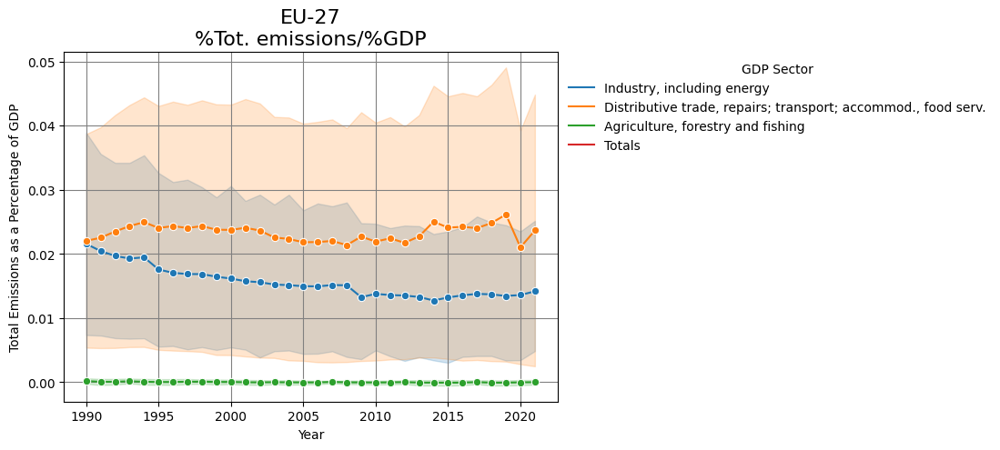

In [ ]:
ita_eu27_emi_reset = ita_eu27_emi_2.loc["Italy"].reset_index()


plt.figure(figsize=(7, 5))
sns.lineplot(x='Year', y= 'tot_emiss_%/gdp_%', hue = 'gdp_sector', data = ita_eu27_emi_reset, marker='o')


# plt.ylim(-0.001, 0.001)
plt.title('EU-27' + '\n' + '%Tot. emissions/%GDP', fontsize = 16)
plt.xlabel('Year')
plt.ylabel('Total Emissions as a Percentage of GDP')
plt.legend(title='GDP Sector', loc='upper left', bbox_to_anchor=(1, 1), frameon = False)
plt.grid(True, color = 'grey')
plt.savefig('EU_ita_eu27_emi_plot.svg', format='svg', facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')

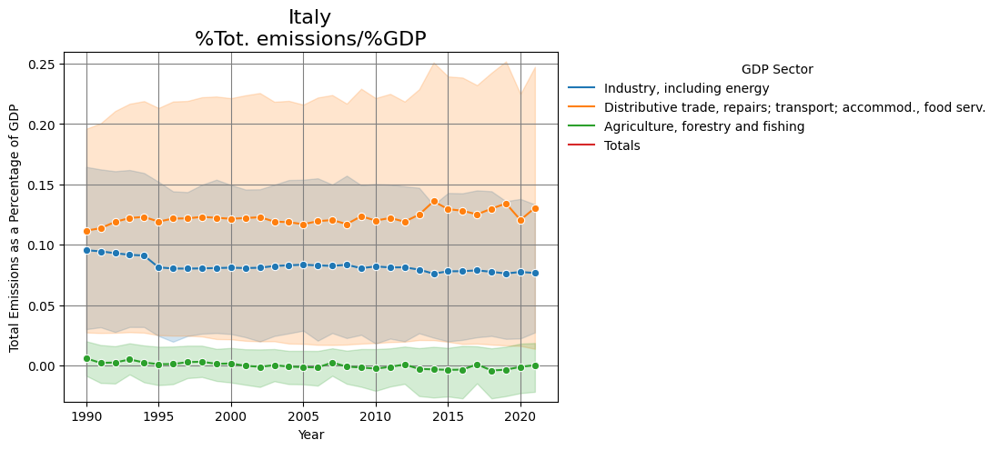

In [ ]:
ita_eu27_emi_reset = ita_eu27_emi_2.loc["Italy"].reset_index()


plt.figure(figsize=(7, 5))
sns.lineplot(x='Year', y= 'tot_emiss_%', hue = 'gdp_sector', data = ita_eu27_emi_reset, marker='o')


plt.ylim(-0.03, 0.26)
plt.title('Italy' + '\n' + '%Tot. emissions/%GDP', fontsize = 16)
plt.xlabel('Year')
plt.ylabel('Total Emissions as a Percentage of GDP')
plt.legend(title='GDP Sector', loc='upper left', bbox_to_anchor=(1, 1), frameon = False)
plt.grid(True, color = "grey")
plt.savefig('ITA_ita_eu27_emi_plot.svg', format='svg', facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')

Here we plot the evolution of *net_emiss_%* and *gdp_%* for Italy and EU-27

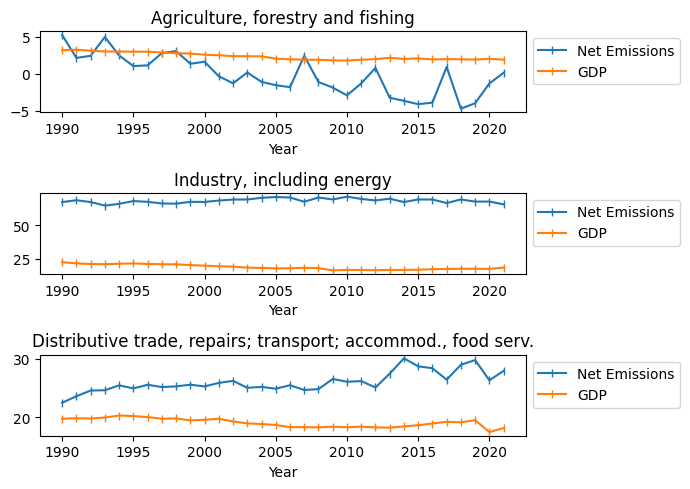

In [ ]:
# Italy
sub_selection = ita_eu27_emi_2.loc["Italy"][["gdp_sector",'net_emiss_%',"gdp_%"]].reset_index().set_index(["gdp_sector","Year"])
# sub_selection

fig, axes = plt.subplots(3,1)
axes = axes.flatten()
for i,sector in enumerate(["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.']):
    ax = axes[i]
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : (group["net_emiss_%"].sum())*100).loc[sector].plot(ax = ax, label = "Net Emissions",marker='|')
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : group["gdp_%"].min()).loc[sector].plot(ax = ax, label = "GDP",marker='|')

    ax.set_title(sector)
    ax.legend(bbox_to_anchor=(1,1))
plt.tight_layout()
plt.rc('figure', figsize=(7,5))
plt.show()

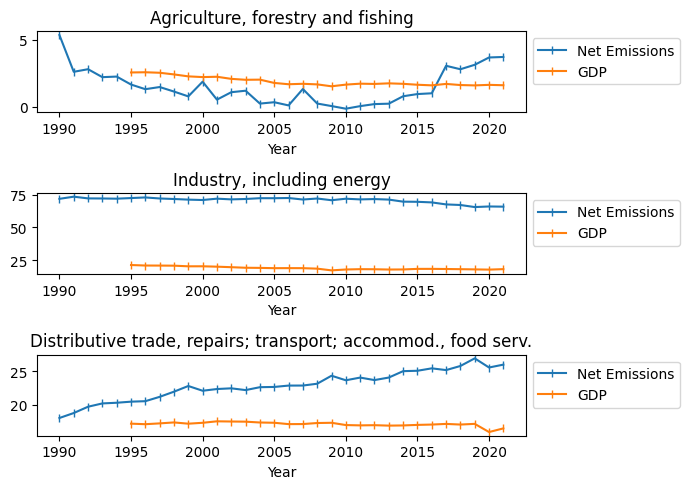

In [ ]:
# EU-27
sub_selection = ita_eu27_emi_2.loc["EU-27"][["gdp_sector",'net_emiss_%',"gdp_%"]].reset_index().set_index(["gdp_sector","Year"])

fig, axes = plt.subplots(3,1)
axes = axes.flatten()
for i,sector in enumerate(["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.']):
    ax = axes[i]
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : (group["net_emiss_%"].sum())*100).loc[sector].plot(ax = ax, label = "Net Emissions",marker='|')
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : group["gdp_%"].min()).loc[sector].plot(ax = ax, label = "GDP",marker='|')

    ax.set_title(sector)
    ax.legend(bbox_to_anchor= (1,1))
plt.tight_layout()
plt.rc('figure', figsize=(7, 5))
plt.show()

## III.IV GDP Over Emissions: an Inverse Overview of Data

We want now to focus our attention on how much GDP in Euro is produced by a ton of emissions.

In [ ]:
# creating a new DataFrame
gdp_values = df_OECD_aeuro.loc[["Italy","EU-27"]][["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.',"Gross domestic product"]].stack()
gdp_values = gdp_values.reset_index()
gdp_values = gdp_values[gdp_values.Year < 2022]

thing_to_concat = gdp_values[gdp_values.Sectors == "Gross domestic product"].copy()
thing_to_concat.Sectors = "Total emissions (UNFCCC)"

gdp_values = pd.concat([gdp_values, thing_to_concat])
gdp_values.loc[gdp_values.Sectors == "Gross domestic product","Sectors"] = "Total net emissions (UNFCCC)"
gdp_values.rename(columns = {"Sectors": "gdp_sector"},inplace = True)
gdp_values.set_index(["Country","gdp_sector","Year"],inplace = True)
gdp_values.rename(columns = {0: "gdp"},inplace = True)

emissions_values = ita_eu27_emi_2[["emissions","gdp_sector"]].copy().reset_index()
emi_no_totals = emissions_values[emissions_values.gdp_sector.isin(["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.'])]
emi_no_totals = emi_no_totals[emi_no_totals.Year > 2001]
emi_no_totals = emi_no_totals.groupby(["Country","Year","gdp_sector"]).emissions.sum()
emi_no_totals = emi_no_totals.reset_index()

emi_only_totals = emissions_values[~emissions_values.gdp_sector.isin(["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.'])]
emi_only_totals = emi_only_totals[emi_only_totals.Year > 2001]
emi_only_totals.drop(columns ="gdp_sector",inplace = True)
emi_only_totals.rename(columns = {"Sector_name": "gdp_sector"},inplace = True)
emi_only_totals
emissions_values = pd.concat([emi_no_totals, emi_only_totals])
emissions_values.set_index(["Country","gdp_sector","Year"],inplace = True)

gdp_ghg_absvals = pd.merge(emissions_values.emissions, gdp_values["gdp"] ,left_index = True, right_index = True)

# now I calculate the ratio between gdp in euros and emissions in tons
gdp_ghg_absvals["gdp_over_emissions"] = (gdp_ghg_absvals.gdp*1000000)/(gdp_ghg_absvals.emissions*1000)
gdp_ghg_absvals.loc["Italy"].loc["Total net emissions (UNFCCC)"]

,emissions,gdp,gdp_over_emissions
Year,,,
2002,531633.10430,1350258.9,2539.832243
2003,559110.08083,1394693.2,2494.487665
2004,558433.10964,1452319.0,2600.703603
2005,558639.98782,1493635.3,2673.699221
2006,547687.59777,1552686.8,2834.986234
2007,565389.22893,1614839.8,2856.155932
2008,534327.06337,1637699.4,3064.975578
2009,476313.98618,1577255.9,3311.378515
2010,481781.11389,1611279.4,3344.422090


In [ ]:
country = "Italy"
gdp_sector = "Total net emissions (UNFCCC)"
gdp_ghg_absvals.loc[(country,gdp_sector)].gdp_over_emissions.pow(-1)

<ipython-input-96-0ab927af3b01>:3: PerformanceWarning:

indexing past lexsort depth may impact performance.



Year
2002    0.000394
2003    0.000401
2004    0.000385
2005    0.000374
2006    0.000353
2007    0.000350
2008    0.000326
2009    0.000302
2010    0.000299
2011    0.000289
2012    0.000288
2013    0.000257
2014    0.000242
2015    0.000243
2016    0.000236
2017    0.000238
2018    0.000219
2019    0.000212
2020    0.000212
2021    0.000214
Name: gdp_over_emissions, dtype: float64

In [ ]:
gdp_ghg_absvals.index.get_level_values("gdp_sector").value_counts()
#the dataframe has years from 2002 to 2021, for two countries: Ita and EU-27, for 5 sectors: the 3 gdp sectors plus net emissions and total emiss

Agriculture, forestry and fishing                                40
Distributive trade, repairs; transport; accommod., food serv.    40
Industry, including energy                                       40
Total emissions (UNFCCC)                                         40
Total net emissions (UNFCCC)                                     40
Name: gdp_sector, dtype: int64

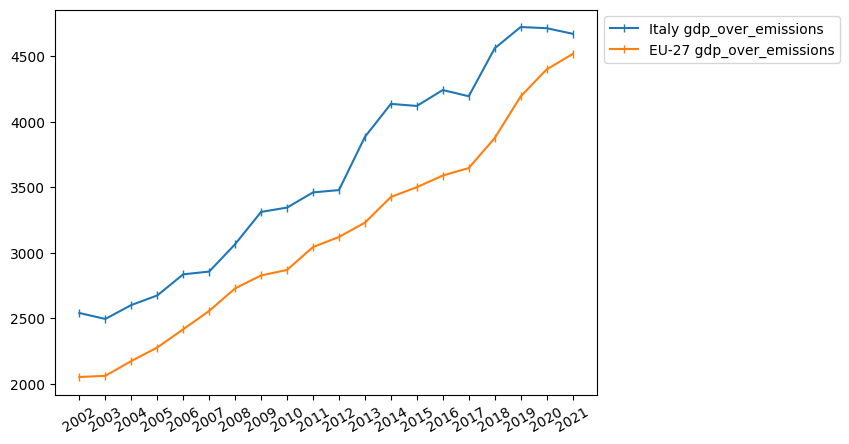

In [ ]:
#plotting the evolution
plt.plot(gdp_ghg_absvals.loc["Italy"].loc["Total net emissions (UNFCCC)"]['gdp_over_emissions'], label = 'Italy gdp_over_emissions', marker = '|')
plt.plot(gdp_ghg_absvals.loc["EU-27"].loc["Total net emissions (UNFCCC)"]['gdp_over_emissions'], label = 'EU-27 gdp_over_emissions', marker = '|')
plt.legend(bbox_to_anchor = (1,1))
plt.xticks(range(2002, 2022), rotation=30)
plt.show()

In [ ]:
# adding variation columns
gdp_ghg_absvals['emissions_var']= gdp_ghg_absvals.groupby(['Country',  'gdp_sector'])['emissions'].pct_change()
gdp_ghg_absvals['gdp_var'] = gdp_ghg_absvals.groupby(['Country',  'gdp_sector'])['gdp'].pct_change()
gdp_ghg_absvals

emissions  \
Country gdp_sector                                         Year                 
EU-27   Agriculture, forestry and fishing                  2002  4.503798e+04   
        Distributive trade, repairs; transport; accommo... 2002  9.358913e+05   
        Industry, including energy                         2002  2.976846e+06   
        Agriculture, forestry and fishing                  2003  5.078995e+04   
        Distributive trade, repairs; transport; accommo... 2003  9.454558e+05   
...                                                                       ...   
Italy   Total net emissions (UNFCCC)                       2017  4.140434e+05   
                                                           2018  3.884603e+05   
                                                           2019  3.804392e+05   
                                                           2020  3.524252e+05   
                                                           2021  3.901183e+05   

                                                                         gdp  \
Country gdp_sector                                         Year                
EU-27   Agriculture, forestry and fishing                  2002   177354.529   
        Distributive trade, repairs; transport; accommo... 2002  1497124.067   
        Industry, including energy                         2002  1668550.504   
        Agriculture, forestry and fishing                  2003   176102.491   
        Distributive trade, repairs; transport; accommo... 2003  1535268.612   
...                                                                      ...   
Italy   Total net emissions (UNFCCC)                       2017  1736592.800   
                                                           2018  1771391.200   
                                                           2019  1796648.500   
                                                           2020  1661239.800   
                                                           2021  1822344.500   

                                                                 gdp_over_emissions  \
Country gdp_sector                                         Year                       
EU-27   Agriculture, forestry and fishing                  2002         3937.887745   
        Distributive trade, repairs; transport; accommo... 2002         1599.677287   
        Industry, including energy                         2002          560.509505   
        Agriculture, forestry and fishing                  2003         3467.270636   
        Distributive trade, repairs; transport; accommo... 2003         1623.839649   
...                                                                             ...   
Italy   Total net emissions (UNFCCC)                       2017         4194.228809   
                                                           2018         4560.032038   
                                                           2019         4722.564607   
                                                           2020         4713.737876   
                                                           2021         4671.261554   

                                                                 emissions_var  \
Country gdp_sector                                         Year                  
EU-27   Agriculture, forestry and fishing                  2002            NaN   
        Distributive trade, repairs; transport; accommo... 2002            NaN   
        Industry, including energy                         2002            NaN   
        Agriculture, forestry and fishing                  2003       0.127714   
        Distributive trade, repairs; transport; accommo... 2003       0.010220   
...                                                                        ...   
Italy   Total net emissions (UNFCCC)                       2017       0.035623   
                                                           2018      -0.061789   
                     

In [ ]:
# computing correlations
correlation_by_sector = pd.DataFrame(gdp_ghg_absvals.groupby(['Country', 'gdp_sector']).corr().unstack()['emissions_var']['gdp_var'])
correlation_by_sector['gdp_emi_corr'] = correlation_by_sector['gdp_var']
del correlation_by_sector['gdp_var']
correlation_by_sector

gdp_emi_corr
Country gdp_sector                                                      
EU-27   Agriculture, forestry and fishing                       0.138122
        Distributive trade, repairs; transport; accommo...      0.923520
        Industry, including energy                              0.773890
        Total emissions (UNFCCC)                                0.816252
        Total net emissions (UNFCCC)                            0.811233
Italy   Agriculture, forestry and fishing                      -0.410376
        Distributive trade, repairs; transport; accommo...      0.902344
        Industry, including energy                              0.696729
        Total emissions (UNFCCC)                                0.870134
        Total net emissions (UNFCCC)                            0.767843

# IV° Chapter

On the aforementioned data, we want now to do a Linear Regression Analysis.



## IV.I. Linear Regression



In [ ]:
X = DataFrame(emissions_gdp_var.loc['Total emissions (UNFCCC)'].per_capita_GDP_var)
y = DataFrame(emissions_gdp_var.loc['Total emissions (UNFCCC)'].per_capita_emiss_variation)

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

model = LinearRegression()
model.fit(X, y)

y_prediction = model.predict(X)
mse = metrics.mean_squared_error(y, y_prediction)
r2 = metrics.r2_score(y, y_prediction)

r2
# mse

0.12055643184477938

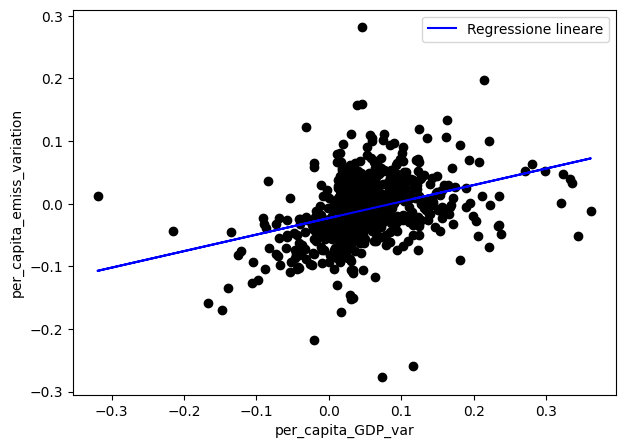

regr.coef:  [[0.2637]]
regr.intercept:  [-0.0231]
r2:  0.12055643184477938
mse:  0.0022717314443213613


In [ ]:
plt.scatter(X, y, color = 'black')
plt.plot(X, y_prediction, color='blue', label='Regressione lineare')
plt.xlabel('per_capita_GDP_var')
plt.ylabel('per_capita_emiss_variation')
plt.legend()
plt.show()

print('regr.coef: ' , model.coef_)
print('regr.intercept: ' , model.intercept_)
print('r2: ', r2)
print('mse: ', mse)

Testing the null hypothesis that the coefficient is equal to 0:

$\hat{SE}(β_1)^2 = \frac{\hat{σ}^2}{\sum^n_{x_i}(x_i -\overline{x})^2}$

where $\hat{σ}^2 = RSS/(n − 2)$


$t = \frac{\hat β_1 - 0}{SE(\hat β_1)}$

In [ ]:
# numerator
num = np.sum((y-model.predict(X))**2)[0]/(y.size-2)
# denominator
den = np.sum((np.asarray(X)-X.mean()[0])**2)
se_coef = np.sqrt(num/den)

t_test = model.coef_[0]/se_coef
t_test[0]

9.97607061473568

The T-test value is high, that means that the p-value is low.
For this reason, we can reject the null hypothesis. The slope of the line is not 0

r2 =  0.0010111141371094146  
 mse =  0.12396520871902525


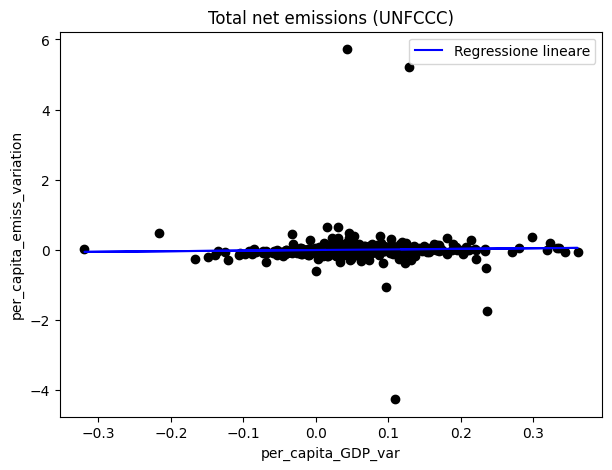

regr.coef:  [[0.1674]]
regr.intercept:  [-0.0091]
r2:  0.0010111141371094146
mse:  0.12396520871902525


In [ ]:
# Same regression but different sector: now total net instead of total emissions

X = DataFrame(emissions_gdp_var.loc['Total net emissions (UNFCCC)'].per_capita_GDP_var)
y = DataFrame(emissions_gdp_var.loc['Total net emissions (UNFCCC)'].per_capita_emiss_variation)

model = LinearRegression()
model.fit(X, y)

y_prediction = model.predict(X)
mse = metrics.mean_squared_error(y, y_prediction)
r2 = metrics.r2_score(y, y_prediction)

print("r2 = ", r2, " \n mse = ", mse)


plt.scatter(X, y, color = 'black')
plt.plot(X, y_prediction, color='blue', label='Regressione lineare')
plt.xlabel('per_capita_GDP_var')
plt.ylabel('per_capita_emiss_variation')
plt.legend()
plt.title('Total net emissions (UNFCCC)')
plt.show()

print('regr.coef: ' , model.coef_)
print('regr.intercept: ' , model.intercept_)
print('r2: ', r2)
print('mse: ', mse)


## IV.II. Classification
Can we predict if, in a given year, per capita emissions of all GHG will decrease (positive result) or increase (negative result)?

We will make a binary classifier using logistic regression.
The Y variable we are modeling is defined as:

𝗬 = 𝑰(Δ per capita emissions ≤ 0)



In [ ]:
# Binary classifier
y = np.array(emissions_gdp_var.loc['Total emissions (UNFCCC)'].per_capita_emiss_variation <= 0)
X = emissions_gdp_var.loc['Total emissions (UNFCCC)'][["per_capita_GDP_var","per_capita_GDP"]]

logreg= LogisticRegression()
logreg.fit(X, y)

y_prediction = logreg.predict(X)

print('Accuracy: ',metrics.accuracy_score(y, y_prediction))
print('Recall: ',metrics.recall_score(y, y_prediction, zero_division=1))
print('Precision: ' ,metrics.precision_score(y, y_prediction, zero_division=1))
print('CL Report \n',metrics.classification_report(y, y_prediction, zero_division=1))

Accuracy:  0.5947802197802198
Recall:  0.9460093896713615
Precision:  0.597037037037037
CL Report 
               precision    recall  f1-score   support

       False       0.57      0.10      0.17       302
        True       0.60      0.95      0.73       426

    accuracy                           0.59       728
   macro avg       0.58      0.52      0.45       728
weighted avg       0.58      0.59      0.50       728



In [ ]:
y.sum()/y.size

0.5851648351648352

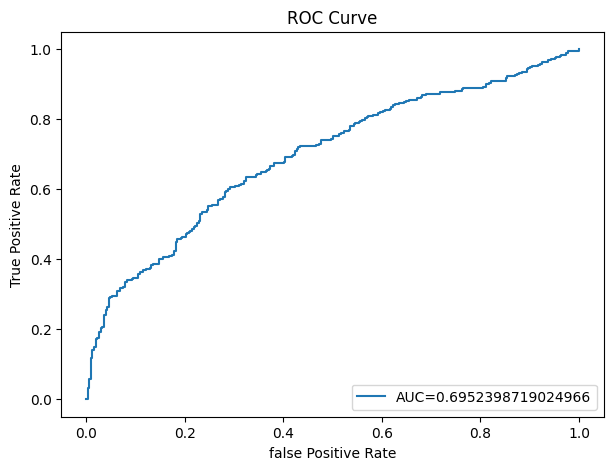

In [ ]:
y_pred_proba= logreg.predict_proba(X) [::,1]
false_positive_rate, true_positive_rate, *rest  = metrics.roc_curve(y, y_pred_proba)
auc= metrics.roc_auc_score(y, y_pred_proba)
plt.plot(false_positive_rate, true_positive_rate,label="AUC="+str(auc))
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('false Positive Rate')
plt.legend(loc=4)

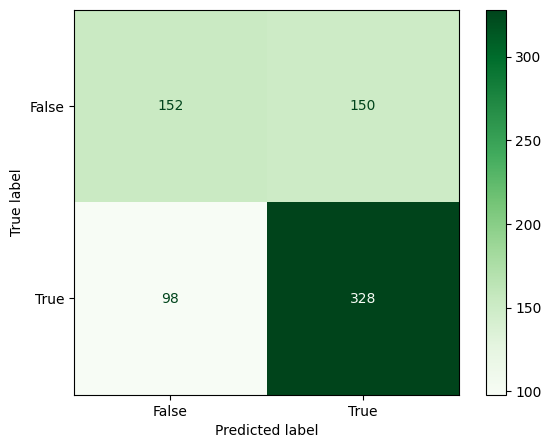

In [ ]:
clf = SVC()
clf.fit(X, y)
predictions = clf.predict(X)
cm = confusion_matrix(y, predictions, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
disp.plot(cmap=plt.cm.Greens)
plt.savefig("ConfusMatrx.svg", facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')
plt.show()

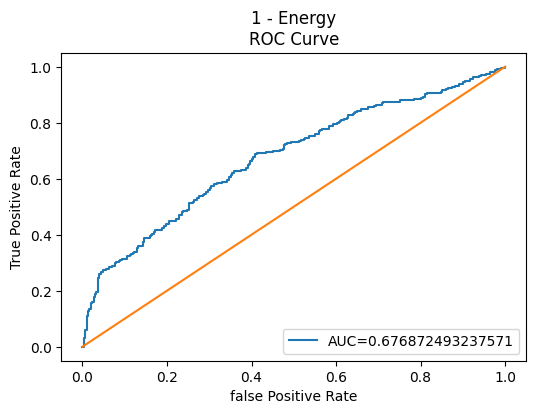

1 - Energy  	The proportion of positives is  0.5851648351648352
1 - Energy  	The precision score is 0.5944363103953147
1 - Energy  	The accuracy score is 0.592032967032967
----------------------------------------------------------------------------------------------------


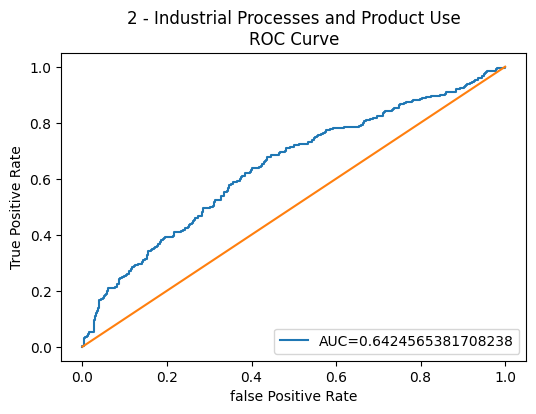

2 - Industrial Processes and Product Use  	The proportion of positives is  0.4807692307692308
2 - Industrial Processes and Product Use  	The precision score is 0.6306306306306306
2 - Industrial Processes and Product Use  	The accuracy score is 0.5989010989010989
----------------------------------------------------------------------------------------------------


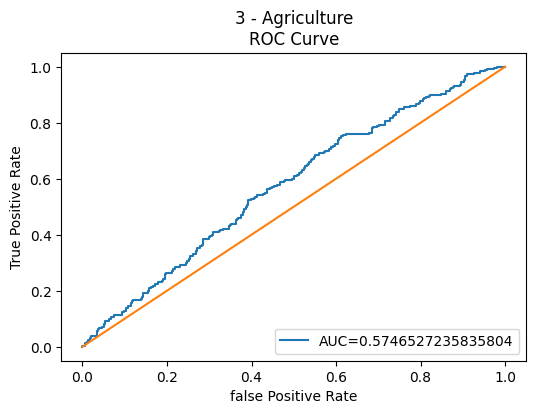

3 - Agriculture  	The proportion of positives is  0.5906593406593407
3 - Agriculture  	The precision score is 0.5952712100139083
3 - Agriculture  	The accuracy score is 0.5975274725274725
----------------------------------------------------------------------------------------------------


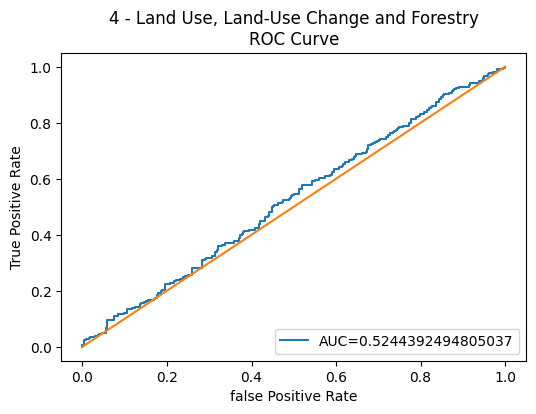

4 - Land Use, Land-Use Change and Forestry  	The proportion of positives is  0.554945054945055
4 - Land Use, Land-Use Change and Forestry  	The precision score is 0.5544827586206896
4 - Land Use, Land-Use Change and Forestry  	The accuracy score is 0.5535714285714286
----------------------------------------------------------------------------------------------------


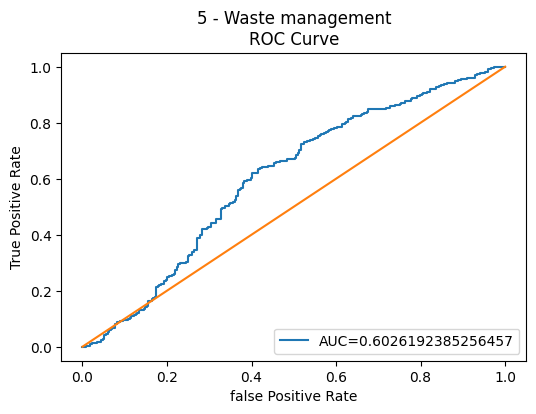

5 - Waste management  	The proportion of positives is  0.6304945054945055
5 - Waste management  	The precision score is 0.6308539944903582
5 - Waste management  	The accuracy score is 0.6304945054945055
----------------------------------------------------------------------------------------------------


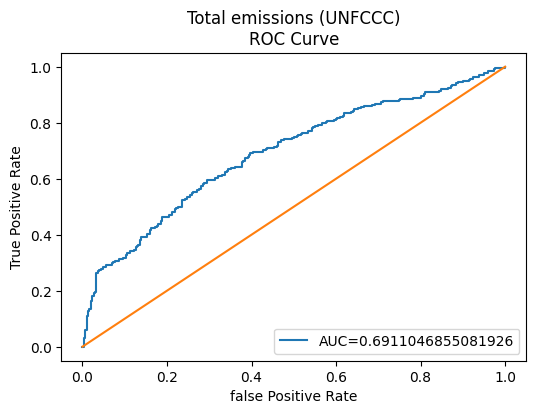

Total emissions (UNFCCC)  	The proportion of positives is  0.5851648351648352
Total emissions (UNFCCC)  	The precision score is 0.5976331360946746
Total emissions (UNFCCC)  	The accuracy score is 0.5961538461538461
----------------------------------------------------------------------------------------------------


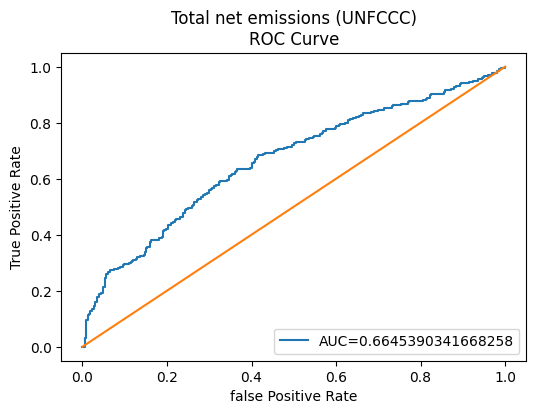

Total net emissions (UNFCCC)  	The proportion of positives is  0.5535714285714286
Total net emissions (UNFCCC)  	The precision score is 0.5681114551083591
Total net emissions (UNFCCC)  	The accuracy score is 0.5673076923076923
----------------------------------------------------------------------------------------------------


In [ ]:
# This is a binary classifier that has per capita emissions variation as response variable y and per capita gdp variation as the only X

plt.rc('figure', figsize=(6, 4))

for sector in emissions_gdp_var.index.get_level_values("Sector_name").unique():
    X = emissions_gdp_var.loc[sector][["per_capita_GDP_var"]]
    y = np.asarray(emissions_gdp_var.loc[sector].per_capita_emiss_variation<=0)
    # A positive value means that percapita emissions decreased from the previous year

    model = LogisticRegression()
    model.fit(X,y)
    y_pred_proba= model.predict_proba(X) [::,1]
    false_positive_rate, true_positive_rate, other_values  = metrics.roc_curve(y, y_pred_proba)
    auc= metrics.roc_auc_score(y, y_pred_proba)

    plt.plot(false_positive_rate, true_positive_rate, label="AUC="+str(auc))
    plt.title(sector + "\n" +'ROC Curve')
    plt.ylabel('True Positive Rate')
    plt.xlabel('false Positive Rate')
    plt.legend(loc=4)
    plt.plot([0,1],[0,1])
    plt.show()
    print(sector," \tThe proportion of positives is ",y.sum()/y.size)
    print(sector," \tThe precision score is",metrics.precision_score(y,model.predict(X),zero_division = 1))
    print(sector," \tThe accuracy score is", metrics.accuracy_score(y,model.predict(X)))
    print("-"*100)

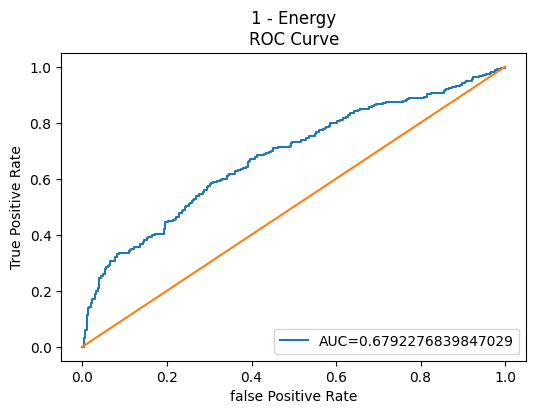

1 - Energy  	The proportion of positives is  0.5851648351648352
1 - Energy  	The precision score is 0.5929721815519766
1 - Energy  	The accuracy score is 0.5892857142857143
----------------------------------------------------------------------------------------------------


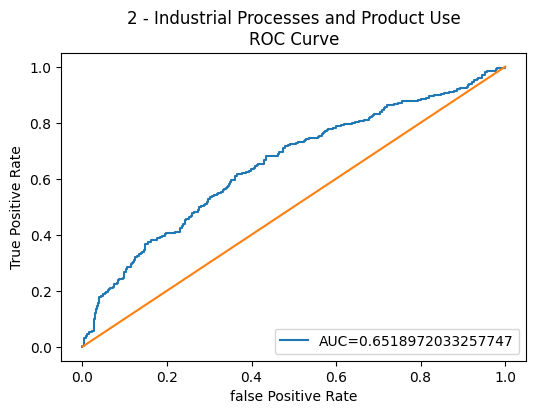

2 - Industrial Processes and Product Use  	The proportion of positives is  0.4807692307692308
2 - Industrial Processes and Product Use  	The precision score is 0.6290322580645161
2 - Industrial Processes and Product Use  	The accuracy score is 0.6071428571428571
----------------------------------------------------------------------------------------------------


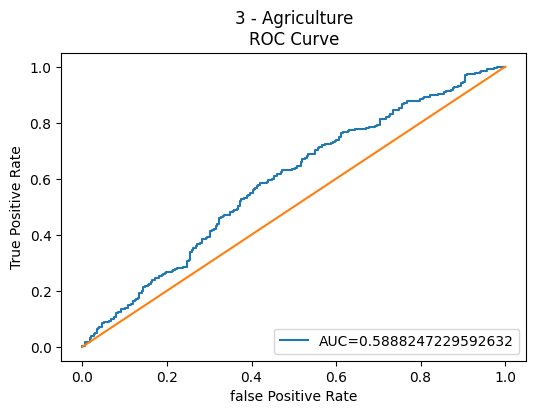

3 - Agriculture  	The proportion of positives is  0.5906593406593407
3 - Agriculture  	The precision score is 0.5952712100139083
3 - Agriculture  	The accuracy score is 0.5975274725274725
----------------------------------------------------------------------------------------------------


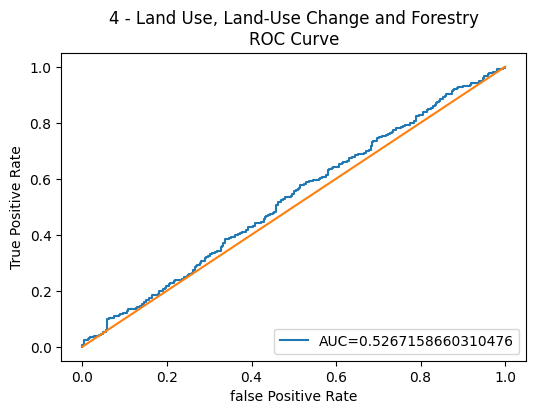

4 - Land Use, Land-Use Change and Forestry  	The proportion of positives is  0.554945054945055
4 - Land Use, Land-Use Change and Forestry  	The precision score is 0.5537190082644629
4 - Land Use, Land-Use Change and Forestry  	The accuracy score is 0.5521978021978022
----------------------------------------------------------------------------------------------------


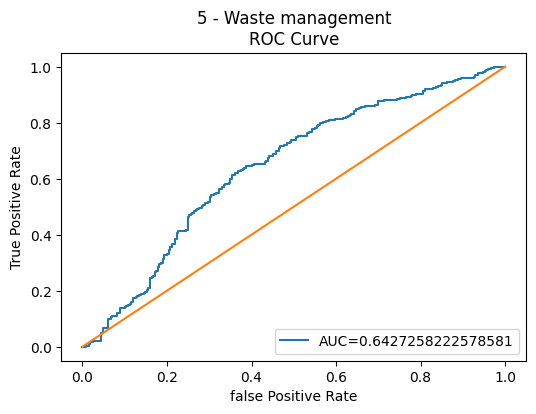

5 - Waste management  	The proportion of positives is  0.6304945054945055
5 - Waste management  	The precision score is 0.6317241379310344
5 - Waste management  	The accuracy score is 0.6318681318681318
----------------------------------------------------------------------------------------------------


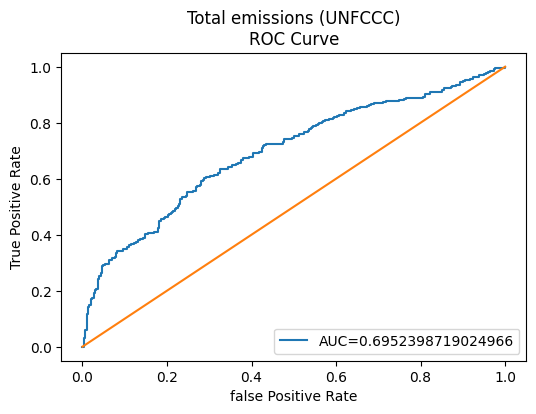

Total emissions (UNFCCC)  	The proportion of positives is  0.5851648351648352
Total emissions (UNFCCC)  	The precision score is 0.597037037037037
Total emissions (UNFCCC)  	The accuracy score is 0.5947802197802198
----------------------------------------------------------------------------------------------------


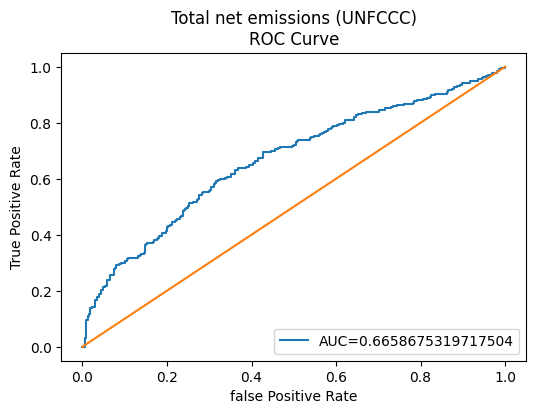

Total net emissions (UNFCCC)  	The proportion of positives is  0.5535714285714286
Total net emissions (UNFCCC)  	The precision score is 0.5660964230171073
Total net emissions (UNFCCC)  	The accuracy score is 0.5631868131868132
----------------------------------------------------------------------------------------------------


In [ ]:
#Same as above but we use two X variables: we add per_capita_gdp

plt.rc('figure', figsize=(6, 4))

for sector in emissions_gdp_var.index.get_level_values("Sector_name").unique():
    X = emissions_gdp_var.loc[sector][["per_capita_GDP_var","per_capita_GDP"]]
    y = np.asarray(emissions_gdp_var.loc[sector].per_capita_emiss_variation<=0)
    # A positive value means that percapita emissions decreased from the previous year

    model = LogisticRegression()
    model.fit(X,y)
    y_pred_proba= model.predict_proba(X) [::,1]
    false_positive_rate, true_positive_rate, other_values  = metrics.roc_curve(y, y_pred_proba)
    auc= metrics.roc_auc_score(y, y_pred_proba)

    plt.plot(false_positive_rate, true_positive_rate, label="AUC="+str(auc))
    plt.title(sector + "\n" +'ROC Curve')
    plt.ylabel('True Positive Rate')
    plt.xlabel('false Positive Rate')
    plt.legend(loc=4)
    plt.plot([0,1],[0,1])
    plt.show()
    print(sector," \tThe proportion of positives is ",y.sum()/y.size)
    print(sector," \tThe precision score is",metrics.precision_score(y,model.predict(X),zero_division = 1))
    print(sector," \tThe accuracy score is", metrics.accuracy_score(y,model.predict(X)))
    print("-"*100)

adding per capita gdp to the X matrix doesn't improve the classifier


In [ ]:
df_emissions_multiindex.index.names

FrozenList(['Country', 'Pollutant_name', 'Sector_name', 'Year'])

# Graphs we added to the presentation

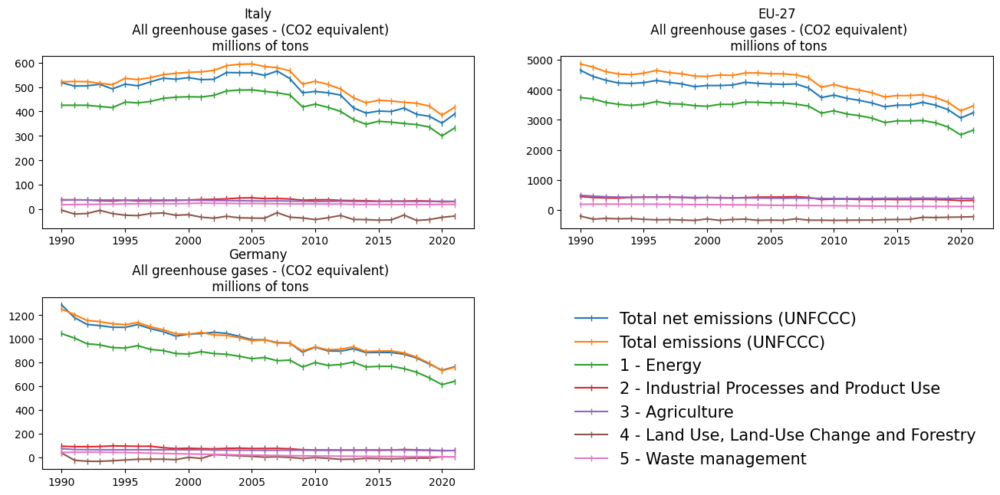

In [ ]:
countries = ["Italy", "EU-27","Germany"]
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (16,7))
fig = plt.figure()
axes = [fig.add_subplot(2, 2, i) for i in range(1,4)]
fig.subplots_adjust(hspace=.4)
for i,country in enumerate(countries):
    for sector in chosen_sectors:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            axes[i].plot(df_to_plot.emissions/1000, label = sector, marker = "|")
        except KeyError:
            print(country, pollutant, sector ," was not found")
    axes[i].set_title(country +"\n "+ pollutant + "\n millions of tons")
plt.legend(bbox_to_anchor=(1.2,1),fontsize = 15, frameon=False)
plt.show()
fig.savefig("allghg_countries_sector.svg", facecolor = (1,1,1,0), transparent = True)

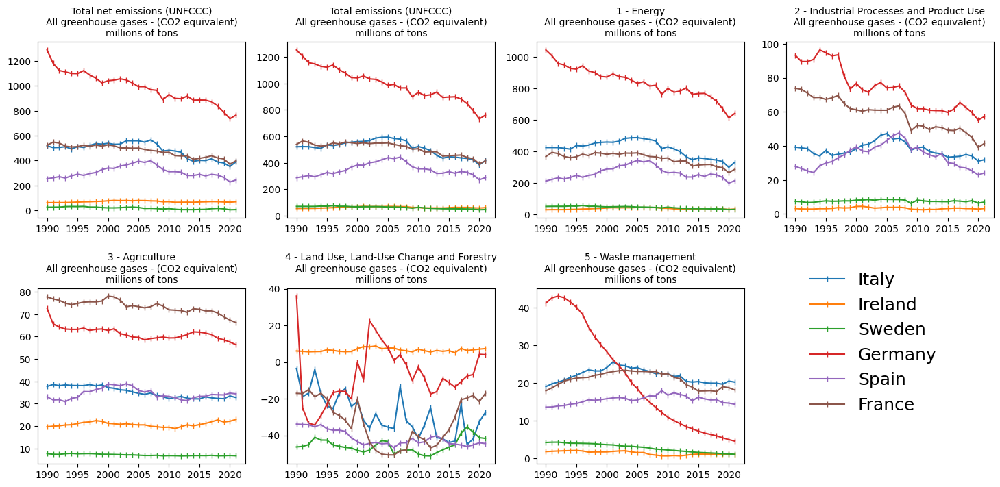

In [ ]:
countries = ['Italy', 'Ireland', 'Sweden', 'Germany', "Spain","France"]
chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']
pollutant = "All greenhouse gases - (CO2 equivalent)" # I'm not yet looking at other Greenhouse Gases

def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (18,8))

fig = plt.figure()
axes = [fig.add_subplot(2, 4, i) for i in range(1,8)]
fig.subplots_adjust(hspace=.4)


for i,sector in enumerate(chosen_sectors):
    for country in countries:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            axes[i].plot(df_to_plot.emissions/1000,label = country, marker = "|")
        except KeyError:
            print(country, pollutant, sector, "gave a key error")
        axes[i].set_title(sector + "\n" + pollutant + "\nmillions of tons",fontsize = 10)
plt.legend(loc= "lower right",bbox_to_anchor=(2, 0.2), fontsize = 18, frameon= False)
plt.show()
fig.savefig("allghg_sectors_countries_sidebyside.svg", facecolor = (1,1,1,0), transparent = True)

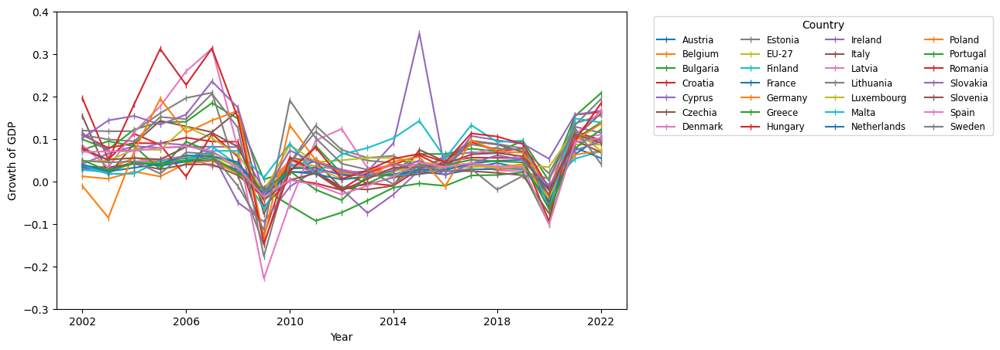

In [ ]:
# GDP variations over years
fig, ax = plt.subplots(1, figsize = (9.5,5))
for el in GDP_Var:
    plt.plot(GDP_Var[el], label=el, marker = '|')
    plt.legend(title='Country', bbox_to_anchor=(1.65, 1), ncol = 4, fontsize = "small")
    plt.xlabel('Year')
    plt.ylabel('Growth of GDP')
    plt.ylim(-0.3, 0.4)
    x_lab = GDP_Var.index
    ticks = ax.set_xticks(x_lab)
plt.xticks(range(2002, 2023, 4))
plt.show()
fig.savefig("GDP_Var.svg", facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')

In [ ]:
# Choroplet map
mask = df_Eurostat['TIME_PERIOD'].isin(range(2002,2023))
df_to_plot = df_Eurostat[mask]

fig = px.choropleth(df_to_plot.sort_values('TIME_PERIOD'),
                    locations = "geo",
                    range_color = (0, 3000000),
                    color  ="OBS_VALUE",
                    color_continuous_scale = "Hot",
                    scope = "europe",
                    animation_frame = "TIME_PERIOD")

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.write_html('Eurostat_choro.html')
fig.show()

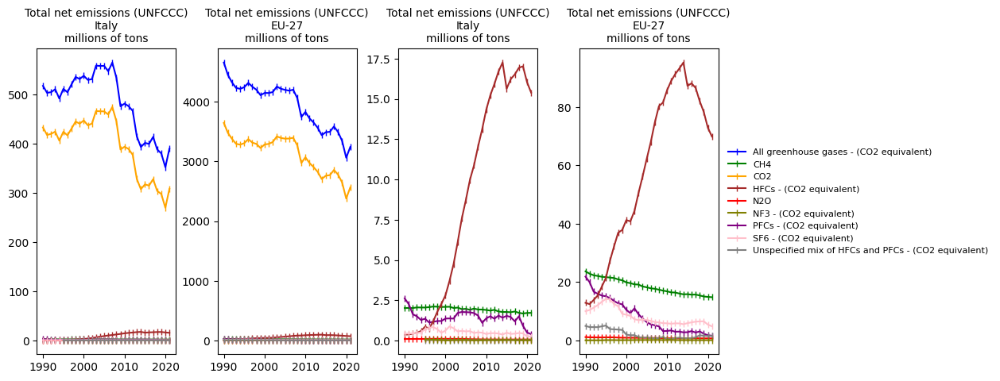

In [ ]:
# different pollutants= Co2 is the main one, the other ones have a really small impact on All GhG

chosen_countries = ["Italy","EU-27"]
sector = 'Total net emissions (UNFCCC)'
chosen_pollutants = ["CH4","N2O","PFCs - (CO2 equivalent)","HFCs - (CO2 equivalent)","SF6 - (CO2 equivalent)","Unspecified mix of HFCs and PFCs - (CO2 equivalent)","NF3 - (CO2 equivalent)","All greenhouse gases - (CO2 equivalent)","CO2"]
colors = {
    "All greenhouse gases - (CO2 equivalent)":"blue",
    "CH4":"green",
    "CO2":"orange",
    "N2O":"red",
    "PFCs - (CO2 equivalent)":"purple",
    "HFCs - (CO2 equivalent)":"brown",
    "SF6 - (CO2 equivalent)":"pink",
    "Unspecified mix of HFCs and PFCs - (CO2 equivalent)":"gray",
    "NF3 - (CO2 equivalent)":"olive"
}


def get_smaller_df(country, pollutant, sector):
    return df_emissions_multiindex.loc[country, pollutant, sector].copy()

plt.rc('figure', figsize = (14,5))

fig = plt.figure()
axes = [fig.add_subplot(1, 5, i) for i in range(1,5)]
fig.subplots_adjust(wspace=.3)

for i, country in enumerate(chosen_countries):
    for pollutant in sorted(chosen_pollutants):
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            axes[i].plot(df_to_plot.emissions/1000,label = pollutant, marker = '|',color = colors[pollutant])
        except KeyError:
            print(country, pollutant, sector, "gave a key error")
    axes[i].set_title(sector + "\n" + country + "\nmillions of tons", fontsize = 10)
axes[0].legend(loc="right",bbox_to_anchor=(6.9,0.5),fontsize = 8, frameon= False)


chosen_countries = ["Italy","EU-27"]
sector = 'Total net emissions (UNFCCC)'
chosen_pollutants = ["CH4","N2O","PFCs - (CO2 equivalent)","HFCs - (CO2 equivalent)","SF6 - (CO2 equivalent)","Unspecified mix of HFCs and PFCs - (CO2 equivalent)","NF3 - (CO2 equivalent)"]

for i, country in enumerate(chosen_countries):
    for j,pollutant in enumerate(chosen_pollutants):
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            axes[i+2].plot(df_to_plot.emissions/1000,label = pollutant, marker = '|',color = colors[pollutant])
        except KeyError:
            print(country, pollutant, sector, "gave a key error")
    axes[i+2].set_title(sector + "\n" + country + "\nmillions of tons",fontsize = 10)

plt.show()
fig.savefig("different_gases.svg", facecolor = (1,1,1,0), transparent = True, pad_inches= 4)

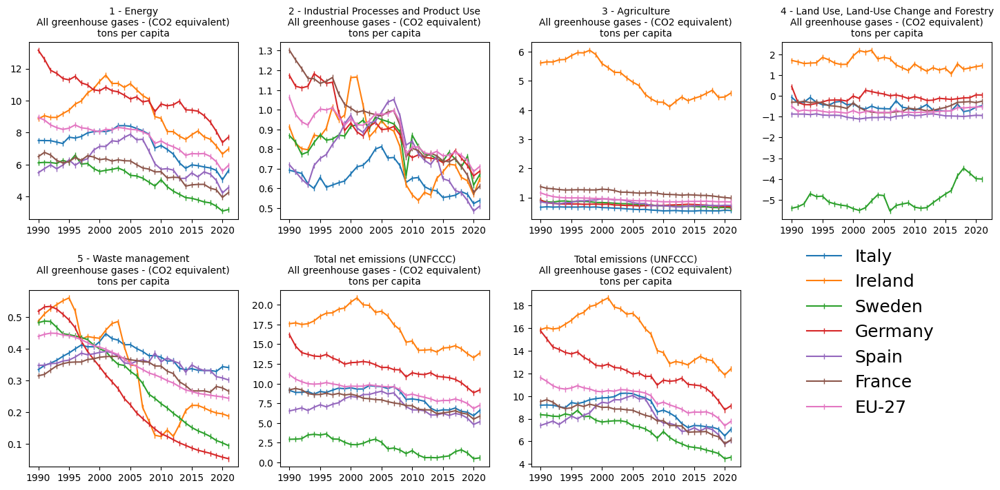

In [ ]:
# per capita plots


countries = ['Italy', 'Ireland', 'Sweden', 'Germany', "Spain","France","EU-27"]
pollutant = "All greenhouse gases - (CO2 equivalent)"
chosen_sectors = ['1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management','Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)',]


plt.rc('figure', figsize = (18,8))

fig = plt.figure()
axes = [fig.add_subplot(2, 4, i) for i in range(1,8)]
fig.subplots_adjust(hspace=.4)

for i,sector in enumerate(chosen_sectors):
    for country in countries:
        try:
            df_to_plot = get_smaller_df(country, pollutant, sector)
            axes[i].plot(df_to_plot.per_capita_emission*1000, label = country, marker = '|')
        except KeyError:
            print(country, pollutant, sector ," was not found")
        axes[i].set_title(sector + "\n"+  pollutant + "\ntons per capita",fontsize = 10)
plt.legend(loc= "lower right",bbox_to_anchor=(2, 0.2), fontsize = 18, frameon= False)

plt.show()
fig.savefig("percapita.svg", facecolor = (1,1,1,0), transparent = True)

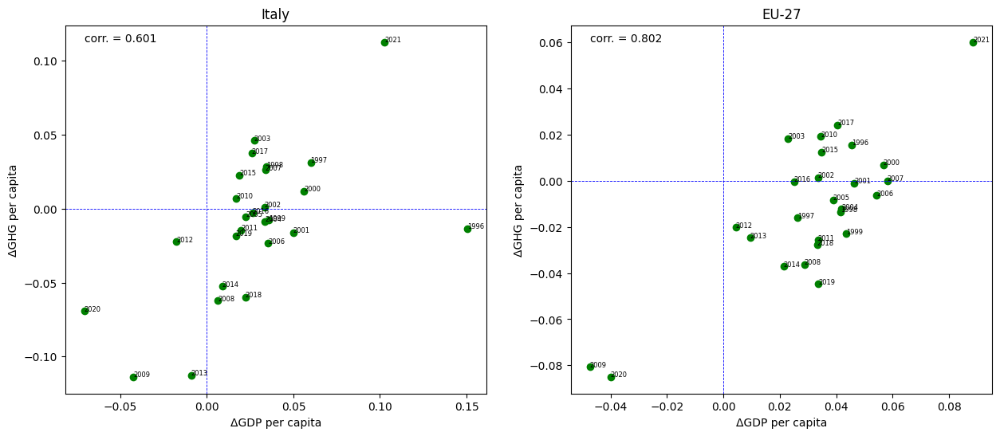

In [ ]:
countries = ["Italy", "EU-27"]
sector = "Total net emissions (UNFCCC)"

plt.rc('figure', figsize = (15,6))

fig = plt.figure()
axes = [fig.add_subplot(1, 2, i) for i in range(1,3)]
fig.subplots_adjust(wspace=.2)

for i, country in enumerate(countries):
    ax = axes[i]
    x = emissions_gdp_var.loc[sector].loc[country].per_capita_GDP_var
    y = emissions_gdp_var.loc[sector].loc[country].per_capita_emiss_variation
    ax.scatter(x,y,color = "green")
    ax.set_ylabel("ΔGHG per capita")
    ax.set_xlabel("ΔGDP per capita")
    ax.set_title(f"{country}")
    ax.axhline(y=0, color='blue', linestyle='--', linewidth = .6)
    ax.axvline(x=0, color='blue', linestyle='--', linewidth = .6)
    ax.text(x = x.min(), y = y.max(), s = f"corr. = {x.corr(y):.3f}", c = "black")
    for i, row in emissions_gdp_var.loc[sector].loc[country].iterrows():
        ax.text(row['per_capita_GDP_var'],row['per_capita_emiss_variation'], f'{i}', ha='left', fontsize = 6)
fig.savefig("scatter_gdp_ghg_variation.svg", facecolor = (1,1,1,0), transparent = True)

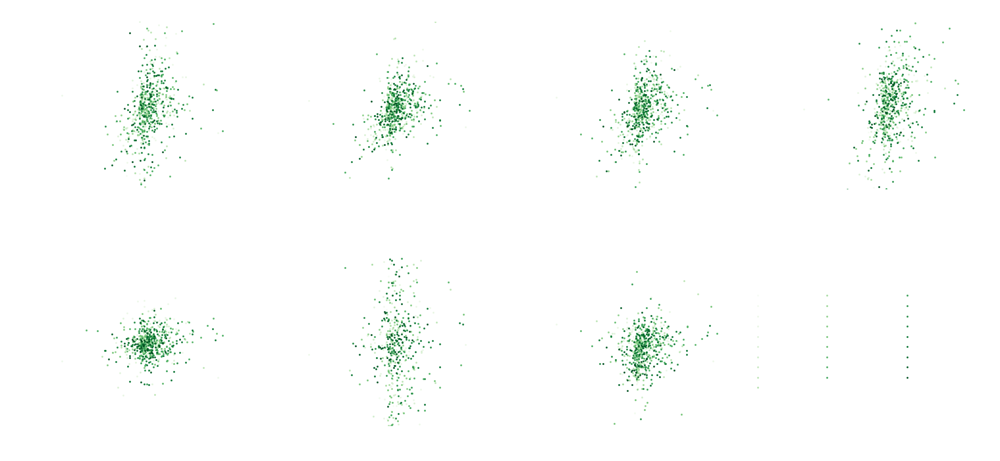

In [ ]:
# creating a scatterplot for each sector
countries = emissions_gdp_var.index.get_level_values('Country').unique()
colors = [plt.get_cmap("Greens")(i/28) for i in range(countries.size)]

chosen_sectors = ['Total net emissions (UNFCCC)', 'Total emissions (UNFCCC)','1 - Energy','2 - Industrial Processes and Product Use','3 - Agriculture','4 - Land Use, Land-Use Change and Forestry','5 - Waste management']
plt.rc('figure', figsize = (18,8))

fig = plt.figure()
axes = [fig.add_subplot(2, 4, i) for i in range(1,8)]
fig.subplots_adjust(wspace=.4,hspace = .4)

for i, sector in enumerate(chosen_sectors):
    ax = axes[i]
    ax.set_title(sector,color = "white")
    for j,country in enumerate(countries):
      country_data = emissions_gdp_var.loc[sector].loc[country]
      ax.scatter(x=country_data['per_capita_GDP_var'], y=country_data['per_capita_emiss_variation'], label=country, color= colors[j], s=1)

    ax.set_ylim(-0.2,0.2)
    ax.set_ylabel("ΔGHG per capita", color = "white")
    ax.set_xlabel("ΔGDP per capita",color = "white")
    ax.text(x = -0.3, y = 0.175, s = f"corr. = {sectors_corr[sector]:.2f}", c = "white")

    ax.spines['bottom'].set_color('white')
    ax.spines['top'].set_color('white')
    ax.spines['right'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')

legend = axes[6].legend(loc='right', bbox_to_anchor=(2.4, .5), ncol=3, fontsize=8,frameon = False)
for text in legend.get_texts():
    text.set_color("white")
plt.show()
fig.savefig("scatter_by_sectors.svg", facecolor = (1,1,1,0), transparent = True)

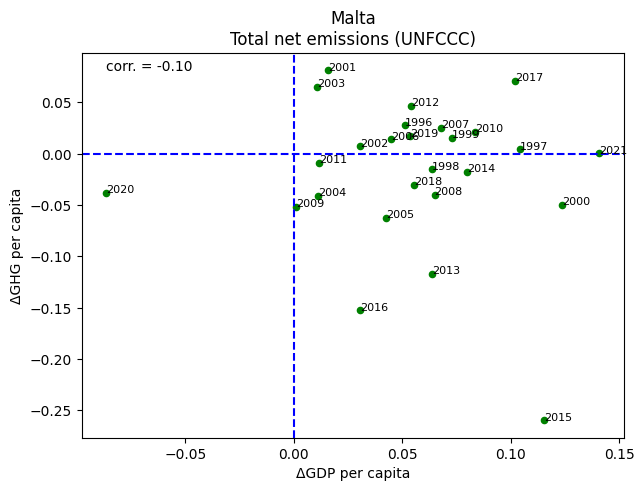

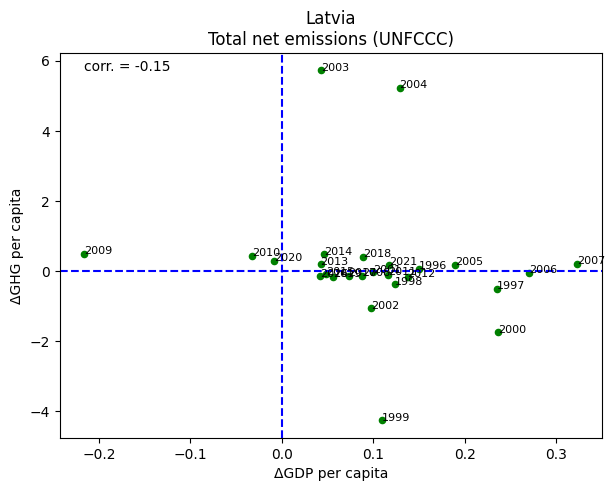

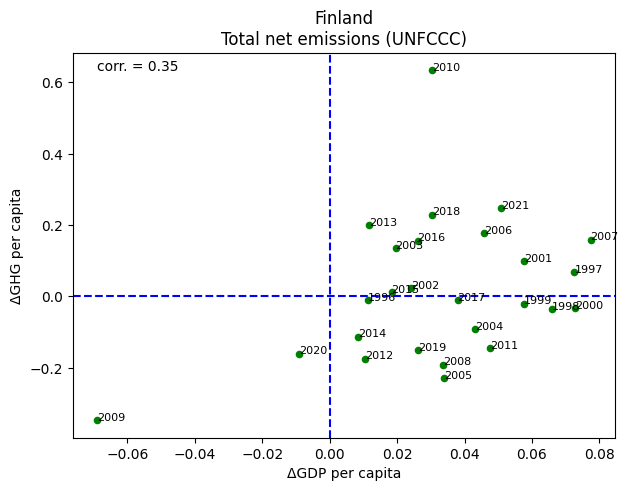

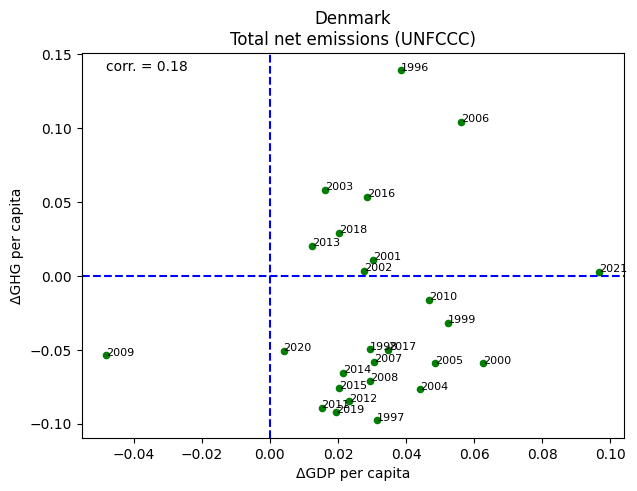

In [ ]:
#Net emissions of particular countryes
sector = "Total net emissions (UNFCCC)"
countries = ['Malta', 'Latvia', 'Finland', 'Denmark']

plt.rc('figure', figsize=(7, 5))
for country in countries:
    country_data = emissions_gdp_var.loc[sector].loc[country]
    country_data.plot.scatter(x = "per_capita_GDP_var", y = "per_capita_emiss_variation", title = country + "\n" + sector, c = 'green')
    plt.axhline(y=0, color='blue', linestyle='--')
    plt.axvline(x=0, color='blue', linestyle='--')
    plt.text(x = country_data["per_capita_GDP_var"].min(), y = country_data["per_capita_emiss_variation"].max(), s = f"corr. = {countries_net_corr[country]:.2f}", c = "black")
    plt.ylabel("ΔGHG per capita")
    plt.xlabel("ΔGDP per capita")
    for i, row in country_data.iterrows():
        plt.text(row['per_capita_GDP_var'], row['per_capita_emiss_variation'], f'{i}', ha='left', fontsize = 8)
    plt.savefig(str(country + '.svg'), facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')
    plt.show()

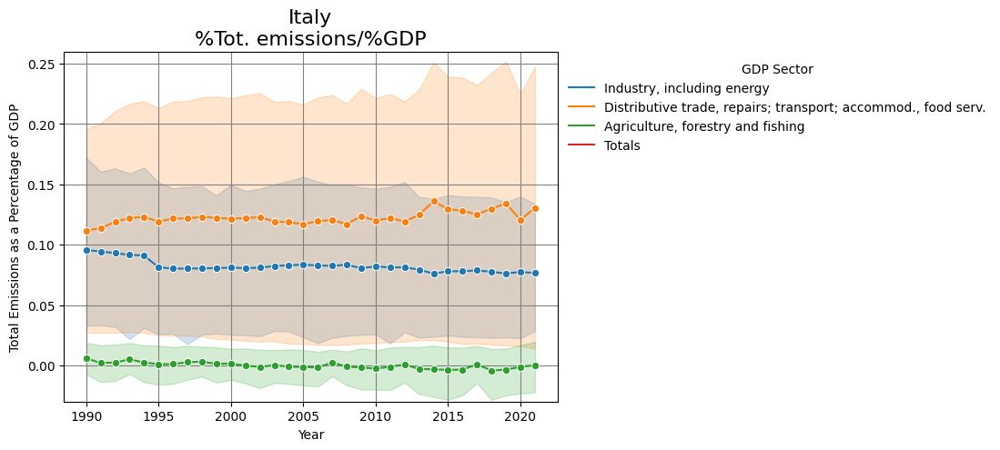

In [ ]:
ita_eu27_emi_reset = ita_eu27_emi_2.loc["Italy"].reset_index()


plt.figure(figsize=(7, 5))
sns.lineplot(x='Year', y= 'tot_emiss_%', hue = 'gdp_sector', data = ita_eu27_emi_reset, marker='o')


plt.ylim(-0.03, 0.26)
plt.title('Italy' + '\n' + '%Tot. emissions/%GDP', fontsize = 16)
plt.xlabel('Year')
plt.ylabel('Total Emissions as a Percentage of GDP')
plt.legend(title='GDP Sector', loc='upper left', bbox_to_anchor=(1, 1), frameon = False)
plt.grid(True, color = "grey")
plt.savefig('ITA_ita_eu27_emi_plot.svg', format='svg', facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')

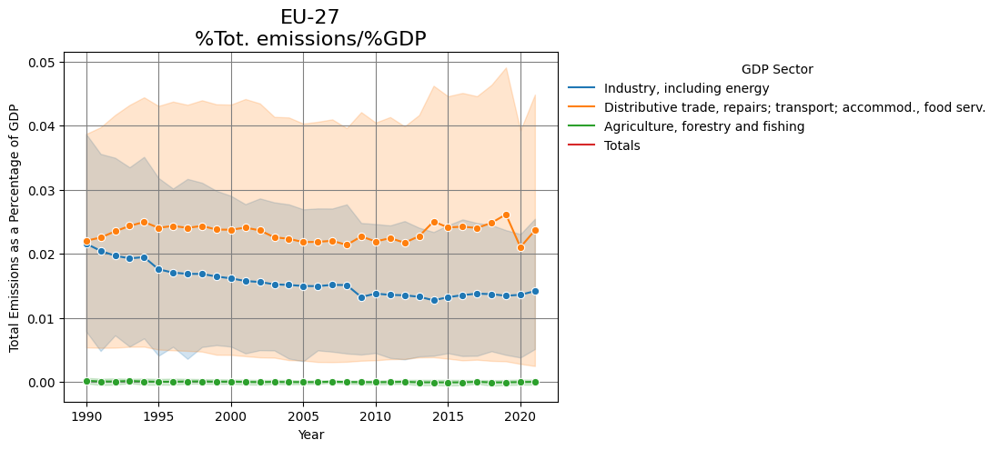

In [ ]:
ita_eu27_emi_reset = ita_eu27_emi_2.loc["Italy"].reset_index()


plt.figure(figsize=(7, 5))
sns.lineplot(x='Year', y= 'tot_emiss_%/gdp_%', hue = 'gdp_sector', data = ita_eu27_emi_reset, marker='o')


# plt.ylim(-0.001, 0.001)
plt.title('EU-27' + '\n' + '%Tot. emissions/%GDP', fontsize = 16)
plt.xlabel('Year')
plt.ylabel('Total Emissions as a Percentage of GDP')
plt.legend(title='GDP Sector', loc='upper left', bbox_to_anchor=(1, 1), frameon = False)
plt.grid(True, color = 'grey')
plt.savefig('EU_ita_eu27_emi_plot.svg', format='svg', facecolor=(1, 1, 1, 0), transparent=True, bbox_inches='tight')

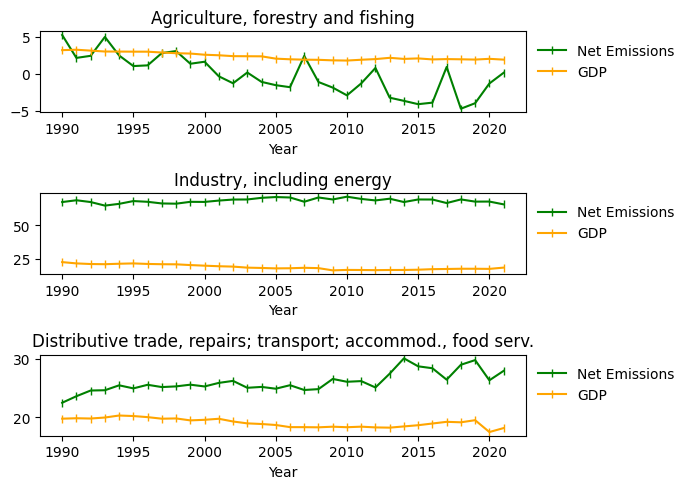

In [ ]:
# Italy
sub_selection = ita_eu27_emi_2.loc["Italy"][["gdp_sector",'net_emiss_%',"gdp_%"]].reset_index().set_index(["gdp_sector","Year"])
# sub_selection

colors = {'Net Emissions': 'green', 'GDP': 'orange'}

fig, axes = plt.subplots(3,1)
axes = axes.flatten()
for i,sector in enumerate(["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.']):
    ax = axes[i]
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : (group["net_emiss_%"].sum())*100).loc[sector].plot(ax = ax, label = "Net Emissions",marker='|', color=colors['Net Emissions'])
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : group["gdp_%"].min()).loc[sector].plot(ax = ax, label = "GDP",marker='|', color=colors['GDP'])

    ax.set_title(sector)
    ax.legend(bbox_to_anchor=(1,1), frameon = False)
plt.tight_layout()
plt.rc('figure', figsize=(7,5))
plt.savefig("ITA_GDP_emisionss_path.svg", facecolor = (1,1,1,0), transparent = True)

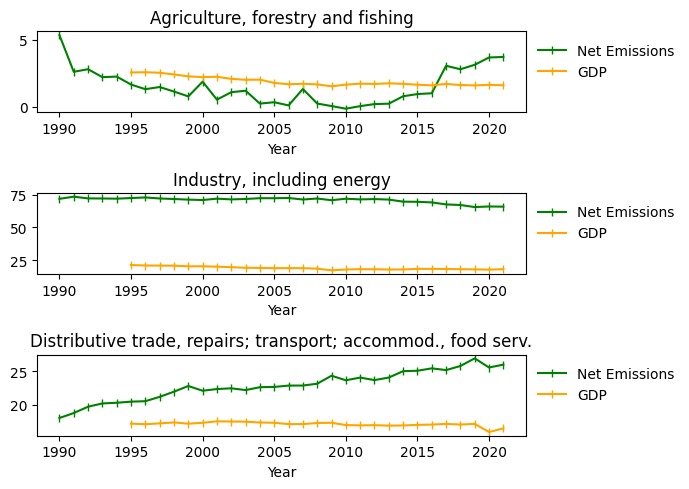

In [ ]:
# EU-27
sub_selection = ita_eu27_emi_2.loc["EU-27"][["gdp_sector",'net_emiss_%',"gdp_%"]].reset_index().set_index(["gdp_sector","Year"])

colors = {'Net Emissions': 'green', 'GDP': 'orange'}

fig, axes = plt.subplots(3,1)
axes = axes.flatten()
for i,sector in enumerate(["Agriculture, forestry and fishing","Industry, including energy",'Distributive trade, repairs; transport; accommod., food serv.']):
    ax = axes[i]
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : (group["net_emiss_%"].sum())*100).loc[sector].plot(ax = ax, label = "Net Emissions",marker='|', color=colors['Net Emissions'])
    sub_selection.reset_index().groupby(["gdp_sector","Year"]).apply(lambda group : group["gdp_%"].min()).loc[sector].plot(ax = ax, label = "GDP",marker='|', color=colors['GDP'])

    ax.set_title(sector)
    ax.legend(bbox_to_anchor= (1,1), frameon = False)
plt.tight_layout()
plt.rc('figure', figsize=(7, 5))
plt.savefig("EU_GDP_emisionss_path.svg", facecolor = (1,1,1,0), transparent = True, bbox_inches='tight')

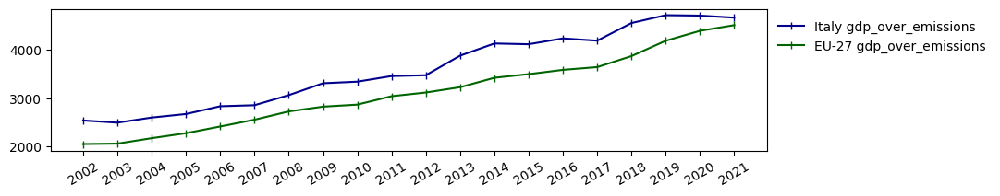

In [ ]:
#plotting the evolution of NEt emissions over GDP
colors = {'Italy gdp_over_emissions': '#00008B', 'EU-27 gdp_over_emissions': '#006400'}
plt.rc('figure', figsize = (10,2))
plt.plot(gdp_ghg_absvals.loc["Italy"].loc["Total net emissions (UNFCCC)"]['gdp_over_emissions'], label = 'Italy gdp_over_emissions', marker = '|', color = colors['Italy gdp_over_emissions'])
plt.plot(gdp_ghg_absvals.loc["EU-27"].loc["Total net emissions (UNFCCC)"]['gdp_over_emissions'], label = 'EU-27 gdp_over_emissions', marker = '|', color = colors['EU-27 gdp_over_emissions'])
plt.legend(bbox_to_anchor = (1,1), frameon = False)
plt.xticks(range(2002, 2022), rotation=30)
plt.savefig("evolution.svg", facecolor = (1,1,1,0), transparent = True, bbox_inches='tight')

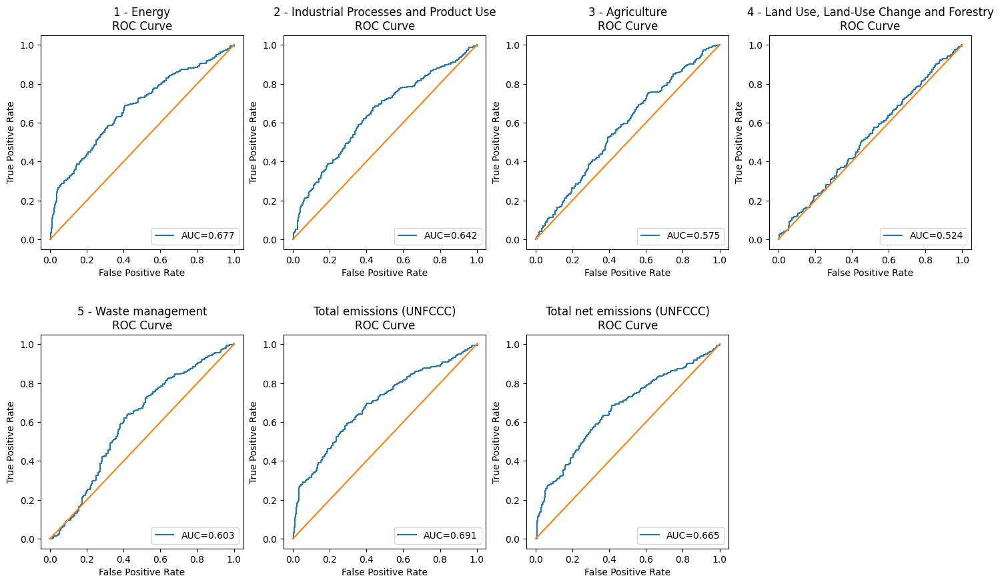

In [ ]:
plt.rc('figure', figsize=(18, 10))

fig = plt.figure()
axes = [fig.add_subplot(2, 4, i) for i in range(1,8)]
fig.subplots_adjust(hspace=.4)

for i,sector in enumerate(emissions_gdp_var.index.get_level_values("Sector_name").unique()):
    X = emissions_gdp_var.loc[sector][["per_capita_GDP_var"]]
    y = np.asarray(emissions_gdp_var.loc[sector].per_capita_emiss_variation<=0)
    # A positive value means that percapita emissions decreased from the previous year

    model = LogisticRegression()
    model.fit(X,y)
    y_pred_proba= model.predict_proba(X)[::,1]
    false_positive_rate, true_positive_rate, other_values  = metrics.roc_curve(y, y_pred_proba)
    auc= metrics.roc_auc_score(y, y_pred_proba)
    ax = axes[i]
    ax.plot(false_positive_rate, true_positive_rate, label="AUC="+str(round(auc,3)))
    ax.set_title(sector + "\n" +'ROC Curve')
    ax.set_ylabel('True Positive Rate')
    ax.set_xlabel('False Positive Rate')
    ax.legend(loc=4)
    ax.plot([0,1],[0,1])

    fig.savefig("roc_curves.svg", facecolor = (1,1,1,0), transparent = True)